In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/students-academic-performance-data/StudentsData.csv


# Load The dataset

In [2]:
import pandas as pd

# Load the dataset
file_path = "/kaggle/input/students-academic-performance-data/StudentsData.csv"
df = pd.read_csv(file_path)

# Display basic information
print(df.info())  
print(df.head()) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 38 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Timestamp                   610 non-null    object 
 1   Email                       0 non-null      float64
 2   Gender                      608 non-null    object 
 3   Marital Status              609 non-null    object 
 4   Department                  608 non-null    object 
 5   GPA of last semester        608 non-null    object 
 6   CGPA                        609 non-null    object 
 7   Class attendance            608 non-null    object 
 8   Self-study per week         608 non-null    object 
 9   Homework on time            609 non-null    object 
 10  Study materials access      606 non-null    object 
 11  Study environment           606 non-null    object 
 12  Library Usage               606 non-null    object 
 13  Interaction with teachers   607 non

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


# Drop irrelevant columns

In [3]:
df.drop(columns=['Timestamp','Email','Department','Challenges in studies', 'External factors'], inplace=True)


In [4]:
# Check updated dataframe
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Gender                      608 non-null    object
 1   Marital Status              609 non-null    object
 2   GPA of last semester        608 non-null    object
 3   CGPA                        609 non-null    object
 4   Class attendance            608 non-null    object
 5   Self-study per week         608 non-null    object
 6   Homework on time            609 non-null    object
 7   Study materials access      606 non-null    object
 8   Study environment           606 non-null    object
 9   Library Usage               606 non-null    object
 10  Interaction with teachers   607 non-null    object
 11  Peers support               607 non-null    object
 12  Stress                      606 non-null    object
 13  Current living situation    608 non-null    object

# Handle Missing Values

In [5]:
# Fill missing values with mode (most common value)
df.fillna(df.mode().iloc[0], inplace=True)

# Verify no missing values remain
print("Total missing values:", df.isnull().sum().sum())  # Should print 0 if handled correctly

Total missing values: 0


In [6]:
df.to_csv("cleaned_dataset.csv", index=False)  # Save after dropping
df = pd.read_csv("cleaned_dataset.csv")  # Reload the cleaned dataset

In [7]:
df.isnull().sum()

Gender                        0
Marital Status                0
GPA of last semester          0
CGPA                          0
Class attendance              0
Self-study per week           0
Homework on time              0
Study materials access        0
Study environment             0
Library Usage                 0
Interaction with teachers     0
Peers support                 0
Stress                        0
Current living situation      0
Financial aid                 0
Employment                    0
Own expenses                  0
Contribution on family        0
Financial difficulties        0
Relationship with parents     0
Parents support               0
Internet access               0
Online resource usage         0
Technology comfort            0
Motivation                    0
Extracurricular activities    0
Sleeping hours                0
Caffeine consumtion           0
Social media usage            0
Health condition              0
Engagement in hobbies         0
Primary 

# Categorize CGPA

In [8]:
print(df['CGPA'].head(10))  # Show first 10 CGPA values


0        3.26-3.5 (Good)
1       3-3.25 (Average)
2        3.26-3.5 (Good)
3        3.26-3.5 (Good)
4       3-3.25 (Average)
5       3-3.25 (Average)
6    3.76- higher (Best)
7     3.51-3.75 (Better)
8     3.51-3.75 (Better)
9        3.26-3.5 (Good)
Name: CGPA, dtype: object


In [9]:
# Define the correct categorization function
def categorize_cgpa(value):
    value = str(value).strip()  # Remove spaces and ensure it's a string
    if 'Below 3' in value:
        return 'Below Average'
    elif '3-3.25' in value:
        return 'Average'
    elif '3.26-3.5' in value:
        return 'Good'
    elif '3.51-3.75' in value:
        return 'Better'
    elif '3.76' in value or '4' in value:
        return 'Best'
    else:
        return 'Unknown'  # Catch any unexpected values

df['CGPA'] = df['CGPA'].apply(categorize_cgpa)

# Check the new distribution
print(df['CGPA'].value_counts())


CGPA
Average          185
Good             162
Better           141
Best              71
Below Average     51
Name: count, dtype: int64


In [10]:
print(df.dtypes)

Gender                        object
Marital Status                object
GPA of last semester          object
CGPA                          object
Class attendance              object
Self-study per week           object
Homework on time              object
Study materials access        object
Study environment             object
Library Usage                 object
Interaction with teachers     object
Peers support                 object
Stress                        object
Current living situation      object
Financial aid                 object
Employment                    object
Own expenses                  object
Contribution on family        object
Financial difficulties        object
Relationship with parents     object
Parents support               object
Internet access               object
Online resource usage         object
Technology comfort            object
Motivation                    object
Extracurricular activities    object
Sleeping hours                object
C

# Encoding Categorical Features 

In [11]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Load your dataset
df = pd.read_csv("/kaggle/working/cleaned_dataset.csv")

### ✅ **Step 1: Reapply CGPA Categorization**
# Ensure CGPA is categorized correctly before encoding
def categorize_cgpa(value):
    value = str(value).strip()  # Remove spaces and ensure it's a string
    if 'Below 3' in value:
        return 'Below Average'
    elif '3-3.25' in value:
        return 'Average'
    elif '3.26-3.5' in value:
        return 'Good'
    elif '3.51-3.75' in value:
        return 'Better'
    elif '3.76' in value or '4' in value:
        return 'Best'
    else:
        return 'Unknown'  # Catch unexpected values

df['CGPA'] = df['CGPA'].apply(categorize_cgpa)

print("✅ CGPA categorized correctly.")

### ✅ **Step 2: Apply Label Encoding (CGPA First)**
# Encode CGPA separately to control the label order
cgpa_mapping = {'Below Average': 0, 'Average': 1, 'Good': 2, 'Better': 3, 'Best': 4}
df['CGPA'] = df['CGPA'].map(cgpa_mapping)

print("✅ CGPA encoded correctly:", df['CGPA'].unique())  # Should be [0,1,2,3,4]

### ✅ **Step 3: Apply Label Encoding to Other Categorical Columns**
# Identify remaining categorical columns (excluding CGPA)
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])  # Convert categories into numerical labels
    label_encoders[col] = le  # Store encoders for reference

print("✅ Label Encoding applied to all categorical columns.")

### ✅ **Step 4: Convert Boolean Values to 0/1**
df = df.map(lambda x: int(x) if isinstance(x, bool) else x)

print("✅ All columns are numeric now!")
print(f"Final Feature Count: {df.shape[1]}")  # Should remain 33

### ✅ **Step 5: Save Unscaled Version**
df_unscaled = df.copy()
df_unscaled.to_csv("processed_unscaled.csv", index=False)
print("✅ Saved unscaled dataset.")

### ✅ **Step 6: Apply Feature Scaling (Except CGPA)**
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled.iloc[:, :-1] = scaler.fit_transform(df_scaled.iloc[:, :-1])  # Scale all except CGPA

df_scaled.to_csv("processed_scaled.csv", index=False)
print("✅ Feature Scaling applied successfully (StandardScaler)")

print("✅ Preprocessing complete! Features retained without increase.")

✅ CGPA categorized correctly.
✅ CGPA encoded correctly: [2 1 4 3 0]
✅ Label Encoding applied to all categorical columns.
✅ All columns are numeric now!
Final Feature Count: 33
✅ Saved unscaled dataset.
✅ Feature Scaling applied successfully (StandardScaler)
✅ Preprocessing complete! Features retained without increase.


In [12]:
print("\nData Types After Encoding:")
print(df.dtypes.value_counts())  # Should show only int and float types


Data Types After Encoding:
int64    33
Name: count, dtype: int64


In [13]:
for col in label_encoders.keys():
    print(f"\nUnique values in '{col}' after encoding: {df[col].unique()}")


Unique values in 'Gender' after encoding: [0 1]

Unique values in 'Marital Status' after encoding: [1 0]

Unique values in 'GPA of last semester' after encoding: [2 1 0 3 4]

Unique values in 'Class attendance' after encoding: [3 1 2 0]

Unique values in 'Self-study per week' after encoding: [0 1 2 3]

Unique values in 'Homework on time' after encoding: [1 0 3 2]

Unique values in 'Study materials access' after encoding: [1 2 0]

Unique values in 'Study environment' after encoding: [2 0 1]

Unique values in 'Library Usage' after encoding: [2 3 1 0]

Unique values in 'Interaction with teachers' after encoding: [3 2 1 0]

Unique values in 'Peers support' after encoding: [2 1 0]

Unique values in 'Stress' after encoding: [2 3 0 1]

Unique values in 'Current living situation' after encoding: [1 2 3 0]

Unique values in 'Financial aid' after encoding: [2 0 1]

Unique values in 'Employment' after encoding: [0 3 1 2]

Unique values in 'Own expenses' after encoding: [0 2 1]

Unique values in 

# Confirm Preprocessing is Complete

In [14]:
#Check for NaNs or Infinite Values
print(df.isnull().sum().sum())  # Should be 0
print(df.isin([np.nan, np.inf, -np.inf]).sum().sum())  # Should be 0

0
0


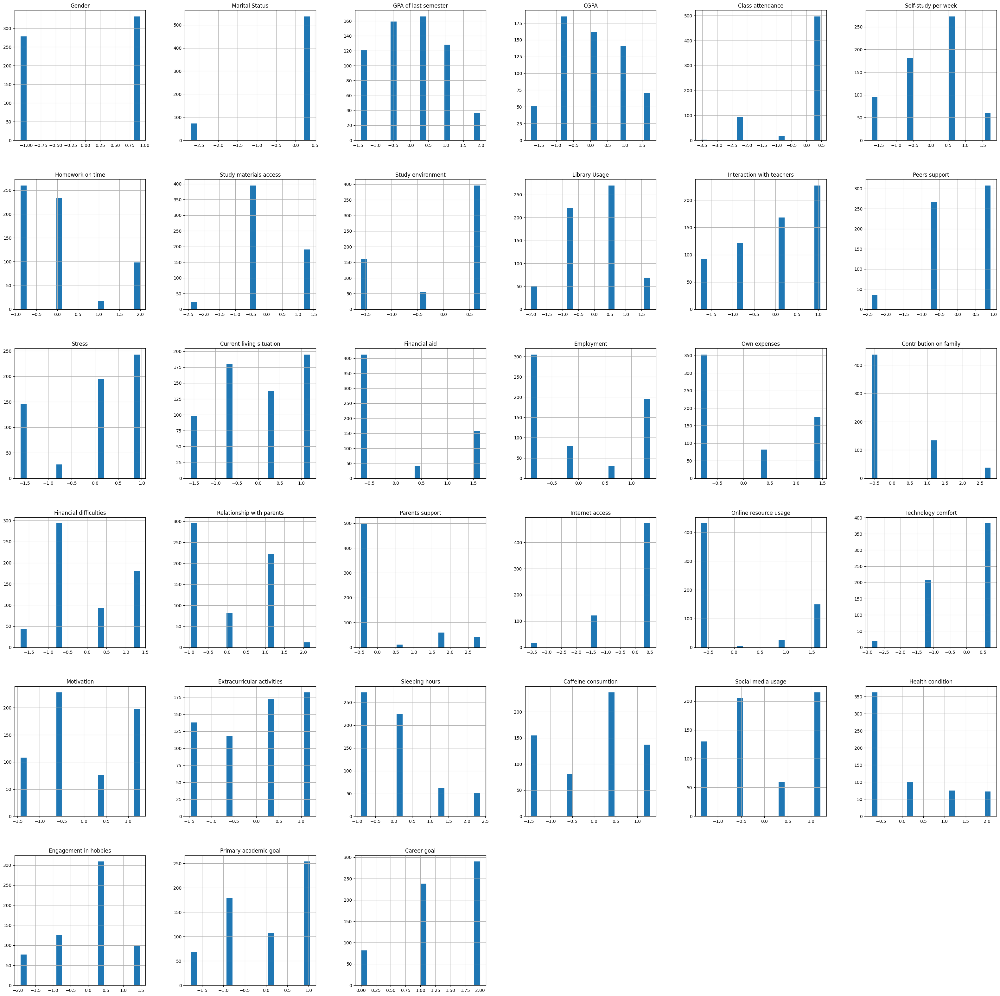

In [15]:
#Check Feature Distributions After Scaling
import matplotlib.pyplot as plt
df_scaled.hist(figsize=(40, 40), bins=20)
plt.show()

In [16]:
#Confirm Target Variable Distribution
print(df['CGPA'].value_counts(normalize=True))  

CGPA
1    0.303279
2    0.265574
3    0.231148
4    0.116393
0    0.083607
Name: proportion, dtype: float64


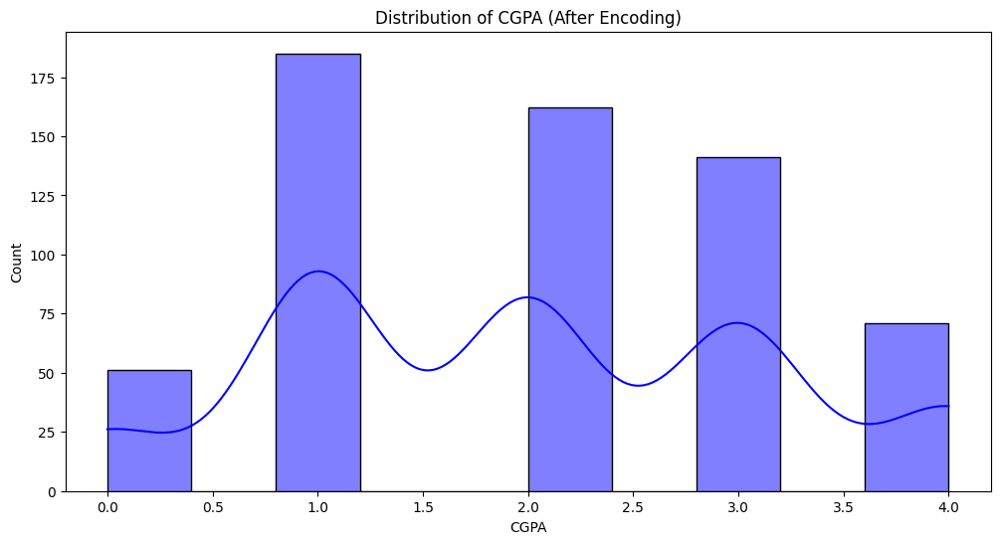

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.histplot(df["CGPA"], bins=10, kde=True, color="blue")
plt.title("Distribution of CGPA (After Encoding)")
plt.show()

# Exploratory Data Analysis

# 1.Load the Data and Get an Overview

In [18]:
import pandas as pd

# Load the processed dataset
df = pd.read_csv("processed_unscaled.csv")  # Using unscaled data for better interpretability

# 1️⃣ Dataset Shape
print(f"Dataset Shape: {df.shape}")

# 2️⃣ Basic Info
print("\nDataset Info:")
print(df.info())

# 3️⃣ Check for missing values
missing_values = df.isnull().sum()
print("\nMissing Values in Each Column:")
print(missing_values[missing_values > 0])  # Show only columns with missing values

# 4️⃣ Summary Statistics
print("\nSummary Statistics:")
print(df.describe())  # Descriptive stats for numerical columns

Dataset Shape: (610, 33)

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 33 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   Gender                      610 non-null    int64
 1   Marital Status              610 non-null    int64
 2   GPA of last semester        610 non-null    int64
 3   CGPA                        610 non-null    int64
 4   Class attendance            610 non-null    int64
 5   Self-study per week         610 non-null    int64
 6   Homework on time            610 non-null    int64
 7   Study materials access      610 non-null    int64
 8   Study environment           610 non-null    int64
 9   Library Usage               610 non-null    int64
 10  Interaction with teachers   610 non-null    int64
 11  Peers support               610 non-null    int64
 12  Stress                      610 non-null    int64
 13  Current living situation 

# 2.Target Variable (CGPA) Distribution

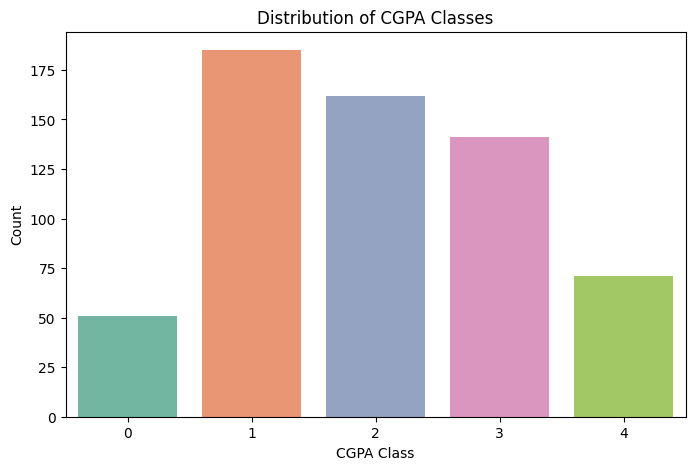


CGPA Class Distribution (Percentage):
CGPA
1    30.327869
2    26.557377
3    23.114754
4    11.639344
0     8.360656
Name: proportion, dtype: float64


In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1️⃣ Count plot for CGPA classes
plt.figure(figsize=(8, 5))
sns.countplot(x="CGPA", data=df, palette="Set2")
plt.title("Distribution of CGPA Classes")
plt.xlabel("CGPA Class")
plt.ylabel("Count")
plt.show()

# 2️⃣ Check CGPA class distribution in percentage
print("\nCGPA Class Distribution (Percentage):")
print(df['CGPA'].value_counts(normalize=True) * 100)

# 3.Numerical Feature Distributions

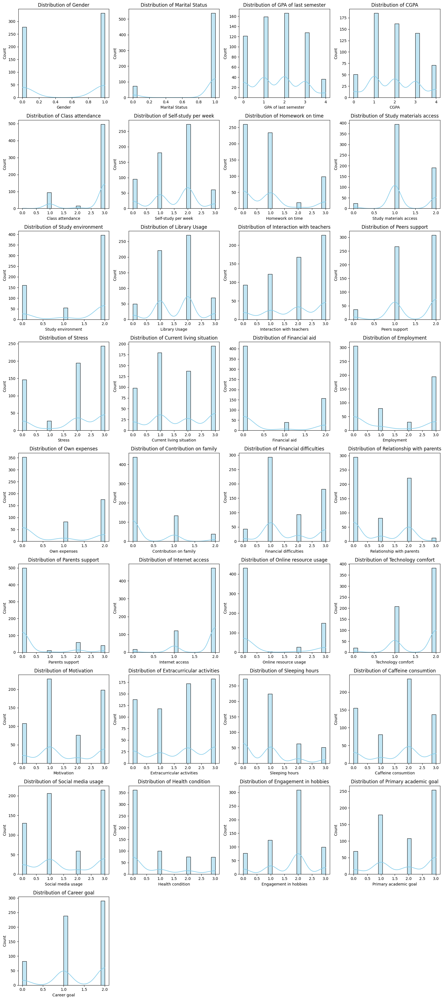

In [20]:
# Select only numerical features
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns

# Set number of rows and columns dynamically for numerical features
import numpy as np
rows = (len(numerical_features) // 4) + 1
cols = min(4, len(numerical_features))

# Histograms for numerical features
plt.figure(figsize=(cols * 4, rows * 4))
for i, feature in enumerate(numerical_features, 1):  
    plt.subplot(rows, cols, i)
    sns.histplot(df[feature], kde=True, bins=20, color="skyblue")
    plt.title(f"Distribution of {feature}")
plt.tight_layout()
plt.show()

# 4.Detecting Outliers in Numerical Features

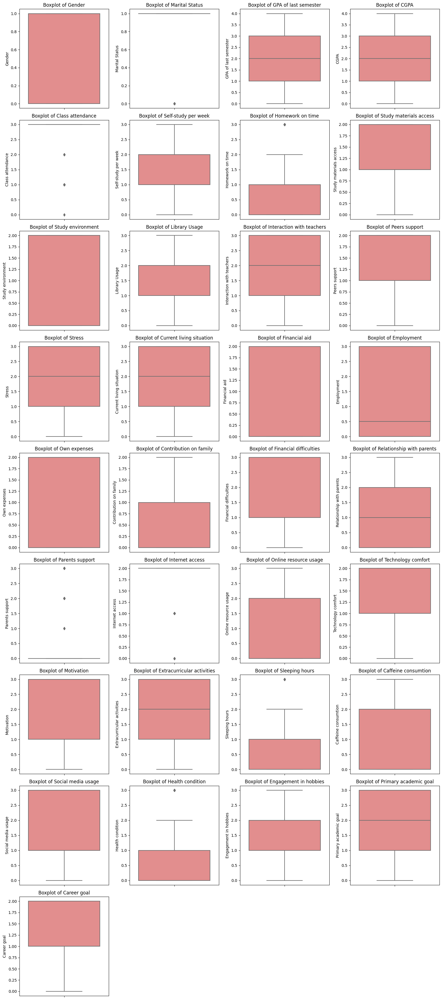

In [21]:
# Boxplots for Numerical Features (detecting outliers)
plt.figure(figsize=(cols * 4, rows * 4))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(rows, cols, i)
    sns.boxplot(y=df[feature], color="lightcoral")
    plt.title(f"Boxplot of {feature}")
plt.tight_layout()
plt.show()

# 5.Categorical Feature Distribution

In [22]:
# Select categorical features
categorical_features = df.select_dtypes(include=['object']).columns

num_categorical = len(categorical_features)
if num_categorical > 0:
    rows = (num_categorical // 4) + 1
    cols = min(4, num_categorical)

    # Count plots for categorical features
    plt.figure(figsize=(cols * 4, rows * 4))
    for i, feature in enumerate(categorical_features, 1):
        plt.subplot(rows, cols, i)
        sns.countplot(x=df[feature], palette="pastel")
        plt.title(f"Countplot of {feature}")
        plt.xticks(rotation=45)  # Rotate for better visibility
    plt.tight_layout()
    plt.show()
else:
    print("No categorical features found in the dataset.")

No categorical features found in the dataset.


# 6.Correlation Analysis (Numerical Features Only)

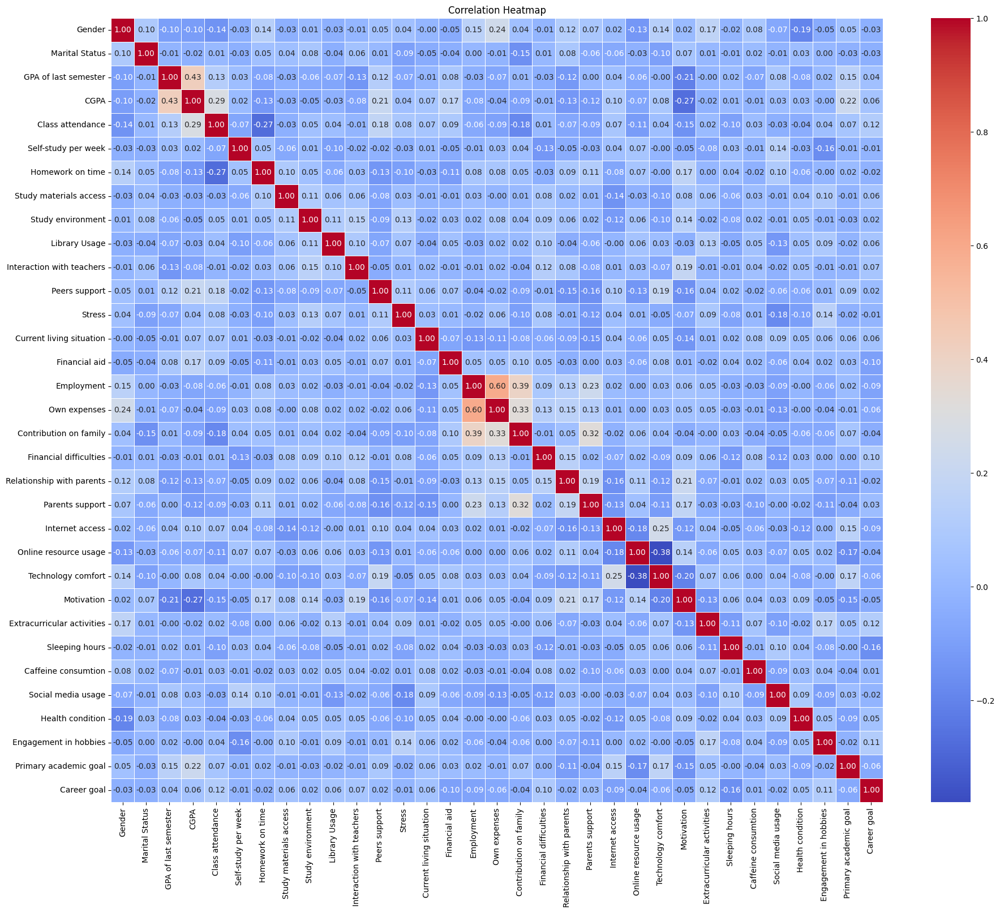

In [23]:
# Compute correlation matrix
correlation_matrix = df.corr()

# Plot heatmap
plt.figure(figsize=(22,18))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

# 7.Checking Class Imbalance in Target Variable

In [24]:
from collections import Counter

# Count instances of each class
class_counts = Counter(df["CGPA"])
print("Class Distribution:", class_counts)

# If imbalance exists, print a suggestion
imbalance_threshold = 0.10  # 10% threshold
class_percentages = {k: v / sum(class_counts.values()) for k, v in class_counts.items()}
if any(v < imbalance_threshold for v in class_percentages.values()):
    print("⚠️ Class imbalance detected! Consider applying class balancing techniques.")
else:
    print("✅ Class distribution looks balanced.")

Class Distribution: Counter({1: 185, 2: 162, 3: 141, 4: 71, 0: 51})
⚠️ Class imbalance detected! Consider applying class balancing techniques.


# Class Balancing

In [25]:
from imblearn.over_sampling import SMOTE
from collections import Counter

X = df_unscaled.drop(columns=['CGPA'])  # Features
y = df_unscaled['CGPA']  # Target variable (Categorical Labels)

# Apply SMOTE to balance classes
smote = SMOTE(sampling_strategy="auto", random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("After Balancing:", Counter(y_resampled))

After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 0. Model implementation using all features before feature selection

# 0.1 Logistic Regression


Logistic Regression Performance (All Features):
Average Accuracy: 0.5310
Training Time: 1.1992 sec
Testing Time: 1.1864 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.68      0.65       185
           1       0.45      0.48      0.46       185
           2       0.36      0.30      0.32       185
           3       0.49      0.45      0.47       185
           4       0.67      0.76      0.71       185

    accuracy                           0.53       925
   macro avg       0.52      0.53      0.52       925
weighted avg       0.52      0.53      0.52       925



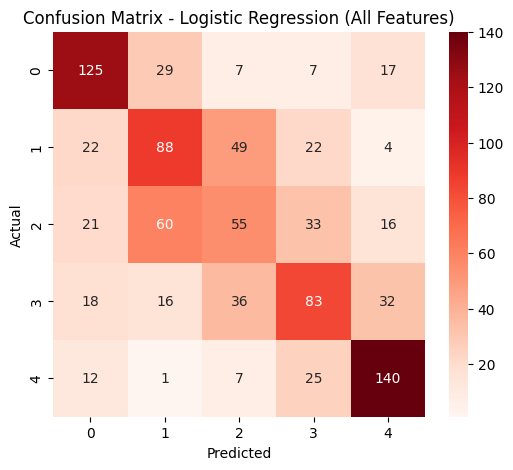

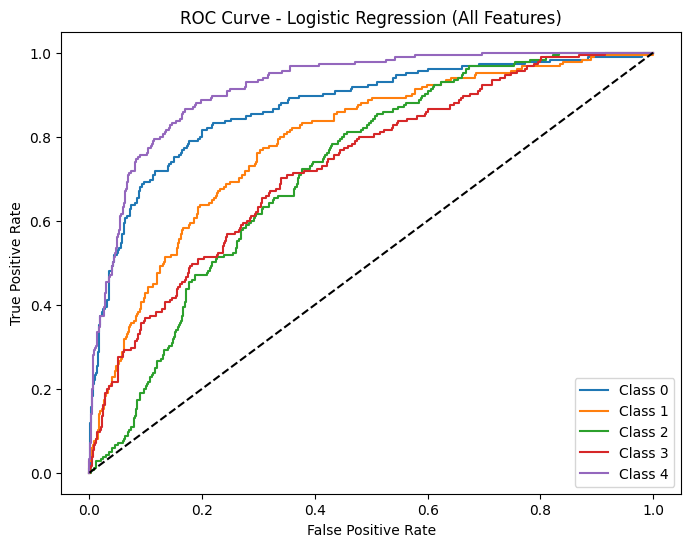

In [26]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_resampled, y_resampled, cv=10)
end_test = time.time()

# Performance metrics
print("\nLogistic Regression Performance (All Features):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

# Store results
lr_accuracy_all = cv_scores.mean()
lr_train_time_all = end_train - start_train
lr_test_time_all = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (All Features)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(log_reg, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression (All Features)")
plt.legend()
plt.show()


# 0.2 Random Forest Classifier 


Random Forest Classifier Performance (All Features Set):
Average Accuracy: 0.7147
Training Time: 2.5841 sec
Testing Time: 2.5869 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.93      0.89       185
           1       0.62      0.53      0.57       185
           2       0.55      0.57      0.56       185
           3       0.70      0.63      0.66       185
           4       0.83      0.91      0.87       185

    accuracy                           0.71       925
   macro avg       0.71      0.71      0.71       925
weighted avg       0.71      0.71      0.71       925



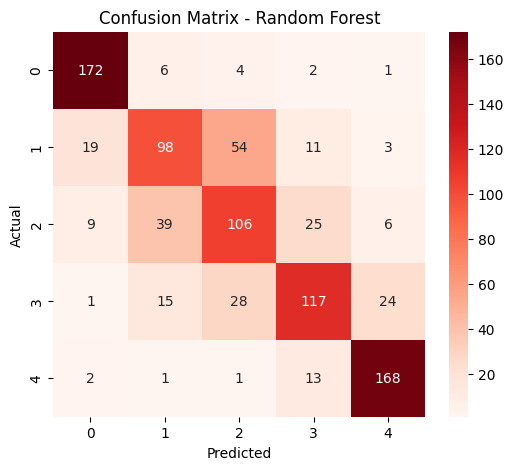

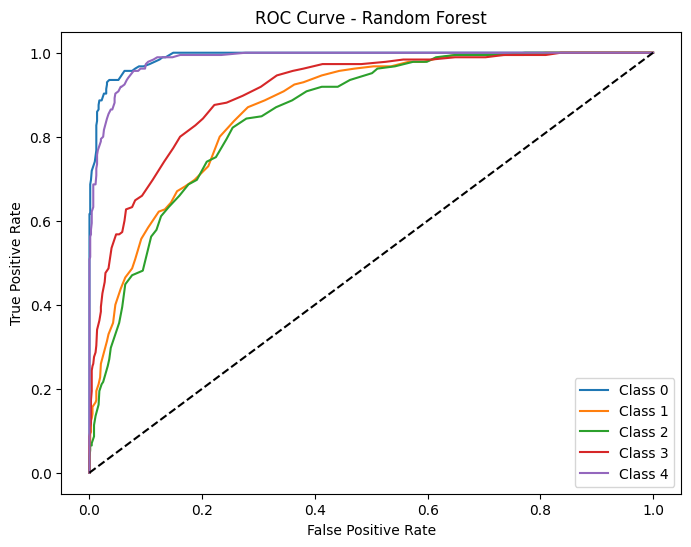

In [27]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Random Forest
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

# Performance metrics
print("\nRandom Forest Classifier Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

rf_accuracy_all = cv_scores.mean()
rf_train_time_all = end_train - start_train
rf_test_time_all = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 0.3 Gradient Boosting


Gradient Boosting Classifier Performance (All Features Set):
Average Accuracy: 0.6649
Training Time: 13.5002 sec
Testing Time: 13.5363 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.89      0.88       185
           1       0.59      0.51      0.54       185
           2       0.48      0.49      0.48       185
           3       0.58      0.58      0.58       185
           4       0.80      0.85      0.82       185

    accuracy                           0.66       925
   macro avg       0.66      0.66      0.66       925
weighted avg       0.66      0.66      0.66       925



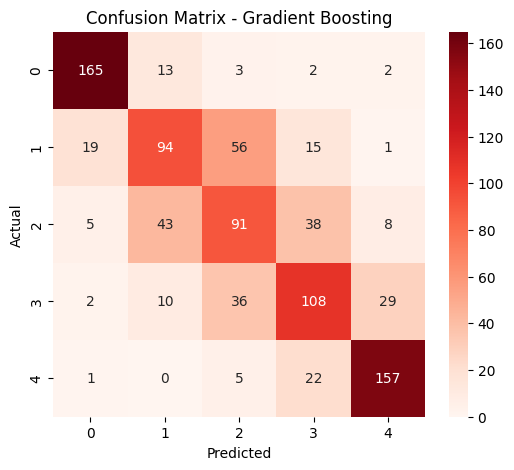

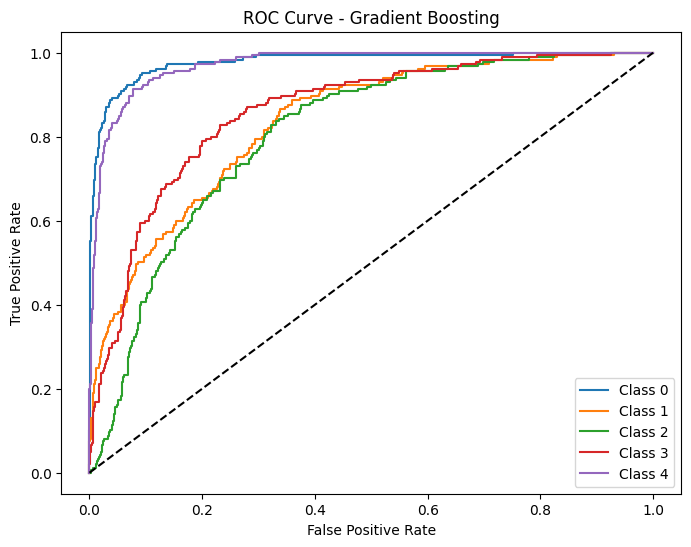

In [28]:
from sklearn.ensemble import GradientBoostingClassifier

gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(gb_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(gb_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\nGradient Boosting Classifier Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

gb_accuracy_all = cv_scores.mean()
gb_train_time_all = end_train - start_train
gb_test_time_all = end_test - start_test

conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

y_prob = cross_val_predict(gb_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()


# 0.4 SVM


SVM Performance (All Features Set):
Average Accuracy: 0.6509
Training Time: 2.5499 sec
Testing Time: 2.5682 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.85      0.85       185
           1       0.51      0.51      0.51       185
           2       0.45      0.44      0.45       185
           3       0.62      0.57      0.60       185
           4       0.81      0.88      0.84       185

    accuracy                           0.65       925
   macro avg       0.65      0.65      0.65       925
weighted avg       0.65      0.65      0.65       925



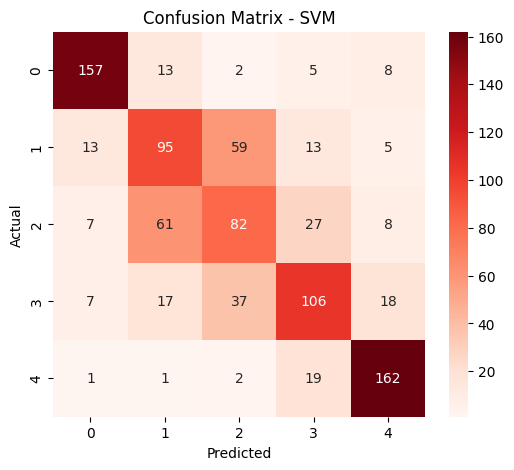

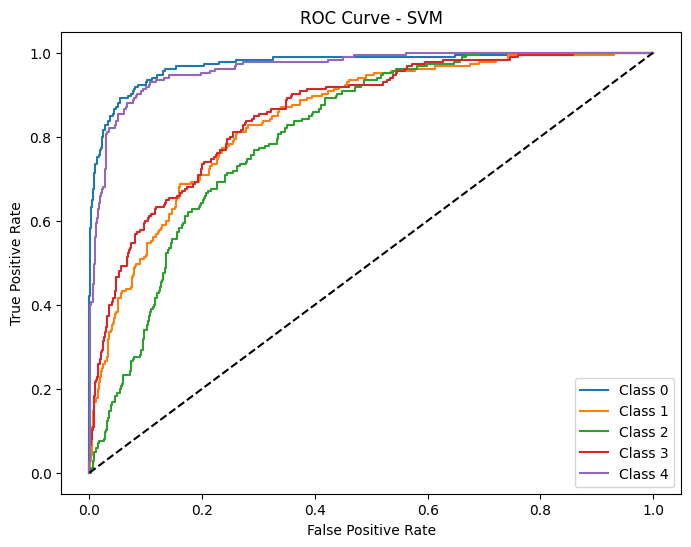

In [29]:
from sklearn.svm import SVC

svm_clf = SVC(probability=True, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(svm_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(svm_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\nSVM Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

svm_accuracy_all = cv_scores.mean()
svm_train_time_all = end_train - start_train
svm_test_time_all = end_test - start_test

conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

y_prob = cross_val_predict(svm_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()


# 0.5 KNN


KNN Performance (All Features Set):
Average Accuracy: 0.6131
Training Time: 0.1546 sec
Testing Time: 0.1431 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.95      0.76       185
           1       0.50      0.37      0.42       185
           2       0.49      0.39      0.43       185
           3       0.64      0.44      0.52       185
           4       0.73      0.92      0.81       185

    accuracy                           0.61       925
   macro avg       0.60      0.61      0.59       925
weighted avg       0.60      0.61      0.59       925



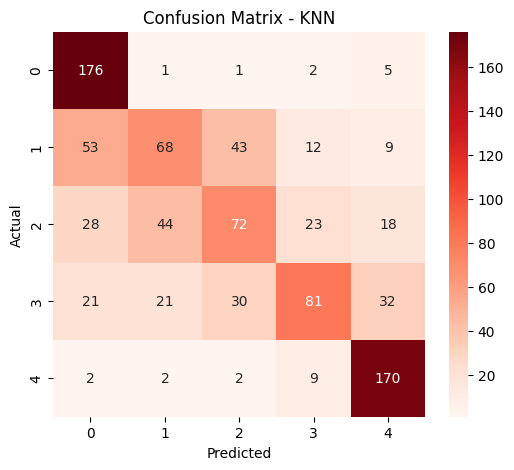

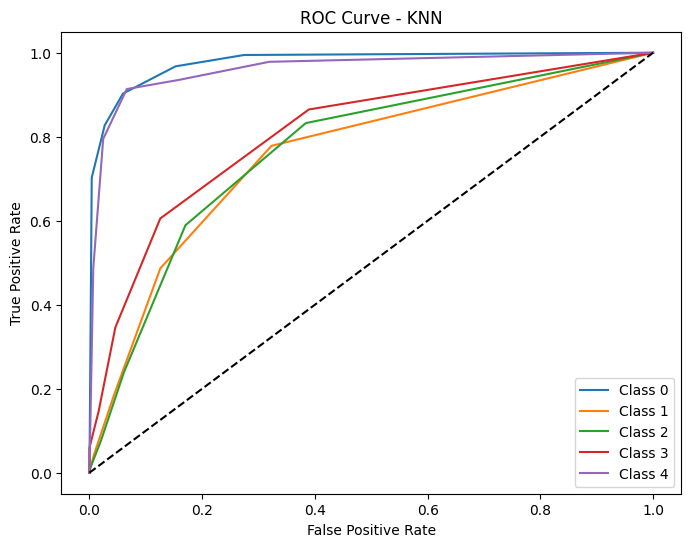

In [30]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier(n_neighbors=5)

start_train = time.time()
cv_scores = cross_val_score(knn_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(knn_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\nKNN Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

knn_accuracy_all = cv_scores.mean()
knn_train_time_all = end_train - start_train
knn_test_time_all = end_test - start_test

conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

y_prob = cross_val_predict(knn_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()


# 0.6 XGBoost Classifier


XGBoost Performance (All Features Set):
Average Accuracy: 0.6877
Training Time: 2.6251 sec
Testing Time: 2.7112 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       185
           1       0.57      0.49      0.53       185
           2       0.51      0.54      0.52       185
           3       0.64      0.63      0.63       185
           4       0.84      0.88      0.86       185

    accuracy                           0.69       925
   macro avg       0.68      0.69      0.68       925
weighted avg       0.68      0.69      0.68       925



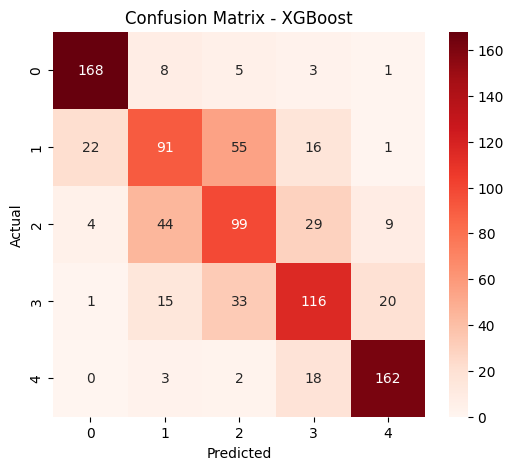

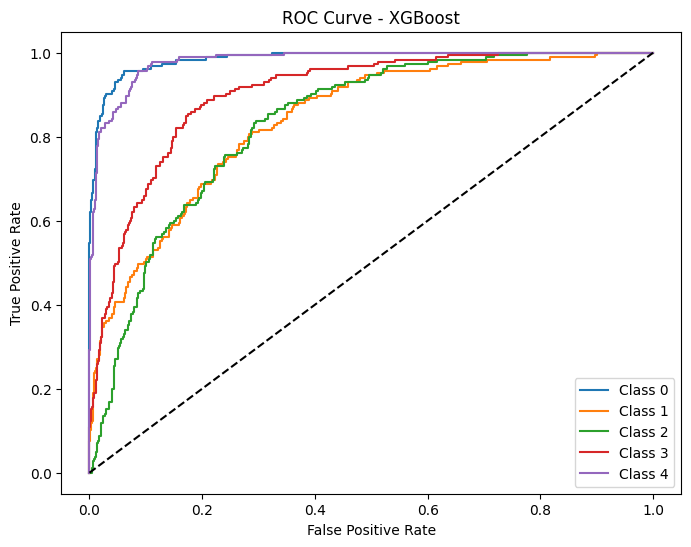

In [31]:
from xgboost import XGBClassifier

xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

start_train = time.time()
cv_scores = cross_val_score(xgb_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(xgb_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\nXGBoost Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

xgb_accuracy_all = cv_scores.mean()
xgb_train_time_all = end_train - start_train
xgb_test_time_all = end_test - start_test

conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

y_prob = cross_val_predict(xgb_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.show()


# 0.7 MLP


MLP Classifier Performance (All Features Set):
Average Accuracy: 0.6283
Training Time: 23.8545 sec
Testing Time: 22.8180 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.89      0.86       185
           1       0.51      0.45      0.48       185
           2       0.41      0.39      0.40       185
           3       0.57      0.53      0.55       185
           4       0.76      0.88      0.81       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.62       925
weighted avg       0.62      0.63      0.62       925



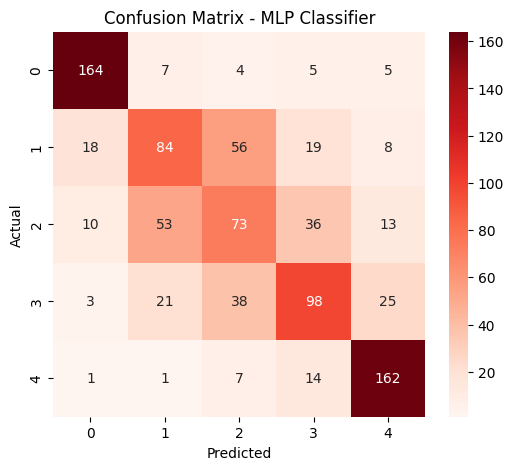

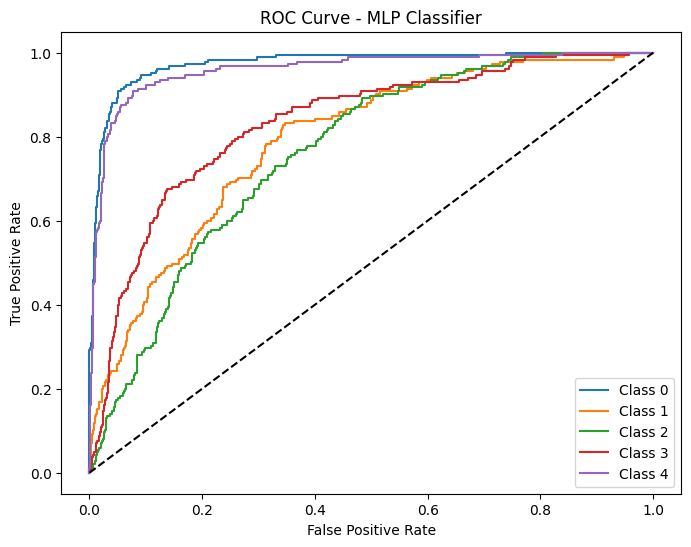

In [32]:
from sklearn.neural_network import MLPClassifier

mlp_clf = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(mlp_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(mlp_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\nMLP Classifier Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

mlp_accuracy_all = cv_scores.mean()
mlp_train_time_all = end_train - start_train
mlp_test_time_all = end_test - start_test

conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier")
plt.show()

y_prob = cross_val_predict(mlp_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier")
plt.legend()
plt.show()


# 0.8 CatBoost Classifier


CatBoost Classifier Performance (All Features Set):
Average Accuracy: 0.7082
Training Time: 17.0113 sec
Testing Time: 17.1401 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.92      0.90       185
           1       0.58      0.51      0.54       185
           2       0.52      0.51      0.52       185
           3       0.68      0.68      0.68       185
           4       0.83      0.92      0.87       185

    accuracy                           0.71       925
   macro avg       0.70      0.71      0.70       925
weighted avg       0.70      0.71      0.70       925



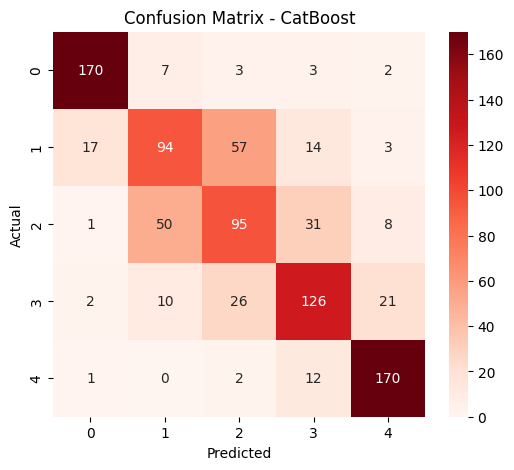

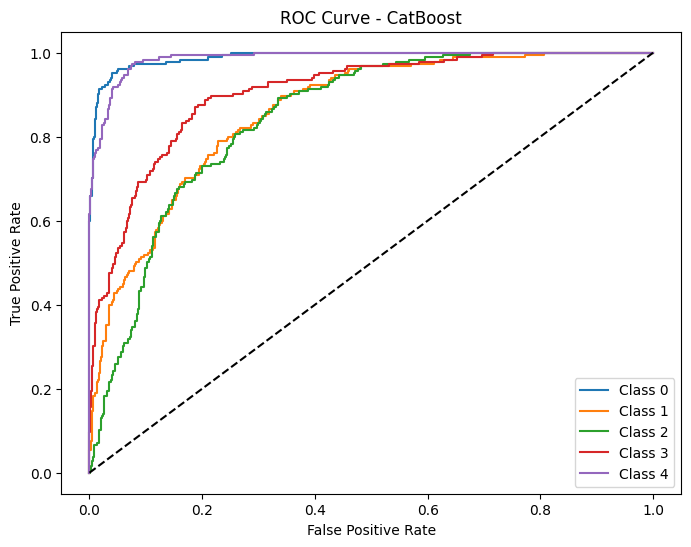

In [33]:
from catboost import CatBoostClassifier

cat_clf = CatBoostClassifier(verbose=0, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(cat_clf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(cat_clf, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\nCatBoost Classifier Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

cat_accuracy_all = cv_scores.mean()
cat_train_time_all = end_train - start_train
cat_test_time_all = end_test - start_test

conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()

y_prob = cross_val_predict(cat_clf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost")
plt.legend()
plt.show()


# Model Comparison of All Features Set


Model Performance Comparison (All Features Set):

                 Model  Accuracy  Training Time (sec)  Testing Time (sec)
0  Logistic Regression  0.530972             1.199244            1.186443
1        Random Forest  0.714656             2.584114            2.586887
2    Gradient Boosting  0.664914            13.500162           13.536303
3                  SVM  0.650853             2.549876            2.568204
4                  KNN  0.613090             0.154558            0.143116
5              XGBoost  0.687681             2.625149            2.711174
6                  MLP  0.628296            23.854464           22.817974
7             CatBoost  0.708216            17.011332           17.140143


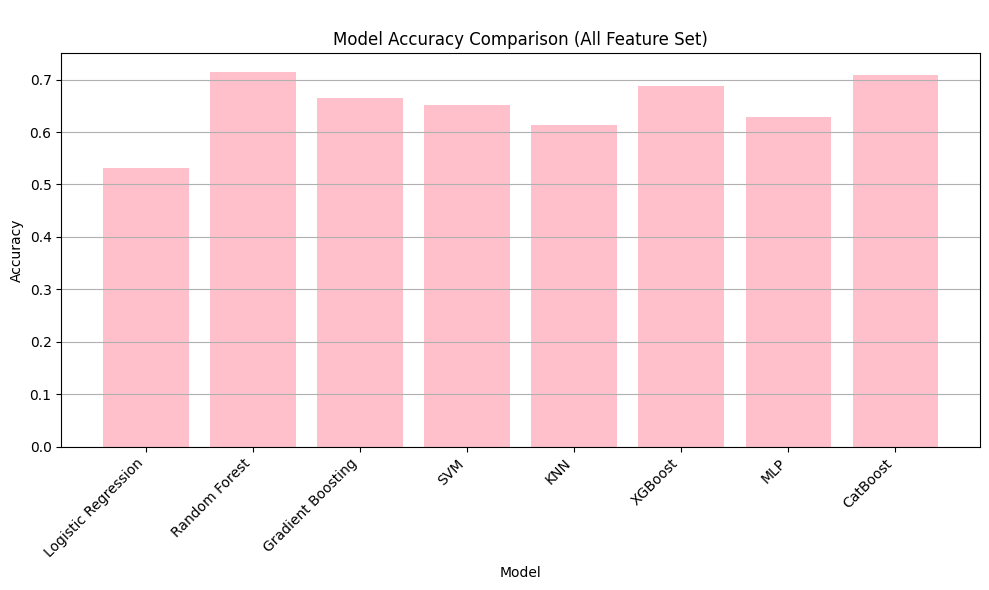

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Create DataFrame for comparison
comparison_all = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'Gradient Boosting', 'SVM', 
              'KNN', 'XGBoost', 'MLP', 'CatBoost'],
    'Accuracy': [lr_accuracy_all, rf_accuracy_all, gb_accuracy_all, svm_accuracy_all,
                         knn_accuracy_all, xgb_accuracy_all, mlp_accuracy_all, cat_accuracy_all],
    'Training Time (sec)': [lr_train_time_all, rf_train_time_all, gb_train_time_all, svm_train_time_all,
                            knn_train_time_all, xgb_train_time_all, mlp_train_time_all, cat_train_time_all],
    'Testing Time (sec)': [lr_test_time_all, rf_test_time_all, gb_test_time_all, svm_test_time_all,
                           knn_test_time_all, xgb_test_time_all, mlp_test_time_all, cat_test_time_all]
})

# Display Table
print("\nModel Performance Comparison (All Features Set):\n")
print(comparison_all)

# Plot Accuracy
plt.figure(figsize=(10, 6))
plt.bar(comparison_all['Model'], comparison_all['Accuracy'], color='pink')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('\nModel Accuracy Comparison (All Feature Set)')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [35]:
X = df_unscaled.drop(columns=['CGPA'])  # Features
y = df_unscaled['CGPA']  # Target variable (Categorical Labels)

In [36]:
from collections import Counter

# Count instances of each class
class_counts = Counter(df["CGPA"])
print("Class Distribution:", class_counts)

# If imbalance exists, print a suggestion
imbalance_threshold = 0.10  # 10% threshold
class_percentages = {k: v / sum(class_counts.values()) for k, v in class_counts.items()}

Class Distribution: Counter({1: 185, 2: 162, 3: 141, 4: 71, 0: 51})


# FEATURE SELECTION

# 1. Random Forest Classifier

Top 10 Features (Random Forest):
GPA of last semester
Primary academic goal
Self-study per week
Current living situation
Motivation
Extracurricular activities
Caffeine consumtion
Interaction with teachers
Social media usage
Library Usage


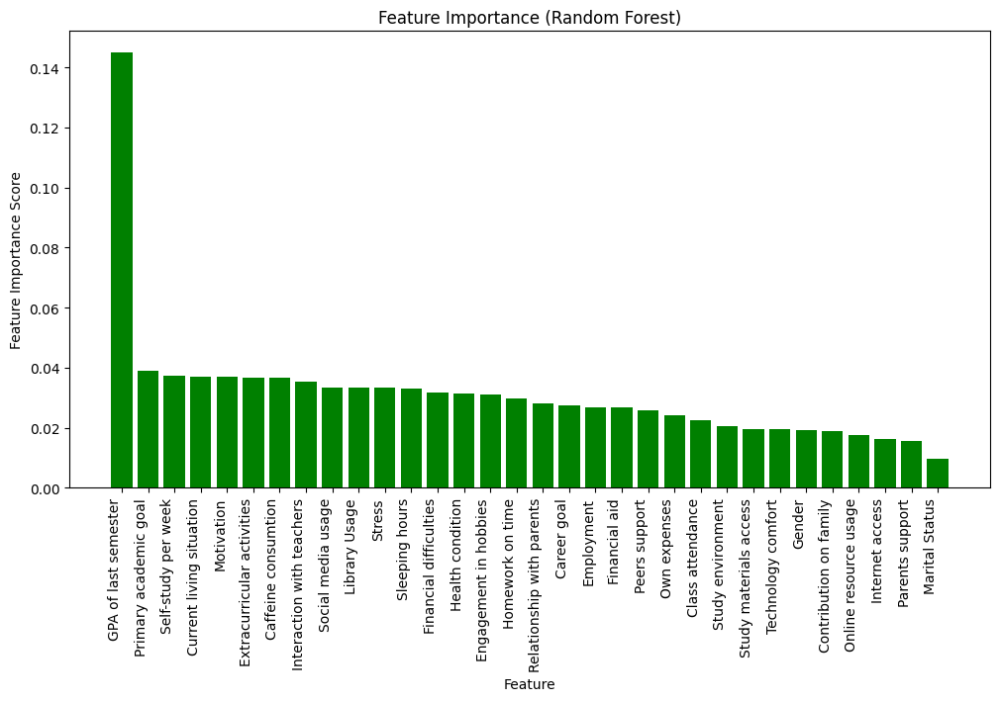

In [37]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# Train a Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importance scores
feature_importances = rf.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_features = X.columns[sorted_indices]
sorted_scores = feature_importances[sorted_indices]

# Select top 10 features
top_n = 10  
top_features = sorted_features[:top_n]

# Print only top 10 features
print("Top 10 Features (Random Forest):")
for top_features in sorted_features[:10]:
    print(top_features)


# Plot all features
plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_scores, color='green')
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance (Random Forest)")
plt.xticks(rotation=90, ha="right")
plt.show()

# Extract the Selected Features

In [38]:
# Ensure selected features are correctly taken from Random Forest results
selected_features = sorted_features[:10]  # Take top 10 features

# Create X_rf_selected using only the selected features
X_rf_selected = X[selected_features]  # Keep only top 10 selected features
y_rf_selected = y  # Keep target variable as is

# Confirm shape
print(f"Shape of X_rf_selected: {X_rf_selected.shape}")
print(f"Shape of y_rf_selected: {y_rf_selected.shape}")

Shape of X_rf_selected: (610, 10)
Shape of y_rf_selected: (610,)


# Apply SMOTE After Feature Selection

In [39]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Apply SMOTE
smote = SMOTE(sampling_strategy="auto", random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_rf_selected, y_rf_selected)

# Confirm balance
print("After Balancing:", Counter(y_resampled))

After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


In [40]:
# Ensure we use the same selected features after SMOTE
X_smote_selected = X_resampled[selected_features]  
y_smote_selected = y_resampled  

# Confirm shape
print(f"Shape of X_smote_selected: {X_smote_selected.shape}")
print(f"Shape of y_smote_selected: {y_smote_selected.shape}")

Shape of X_smote_selected: (925, 10)
Shape of y_smote_selected: (925,)


# 1.1 Logistic Regression


Logistic Regression Performance:
Average Accuracy: 0.4054
Training Time: 0.3540 sec
Testing Time: 0.3359 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.30      0.34      0.32       185
           1       0.43      0.51      0.46       185
           2       0.33      0.22      0.26       185
           3       0.40      0.28      0.33       185
           4       0.51      0.69      0.59       185

    accuracy                           0.41       925
   macro avg       0.39      0.41      0.39       925
weighted avg       0.39      0.41      0.39       925



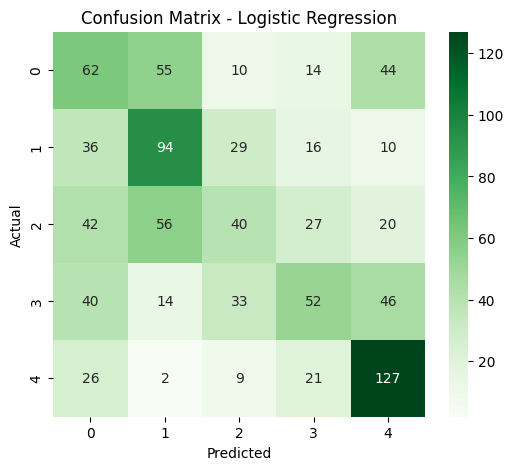

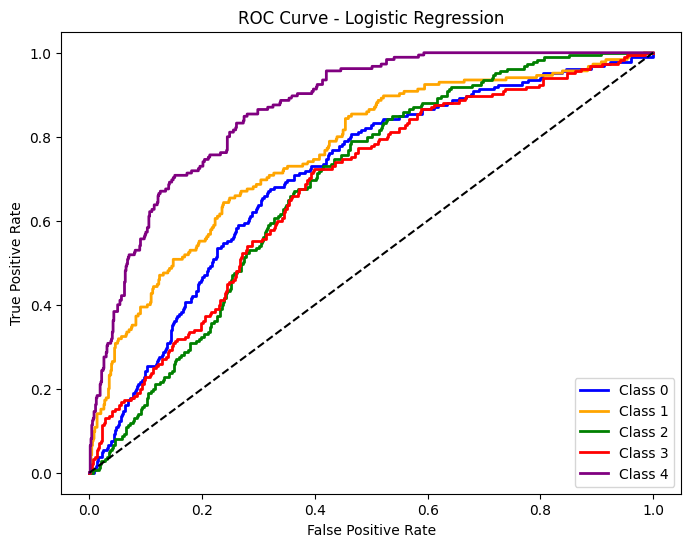

In [41]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_selected, y_smote_selected, cv=10)  # Predictions from 10-Fold CV
end_test = time.time()

# Compute performance metrics
print("\nLogistic Regression Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

lr_accuracy = cv_scores.mean()
lr_train_time = end_train - start_train
lr_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", 
            xticklabels=np.unique(y_smote_selected), 
            yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
colors = ['blue', 'orange', 'green', 'red', 'purple']

for i, label in enumerate(np.unique(y_smote_selected)):
    fpr, tpr, _ = roc_curve(y_smote_selected == label, y_prob[:, i])
    plt.plot(fpr, tpr, color=colors[i], lw=2, label=f'Class {label}')

# Random classifier line
plt.plot([0, 1], [0, 1], "k--", color="black")

# Labels and Title
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression")
plt.legend(loc="lower right")
plt.show()

# 1.2 Random Forest Classifier


Random Forest Performance:
Average Accuracy: 0.6650
Training Time: 2.3587 sec
Testing Time: 2.3629 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.90      0.85       185
           1       0.54      0.44      0.49       185
           2       0.54      0.49      0.51       185
           3       0.59      0.58      0.59       185
           4       0.77      0.92      0.84       185

    accuracy                           0.66       925
   macro avg       0.65      0.66      0.65       925
weighted avg       0.65      0.66      0.65       925



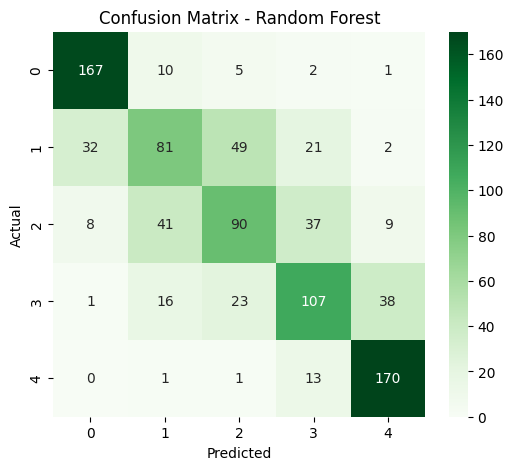

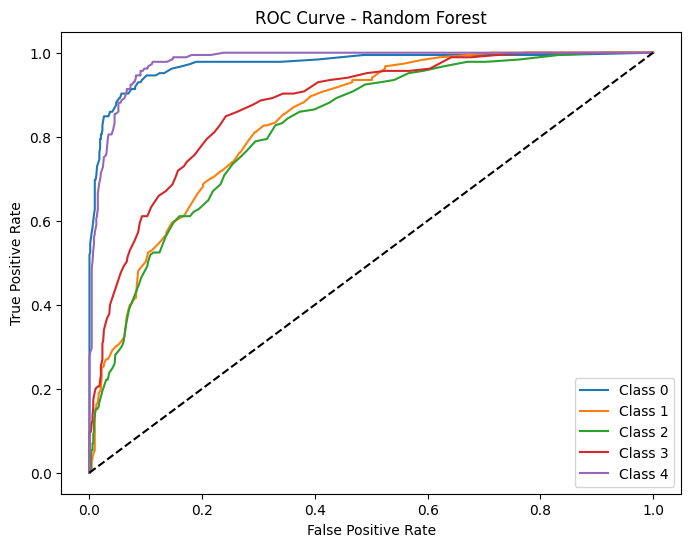

In [42]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nRandom Forest Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

rf_accuracy = cv_scores.mean()
rf_train_time = end_train - start_train
rf_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(rf_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 1.3 Gradient Boosting Classifier


Gradient Boosting Performance:
Average Accuracy: 0.6162
Training Time: 8.8495 sec
Testing Time: 8.8530 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.80      0.79       185
           1       0.53      0.44      0.48       185
           2       0.48      0.49      0.49       185
           3       0.51      0.51      0.51       185
           4       0.75      0.84      0.79       185

    accuracy                           0.62       925
   macro avg       0.61      0.62      0.61       925
weighted avg       0.61      0.62      0.61       925



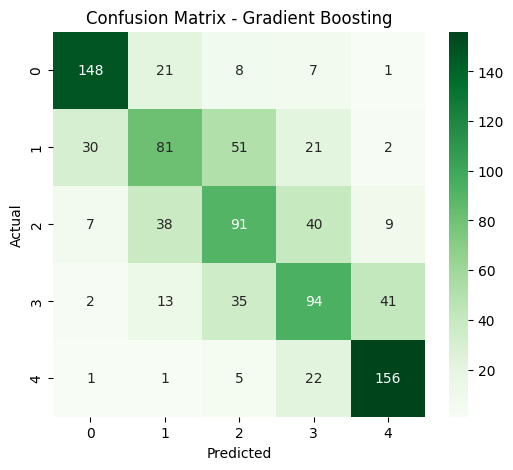

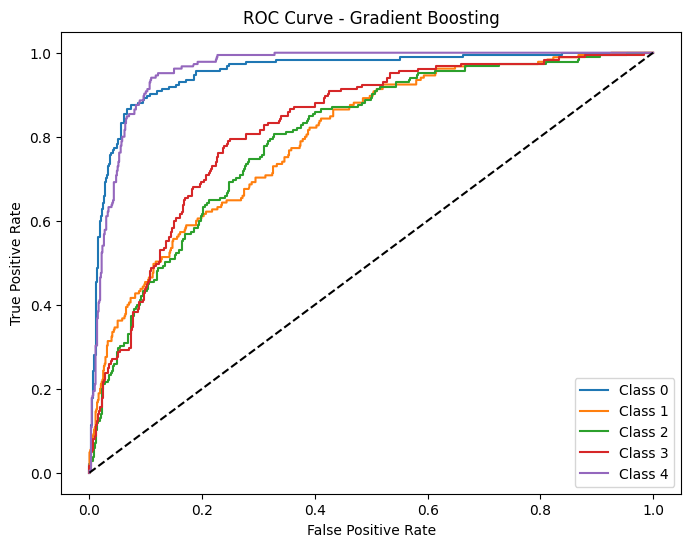

In [43]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Gradient Boosting Classifier
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(gb_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(gb_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nGradient Boosting Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

gb_accuracy = cv_scores.mean()
gb_train_time = end_train - start_train
gb_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(gb_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()


# 1.4 XGBoost Classifier


XGBoost Performance:
Average Accuracy: 0.6379
Training Time: 2.2944 sec
Testing Time: 2.2914 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.88      0.84       185
           1       0.50      0.39      0.44       185
           2       0.49      0.50      0.49       185
           3       0.57      0.56      0.56       185
           4       0.77      0.86      0.81       185

    accuracy                           0.64       925
   macro avg       0.63      0.64      0.63       925
weighted avg       0.63      0.64      0.63       925



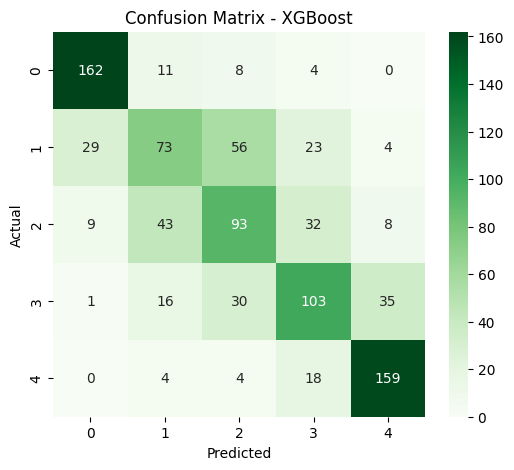

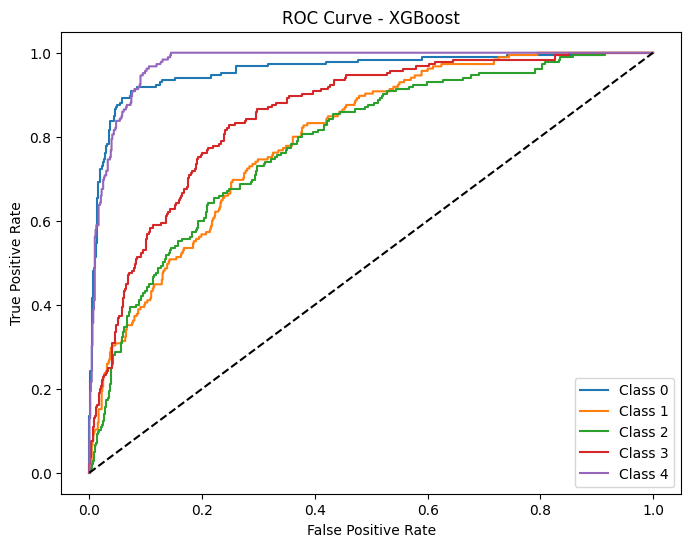

In [44]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize XGBoost Classifier
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(xgb_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(xgb_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nXGBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print Classification Report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

xgb_accuracy = cv_scores.mean()
xgb_train_time = end_train - start_train
xgb_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(xgb_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.show()


# 1.5 Support Vector Machine (SVM)


SVM Performance:
Average Accuracy: 0.6078
Training Time: 2.2323 sec
Testing Time: 2.1893 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.82      0.79       185
           1       0.48      0.43      0.45       185
           2       0.47      0.44      0.45       185
           3       0.54      0.49      0.51       185
           4       0.73      0.85      0.79       185

    accuracy                           0.61       925
   macro avg       0.60      0.61      0.60       925
weighted avg       0.60      0.61      0.60       925



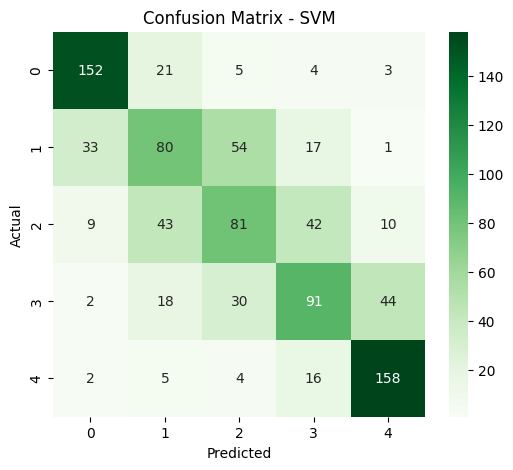

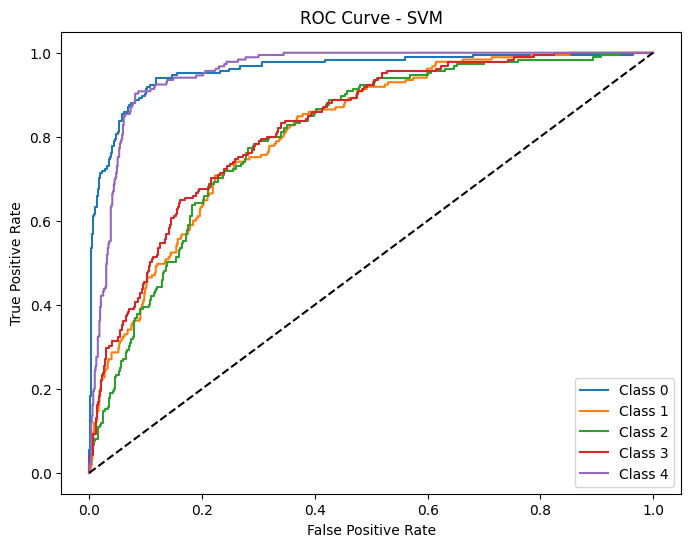

In [45]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize SVM Classifier
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(svm_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(svm_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nSVM Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

svm_accuracy = cv_scores.mean()
svm_train_time = end_train - start_train
svm_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(svm_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()


# 1.6 K-Nearest Neighbors (KNN)


KNN Performance:
Average Accuracy: 0.5623
Training Time: 0.1333 sec
Testing Time: 0.1235 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.91      0.75       185
           1       0.41      0.36      0.39       185
           2       0.37      0.34      0.35       185
           3       0.56      0.38      0.45       185
           4       0.75      0.82      0.78       185

    accuracy                           0.56       925
   macro avg       0.54      0.56      0.54       925
weighted avg       0.54      0.56      0.54       925



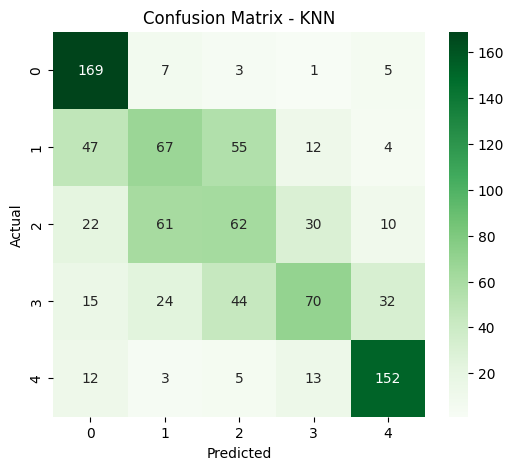

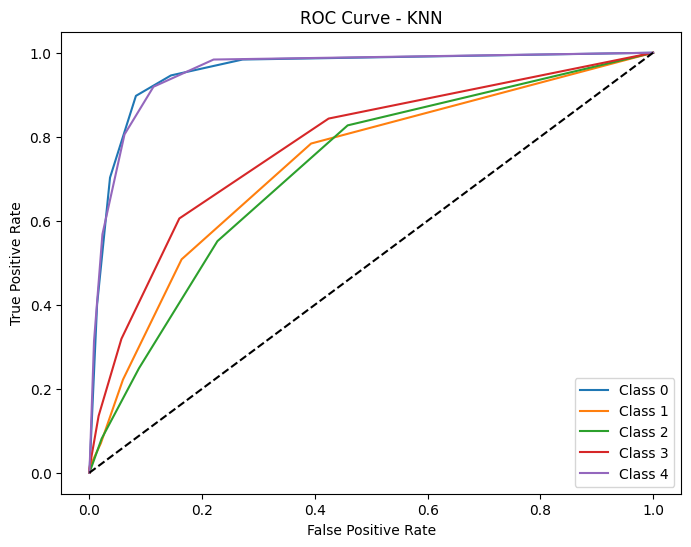

In [46]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize KNN Classifier
knn_clf = KNeighborsClassifier(n_neighbors=5)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(knn_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(knn_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nKNN Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print Classification Report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

knn_accuracy = cv_scores.mean()
knn_train_time = end_train - start_train
knn_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(knn_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()


# 1.7 MLP Classifier (Neural Network)


MLP Classifier Performance:
Average Accuracy: 0.5883
Training Time: 20.6561 sec
Testing Time: 20.9134 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.85      0.80       185
           1       0.48      0.42      0.45       185
           2       0.44      0.45      0.45       185
           3       0.47      0.43      0.45       185
           4       0.73      0.79      0.76       185

    accuracy                           0.59       925
   macro avg       0.58      0.59      0.58       925
weighted avg       0.58      0.59      0.58       925



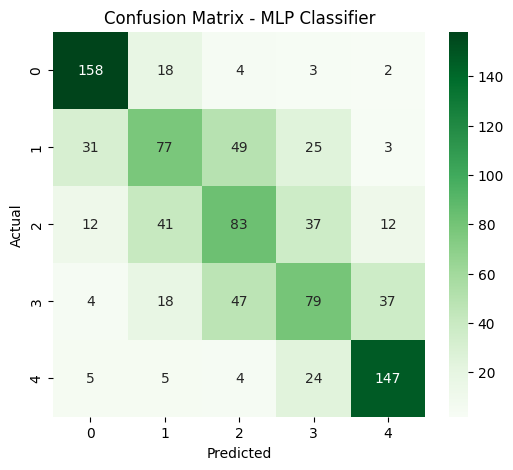

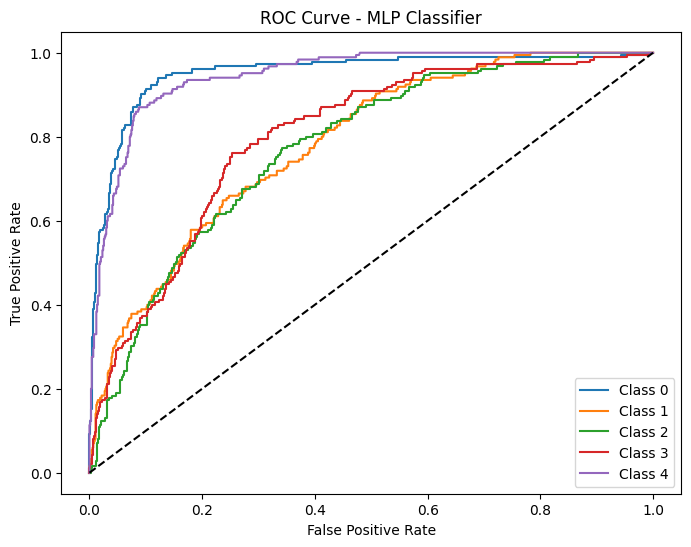

In [47]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize MLP Classifier
mlp_clf = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(mlp_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(mlp_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nMLP Classifier Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print Classification Report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

mlp_accuracy = cv_scores.mean()
mlp_train_time = end_train - start_train
mlp_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(mlp_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier")
plt.legend()
plt.show()


# 1.8 CatBoost Classifier


CatBoost Performance:
Average Accuracy: 0.6596
Training Time: 5.9950 sec
Testing Time: 6.1997 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       185
           1       0.53      0.44      0.48       185
           2       0.50      0.51      0.50       185
           3       0.61      0.57      0.59       185
           4       0.79      0.92      0.85       185

    accuracy                           0.66       925
   macro avg       0.65      0.66      0.65       925
weighted avg       0.65      0.66      0.65       925



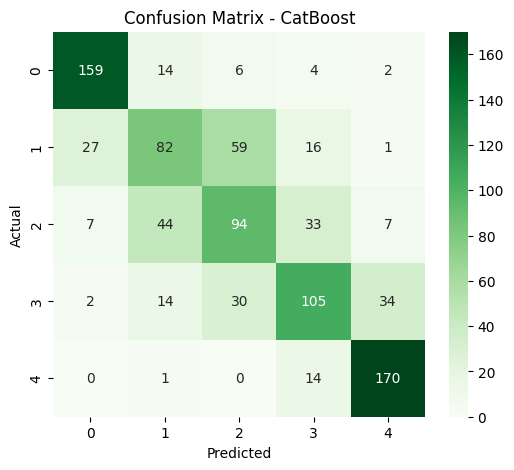

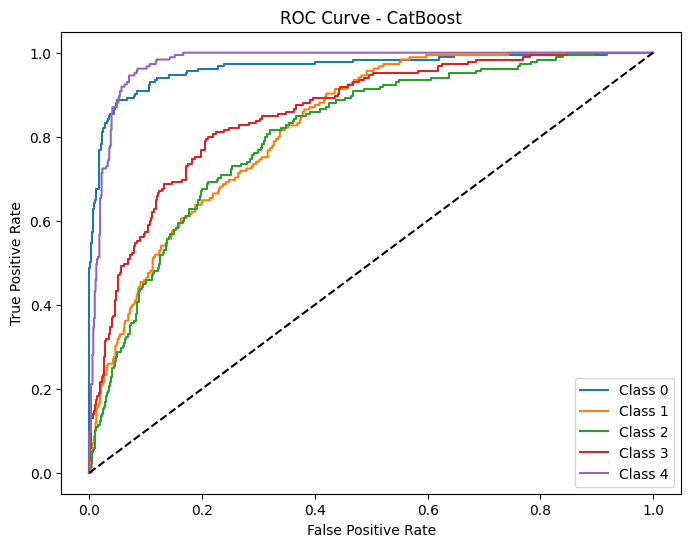

In [48]:
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize CatBoost Classifier
catboost_clf = CatBoostClassifier(iterations=500, depth=6, learning_rate=0.1, verbose=0, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(catboost_clf, X_smote_selected, y_smote_selected, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(catboost_clf, X_smote_selected, y_smote_selected, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nCatBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print Classification Report
print("\nClassification Report:")
print(classification_report(y_smote_selected, y_pred))

catboost_accuracy = cv_scores.mean()
catboost_train_time = end_train - start_train
catboost_test_time = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_selected, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_selected), yticklabels=np.unique(y_smote_selected))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(catboost_clf, X_smote_selected, y_smote_selected, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_selected))):
    fpr, tpr, _ = roc_curve(y_smote_selected == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost")
plt.legend()
plt.show()


# Comparison for Random Forest Feature Selection

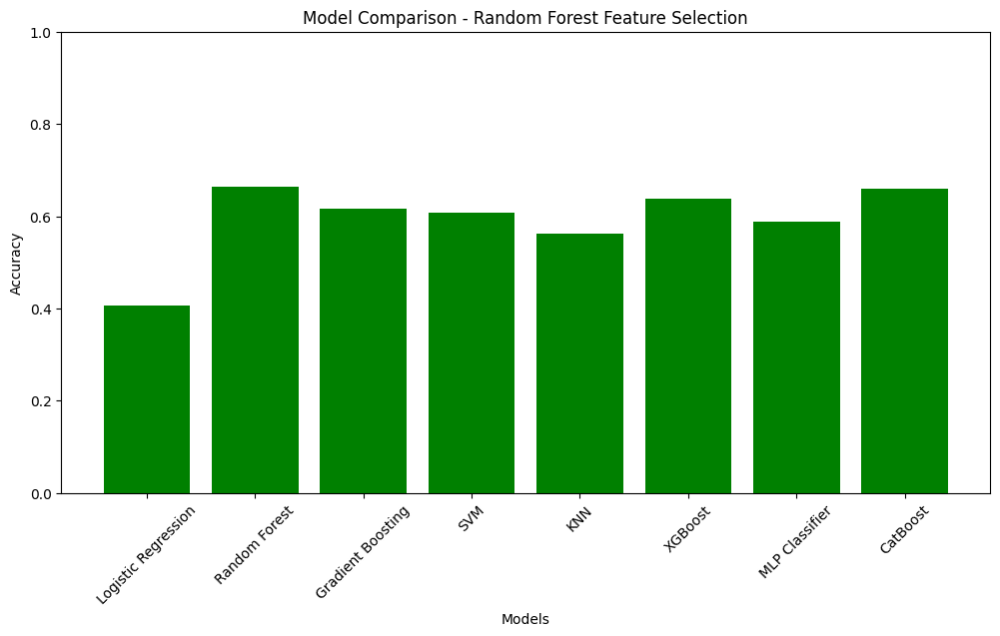

                 Model  Accuracy  Training Time (s)  Testing Time (s)
0  Logistic Regression  0.405400           0.354049          0.335860
1        Random Forest  0.664972           2.358656          2.362909
2    Gradient Boosting  0.616223           8.849539          8.853039
3                  SVM  0.607772           2.232257          2.189341
4                  KNN  0.562307           0.133339          0.123488
5              XGBoost  0.637950           2.294382          2.291398
6       MLP Classifier  0.588301          20.656095         20.913446
7             CatBoost  0.659619           5.995018          6.199747


In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Store results for Random Forest Feature Selection
rf_results = {
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM", "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy, rf_accuracy, gb_accuracy, svm_accuracy, knn_accuracy, xgb_accuracy, mlp_accuracy, catboost_accuracy],
    "Training Time (s)": [lr_train_time, rf_train_time, gb_train_time, svm_train_time, knn_train_time, xgb_train_time, mlp_train_time, catboost_train_time],
    "Testing Time (s)": [lr_test_time, rf_test_time, gb_test_time, svm_test_time, knn_test_time, xgb_test_time, mlp_test_time, catboost_test_time]
}

df_rf = pd.DataFrame(rf_results)

# Plot Accuracy Comparison
plt.figure(figsize=(12, 6))
plt.bar(df_rf["Model"], df_rf["Accuracy"], color="green")
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Model Comparison - Random Forest Feature Selection")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

# Display table
print(df_rf)


# 2. Chi-Square Test

Top 10 Features (Chi-Square Test):
GPA of last semester
Financial aid
Motivation
Parents support
Primary academic goal
Homework on time
Gender
Contribution on family
Class attendance
Relationship with parents


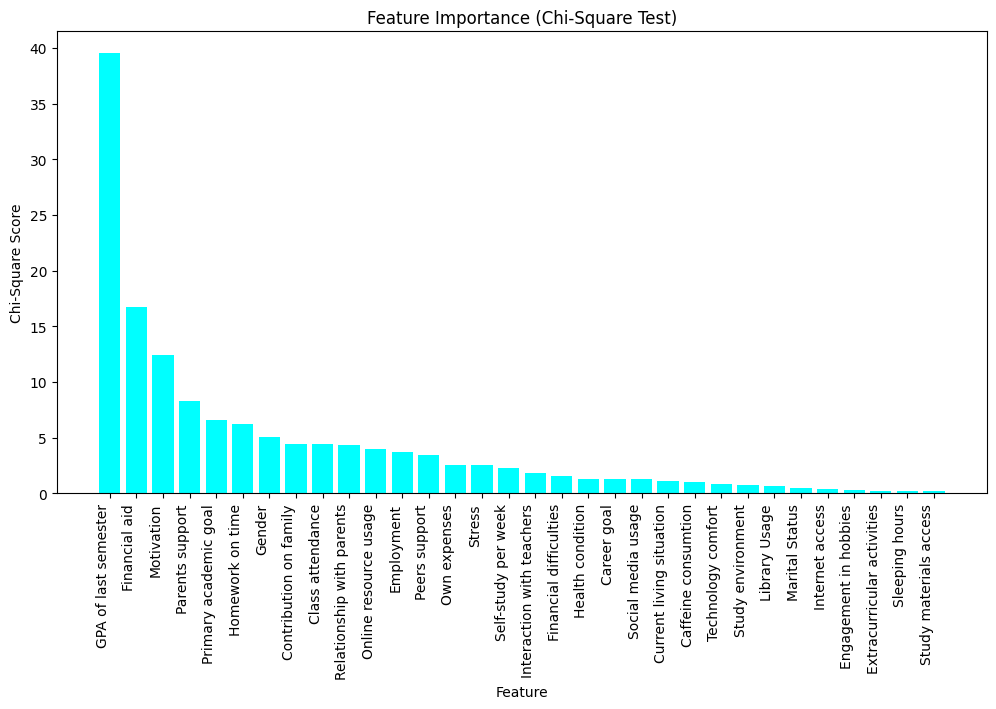

In [50]:
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

# Normalize features for chi-square test
X_chi2 = MinMaxScaler().fit_transform(X)

# Compute chi-square scores
chi2_scores, _ = chi2(X_chi2, y)

# Sort features by score
sorted_indices = np.argsort(chi2_scores)[::-1]
sorted_features = X.columns[sorted_indices]
sorted_scores = chi2_scores[sorted_indices]

# Print only top 10 features
print("Top 10 Features (Chi-Square Test):")
for feature in sorted_features[:10]:
    print(feature)

# Plot all features
plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_scores, color='cyan')
plt.ylabel("Chi-Square Score")
plt.xlabel("Feature")
plt.title("Feature Importance (Chi-Square Test)")
plt.xticks(rotation=90, ha="right")
plt.show()

# applying SMOTE after feature selection

In [51]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Select top 10 features from Chi-Square Test
top_n = 10
selected_features_chi2 = sorted_features[:top_n]

# Create new dataset with selected features
X_chi2_selected = X[selected_features_chi2]  # Use only top selected features
y_chi2_selected = y  # Target remains unchanged

# Apply SMOTE after feature selection
smote = SMOTE(sampling_strategy="auto", random_state=42)
X_smote_chi2, y_smote_chi2 = smote.fit_resample(X_chi2_selected, y_chi2_selected)

# Confirm shape after SMOTE
print(f"Shape of X_smote_chi2: {X_smote_chi2.shape}")
print(f"Shape of y_smote_chi2: {y_smote_chi2.shape}")
print("After Balancing:", Counter(y_smote_chi2))

Shape of X_smote_chi2: (925, 10)
Shape of y_smote_chi2: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 2.1 Logistic Regression


Logistic Regression Performance:
Average Accuracy: 0.4336
Training Time: 0.4780 sec
Testing Time: 0.4708 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.43      0.42       185
           1       0.41      0.46      0.43       185
           2       0.38      0.29      0.33       185
           3       0.33      0.29      0.31       185
           4       0.57      0.70      0.63       185

    accuracy                           0.43       925
   macro avg       0.42      0.43      0.42       925
weighted avg       0.42      0.43      0.42       925



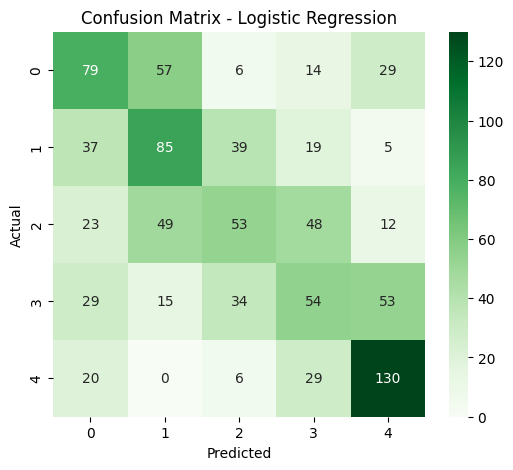

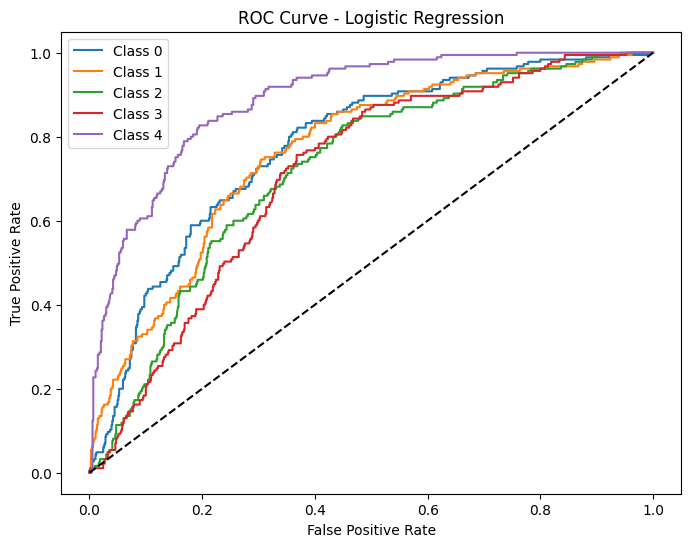

In [52]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_chi2, y_smote_chi2, cv=10)  # Predictions from 10-Fold CV
end_test = time.time()

# Compute performance metrics
print("\nLogistic Regression Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

lr_accuracy_chi2 = cv_scores.mean()
lr_train_time_chi2 = end_train - start_train
lr_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression")
plt.legend()
plt.show()

# 2.2 Random Forest Classifier


Random Forest Performance:
Average Accuracy: 0.6142
Training Time: 2.2553 sec
Testing Time: 2.2644 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.85      0.83       185
           1       0.51      0.44      0.48       185
           2       0.48      0.47      0.47       185
           3       0.50      0.50      0.50       185
           4       0.73      0.81      0.77       185

    accuracy                           0.61       925
   macro avg       0.61      0.61      0.61       925
weighted avg       0.61      0.61      0.61       925



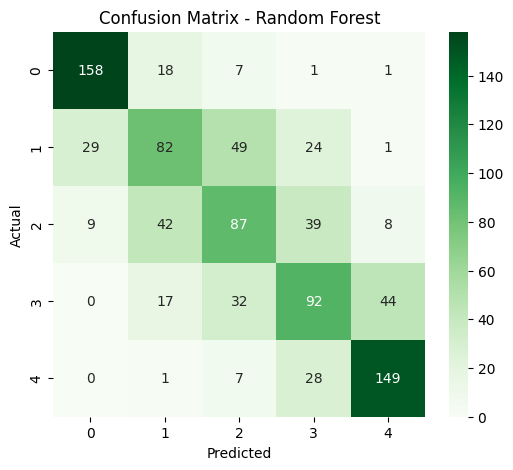

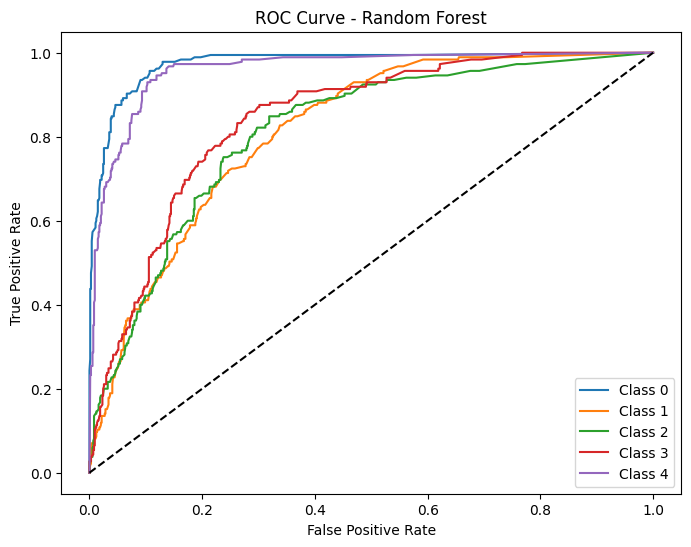

In [53]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nRandom Forest Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

rf_accuracy_chi2 = cv_scores.mean()
rf_train_time_chi2 = end_train - start_train
rf_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(rf, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 2.3 Gradient Boosting


Gradient Boosting Performance:
Average Accuracy: 0.6240
Training Time: 8.2012 sec
Testing Time: 8.1317 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.82      0.80       185
           1       0.51      0.40      0.45       185
           2       0.50      0.55      0.52       185
           3       0.54      0.54      0.54       185
           4       0.75      0.82      0.78       185

    accuracy                           0.62       925
   macro avg       0.62      0.62      0.62       925
weighted avg       0.62      0.62      0.62       925



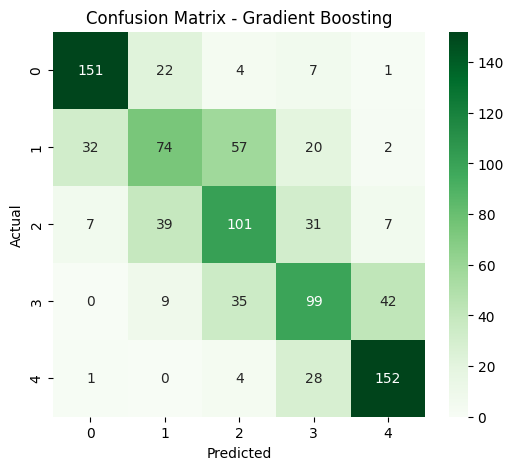

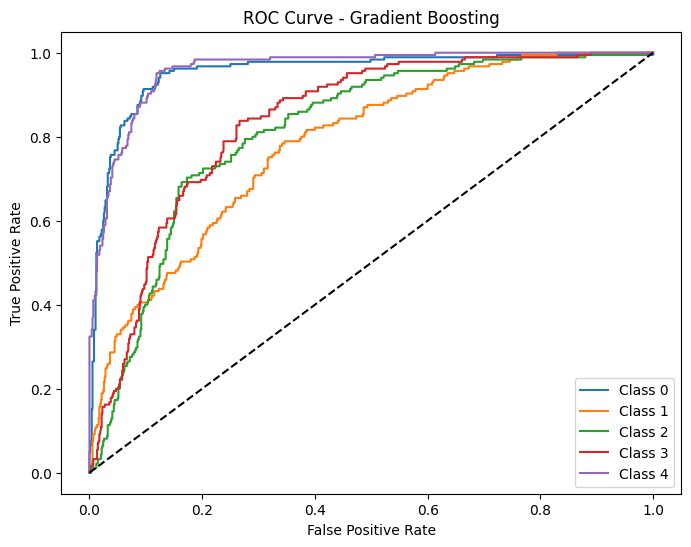

In [54]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nGradient Boosting Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

gb_accuracy_chi2 = cv_scores.mean()
gb_train_time_chi2 = end_train - start_train
gb_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(gb, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()


# 2.4 SVM


SVM Performance:
Average Accuracy: 0.5168
Training Time: 1.9544 sec
Testing Time: 1.9451 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.67      0.56       185
           1       0.46      0.42      0.44       185
           2       0.48      0.34      0.40       185
           3       0.48      0.42      0.45       185
           4       0.65      0.74      0.69       185

    accuracy                           0.52       925
   macro avg       0.51      0.52      0.51       925
weighted avg       0.51      0.52      0.51       925



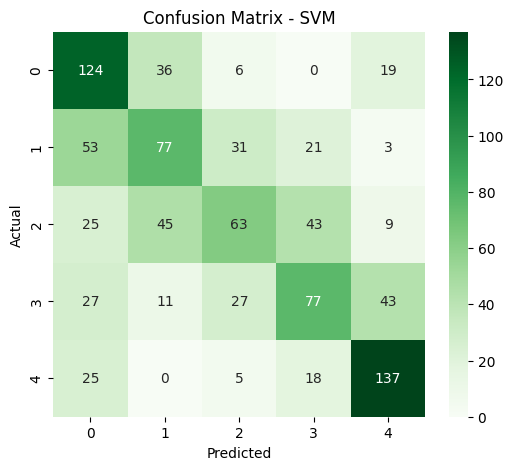

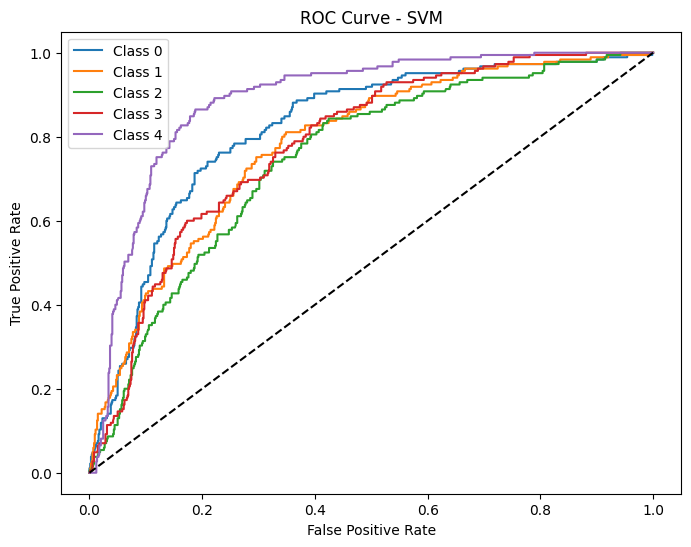

In [55]:
from sklearn.svm import SVC

# Initialize SVM
svm = SVC(kernel="linear", probability=True, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(svm, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(svm, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nSVM Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

svm_accuracy_chi2 = cv_scores.mean()
svm_train_time_chi2 = end_train - start_train
svm_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(svm, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()

# 2.5 KNN


KNN Performance:
Average Accuracy: 0.5784
Training Time: 0.1293 sec
Testing Time: 0.1210 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.91      0.80       185
           1       0.44      0.41      0.42       185
           2       0.43      0.43      0.43       185
           3       0.51      0.40      0.45       185
           4       0.74      0.74      0.74       185

    accuracy                           0.58       925
   macro avg       0.57      0.58      0.57       925
weighted avg       0.57      0.58      0.57       925



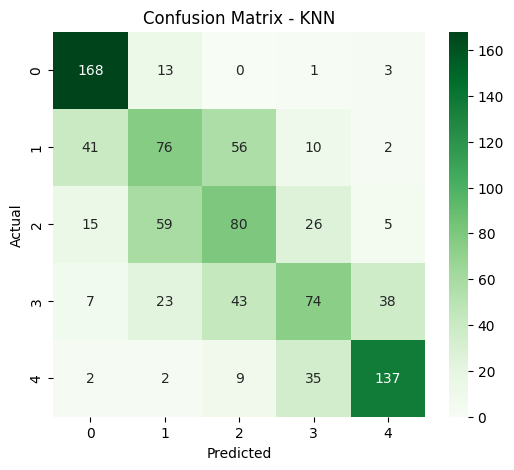

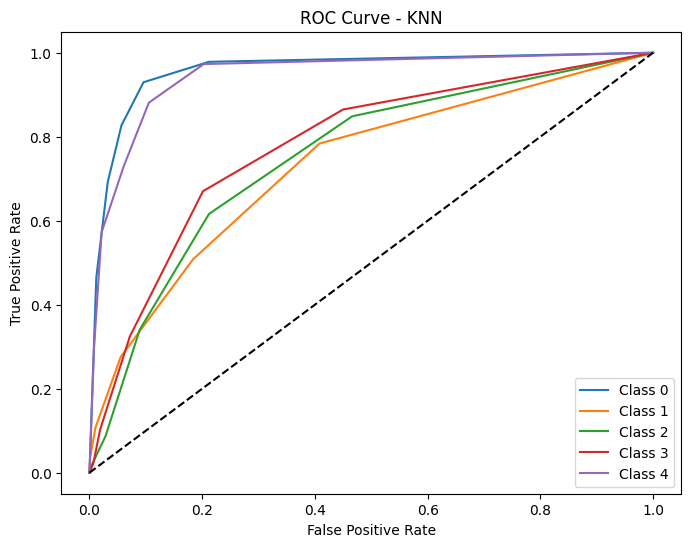

In [56]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize KNN
knn = KNeighborsClassifier(n_neighbors=5)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nKNN Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

knn_accuracy_chi2 = cv_scores.mean()
knn_train_time_chi2 = end_train - start_train
knn_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(knn, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()


# 2.6 XGBoost


XGBoost Performance:
Average Accuracy: 0.6283
Training Time: 2.4329 sec
Testing Time: 4.5074 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.86      0.83       185
           1       0.52      0.43      0.47       185
           2       0.50      0.52      0.51       185
           3       0.54      0.52      0.53       185
           4       0.75      0.81      0.78       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.62       925
weighted avg       0.62      0.63      0.62       925



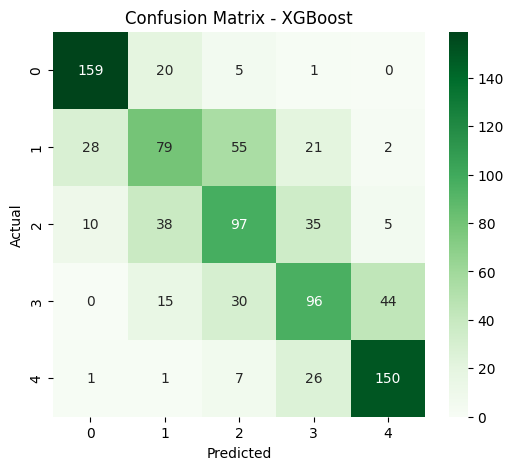

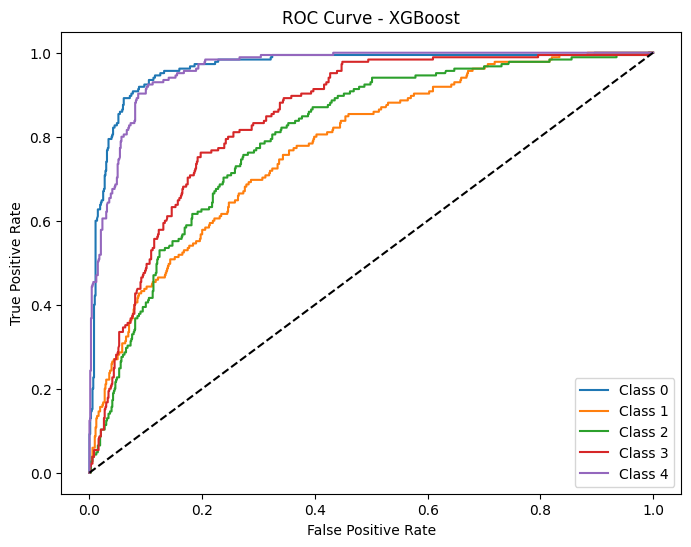

In [57]:
from xgboost import XGBClassifier

# Initialize XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(xgb, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(xgb, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nXGBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

xgb_accuracy_chi2 = cv_scores.mean()
xgb_train_time_chi2 = end_train - start_train
xgb_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(xgb, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.show()


# 2.7 MLP


MLP Performance:
Average Accuracy: 0.6066
Training Time: 20.5936 sec
Testing Time: 21.1685 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       185
           1       0.53      0.44      0.48       185
           2       0.50      0.55      0.52       185
           3       0.51      0.46      0.49       185
           4       0.70      0.79      0.74       185

    accuracy                           0.61       925
   macro avg       0.60      0.61      0.60       925
weighted avg       0.60      0.61      0.60       925



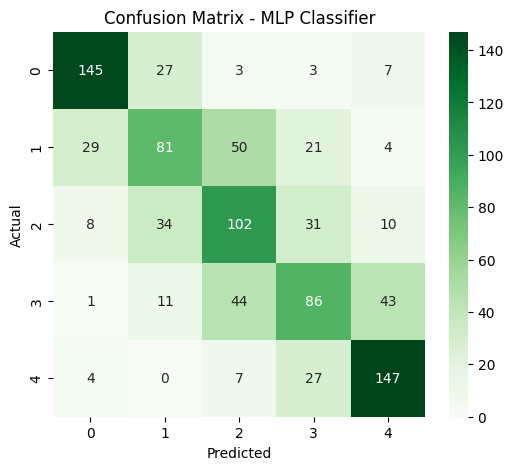

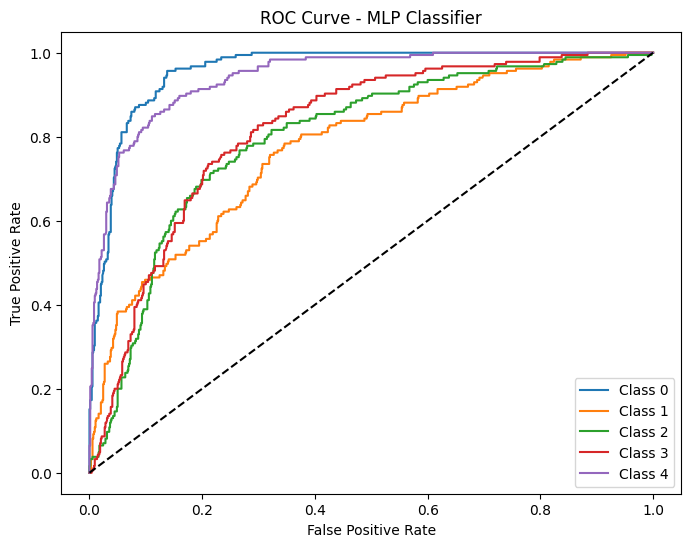

In [58]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP Classifier
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(mlp, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(mlp, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nMLP Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

mlp_accuracy_chi2 = cv_scores.mean()
mlp_train_time_chi2 = end_train - start_train
mlp_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(mlp, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier")
plt.legend()
plt.show()


# 2.8 CatBoost


CatBoost Performance:
Average Accuracy: 0.6089
Training Time: 11.7365 sec
Testing Time: 11.6970 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.83      0.81       185
           1       0.47      0.43      0.45       185
           2       0.47      0.47      0.47       185
           3       0.54      0.54      0.54       185
           4       0.74      0.78      0.76       185

    accuracy                           0.61       925
   macro avg       0.60      0.61      0.61       925
weighted avg       0.60      0.61      0.61       925



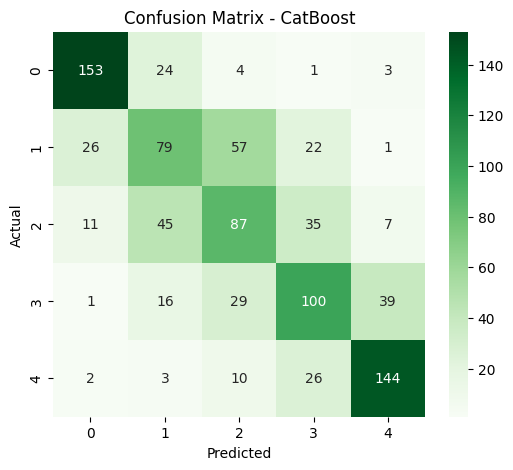

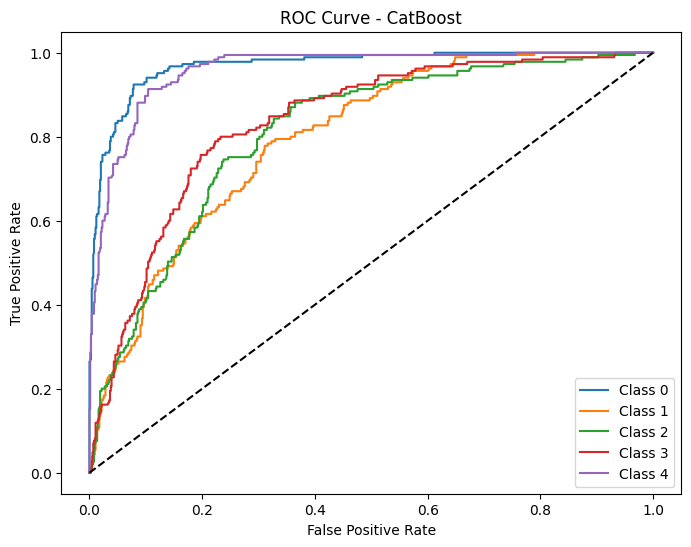

In [59]:
from catboost import CatBoostClassifier

# Initialize CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(catboost, X_smote_chi2, y_smote_chi2, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(catboost, X_smote_chi2, y_smote_chi2, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nCatBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_chi2, y_pred))

catboost_accuracy_chi2 = cv_scores.mean()
catboost_train_time_chi2 = end_train - start_train
catboost_test_time_chi2 = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_chi2, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_chi2), yticklabels=np.unique(y_smote_chi2))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(catboost, X_smote_chi2, y_smote_chi2, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_chi2))):
    fpr, tpr, _ = roc_curve(y_smote_chi2 == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost")
plt.legend()
plt.show()

# Comparison for Chi-Square Feature Selection

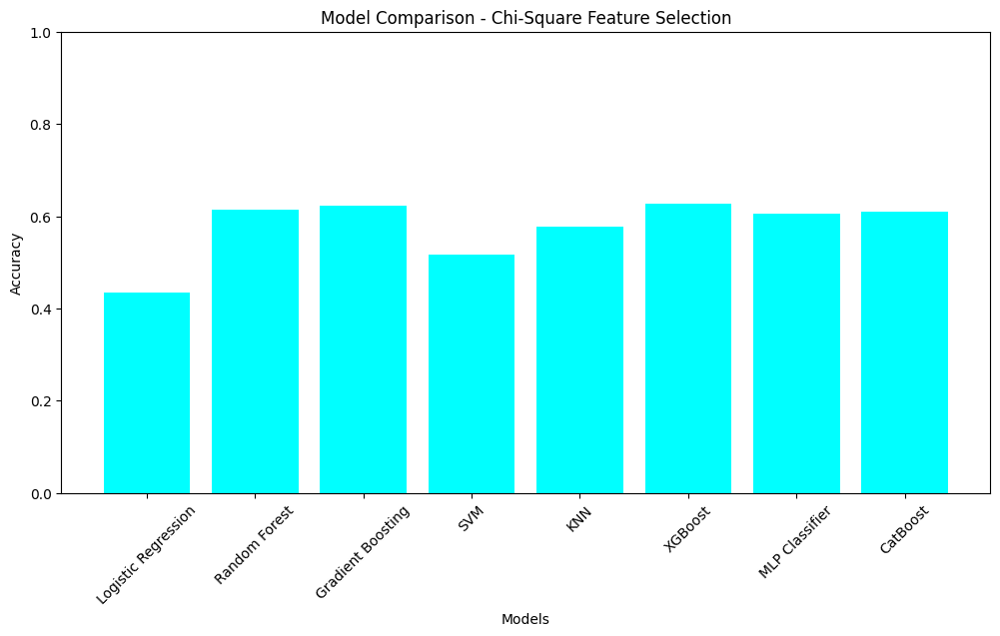

                 Model  Accuracy  Training Time (s)  Testing Time (s)
0  Logistic Regression  0.433637           0.477975          0.470804
1        Random Forest  0.614212           2.255346          2.264402
2    Gradient Boosting  0.623960           8.201211          8.131669
3                  SVM  0.516795           1.954445          1.945063
4                  KNN  0.578448           0.129348          0.121038
5              XGBoost  0.628296           2.432909          4.507381
6       MLP Classifier  0.606639          20.593563         21.168474
7             CatBoost  0.608894          11.736495         11.697040


In [60]:
# Store results for Chi-Square Feature Selection
chi2_results = {
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM", "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy_chi2, rf_accuracy_chi2, gb_accuracy_chi2, svm_accuracy_chi2, knn_accuracy_chi2, xgb_accuracy_chi2, mlp_accuracy_chi2, catboost_accuracy_chi2],
    "Training Time (s)": [lr_train_time_chi2, rf_train_time_chi2, gb_train_time_chi2, svm_train_time_chi2, knn_train_time_chi2, xgb_train_time_chi2, mlp_train_time_chi2, catboost_train_time_chi2],
    "Testing Time (s)": [lr_test_time_chi2, rf_test_time_chi2, gb_test_time_chi2, svm_test_time_chi2, knn_test_time_chi2, xgb_test_time_chi2, mlp_test_time_chi2, catboost_test_time_chi2]
}

df_chi2 = pd.DataFrame(chi2_results)

# Plot Accuracy Comparison
plt.figure(figsize=(12, 6))
plt.bar(df_chi2["Model"], df_chi2["Accuracy"], color="cyan")
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Model Comparison - Chi-Square Feature Selection")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

# Display table
print(df_chi2)

# 3. Gradient boosting

Top 10 Features (Gradient Boosting):
GPA of last semester
Library Usage
Interaction with teachers
Motivation
Social media usage
Self-study per week
Current living situation
Employment
Financial aid
Primary academic goal


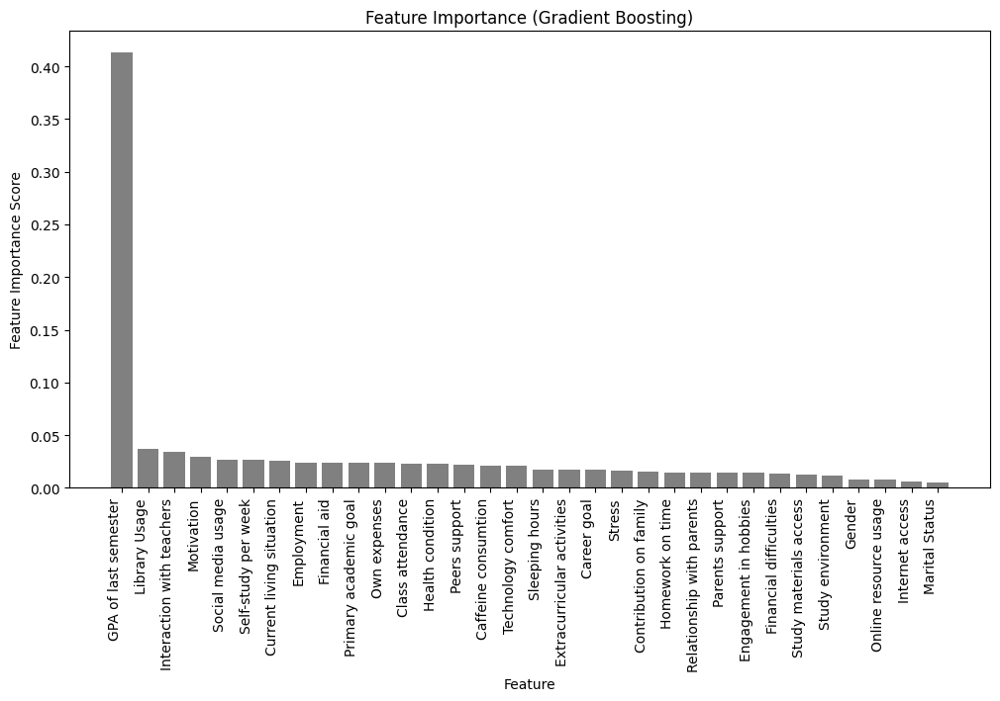

In [61]:
from sklearn.ensemble import GradientBoostingClassifier

# Train Gradient Boosting model
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb.fit(X, y)

# Get feature importance scores
gb_importances = gb.feature_importances_

# Sort features by importance
sorted_indices = np.argsort(gb_importances)[::-1]
sorted_features = X.columns[sorted_indices]
sorted_scores = gb_importances[sorted_indices]

# Print only top 10 features
print("Top 10 Features (Gradient Boosting):")
for feature in sorted_features[:10]:
    print(feature)

# Plot all features
plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_scores, color='grey')
plt.ylabel("Feature Importance Score")
plt.xlabel("Feature")
plt.title("Feature Importance (Gradient Boosting)")
plt.xticks(rotation=90, ha="right")
plt.show()


# Apply SMOTE After Feature Selection

In [62]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Select top 10 features from Gradient Boosting
selected_features = sorted_features[:10]

# Create new dataset with only selected features
X_gb_selected = X[selected_features]  
y_gb_selected = y  # Target variable remains the same

# Apply SMOTE
smote = SMOTE(sampling_strategy="auto", random_state=42)
X_smote_gb, y_smote_gb = smote.fit_resample(X_gb_selected, y_gb_selected)

# Confirm shape and class balance
print(f"Shape of X_smote_gb: {X_smote_gb.shape}")
print(f"Shape of y_smote_gb: {y_smote_gb.shape}")
print("After Balancing:", Counter(y_smote_gb))

Shape of X_smote_gb: (925, 10)
Shape of y_smote_gb: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 3.1 Logistic Regression


Logistic Regression Performance:
Average Accuracy: 0.4465
Training Time: 0.3527 sec
Testing Time: 0.3399 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.49      0.44       185
           1       0.45      0.48      0.46       185
           2       0.37      0.26      0.31       185
           3       0.40      0.29      0.34       185
           4       0.56      0.71      0.63       185

    accuracy                           0.45       925
   macro avg       0.44      0.45      0.43       925
weighted avg       0.44      0.45      0.43       925



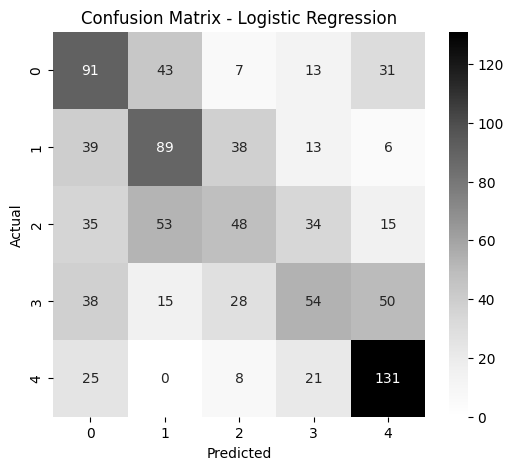

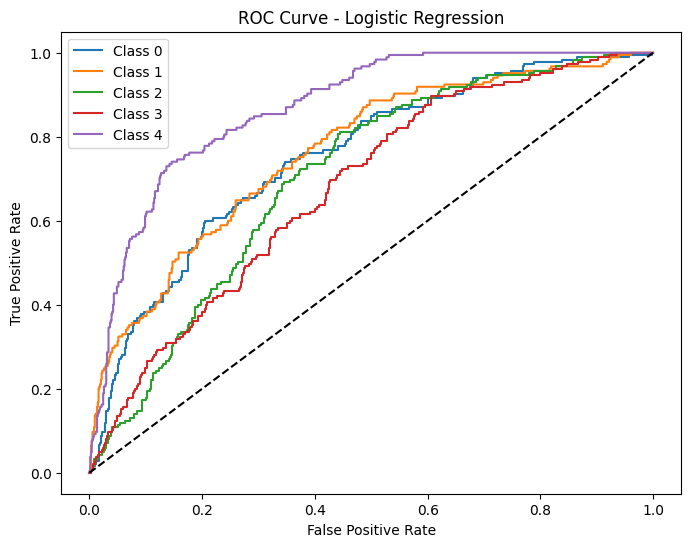

In [63]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_gb, y_smote_gb, cv=10)  # Predictions from 10-Fold CV
end_test = time.time()

# Compute performance metrics
lr_accuracy = cv_scores.mean()
lr_train_time = end_train - start_train
lr_test_time = end_test - start_test

print("\nLogistic Regression Performance:")
print(f"Average Accuracy: {lr_accuracy:.4f}")
print(f"Training Time: {lr_train_time:.4f} sec")
print(f"Testing Time: {lr_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

lr_accuracy_gb = cv_scores.mean()
lr_train_time_gb = end_train - start_train
lr_test_time_gb = end_test - start_test


# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression")
plt.legend()
plt.show()

# 3.2 Random Forest


Random Forest Performance:
Average Accuracy: 0.6866
Training Time: 2.3247 sec
Testing Time: 2.3465 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       185
           1       0.58      0.50      0.54       185
           2       0.56      0.56      0.56       185
           3       0.63      0.56      0.59       185
           4       0.78      0.93      0.85       185

    accuracy                           0.69       925
   macro avg       0.68      0.69      0.68       925
weighted avg       0.68      0.69      0.68       925



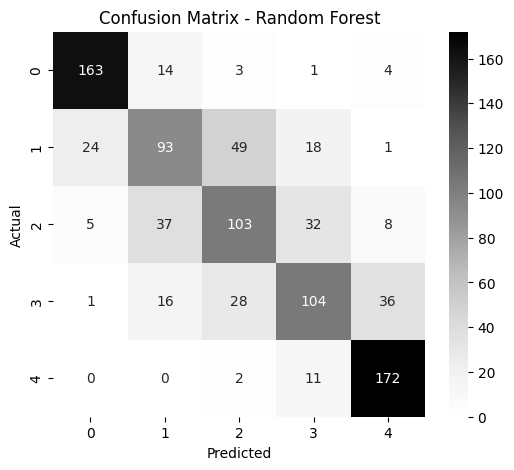

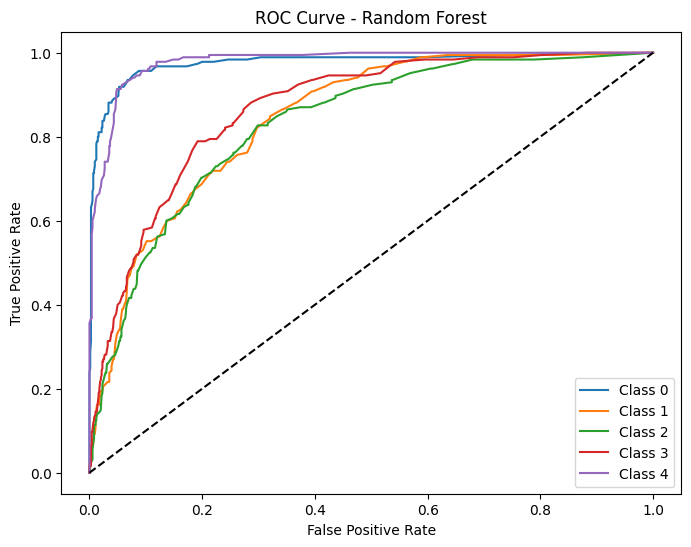

In [64]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
rf_accuracy = cv_scores.mean()
rf_train_time = end_train - start_train
rf_test_time = end_test - start_test

print("\nRandom Forest Performance:")
print(f"Average Accuracy: {rf_accuracy:.4f}")
print(f"Training Time: {rf_train_time:.4f} sec")
print(f"Testing Time: {rf_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

rf_accuracy_gb = cv_scores.mean()
rf_train_time_gb = end_train - start_train
rf_test_time_gb = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 3.3 Gradient Boosting


Gradient Boosting Performance:
Average Accuracy: 0.6325
Training Time: 8.7385 sec
Testing Time: 8.8078 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.85      0.83       185
           1       0.56      0.46      0.51       185
           2       0.48      0.48      0.48       185
           3       0.54      0.52      0.53       185
           4       0.73      0.84      0.78       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.63       925
weighted avg       0.62      0.63      0.63       925



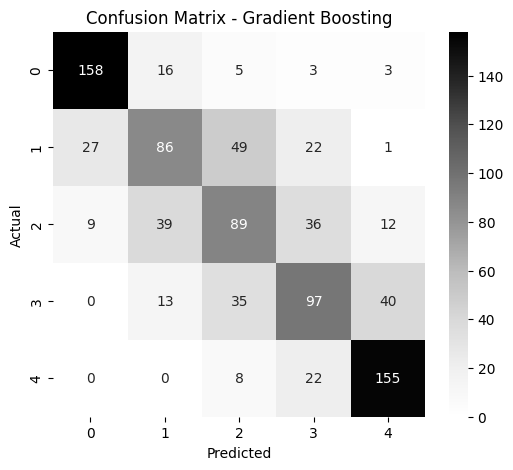

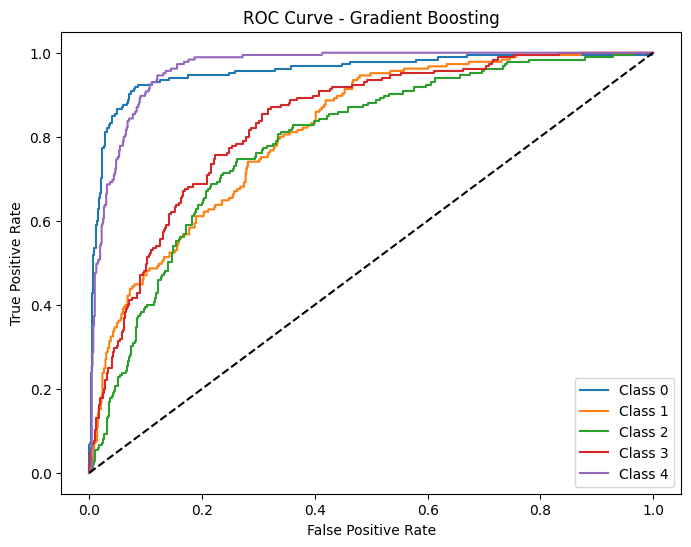

In [65]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
gb_accuracy = cv_scores.mean()
gb_train_time = end_train - start_train
gb_test_time = end_test - start_test

print("\nGradient Boosting Performance:")
print(f"Average Accuracy: {gb_accuracy:.4f}")
print(f"Training Time: {gb_train_time:.4f} sec")
print(f"Testing Time: {gb_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

gb_accuracy_gb = cv_scores.mean()
gb_train_time_gb = end_train - start_train
gb_test_time_gb = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

# ROC Curve
y_prob = cross_val_predict(gb, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()

# 3.4 SVM


SVM Performance:
Average Accuracy: 0.5978
Training Time: 2.1160 sec
Testing Time: 2.1116 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.78      0.79       185
           1       0.49      0.47      0.48       185
           2       0.44      0.47      0.46       185
           3       0.54      0.46      0.50       185
           4       0.70      0.81      0.75       185

    accuracy                           0.60       925
   macro avg       0.60      0.60      0.59       925
weighted avg       0.60      0.60      0.59       925



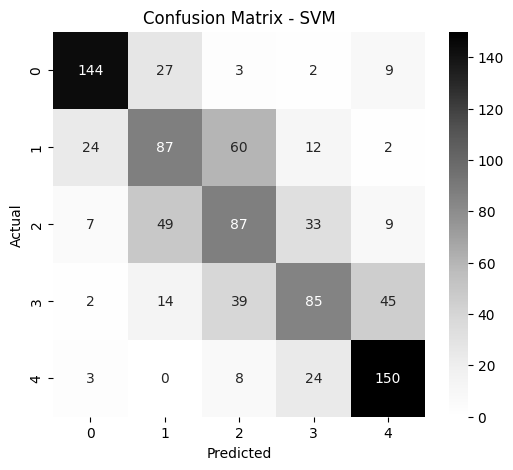

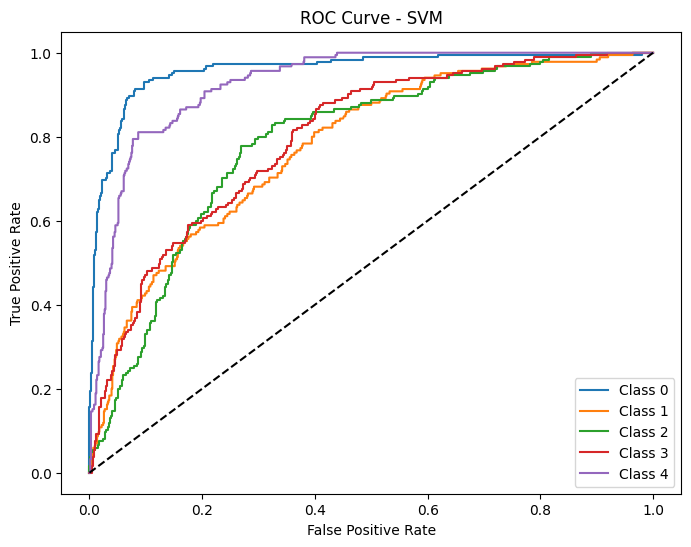

In [66]:
from sklearn.svm import SVC

# Initialize SVM
svm = SVC(probability=True, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(svm, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(svm, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
svm_accuracy = cv_scores.mean()
svm_train_time = end_train - start_train
svm_test_time = end_test - start_test

print("\nSVM Performance:")
print(f"Average Accuracy: {svm_accuracy:.4f}")
print(f"Training Time: {svm_train_time:.4f} sec")
print(f"Testing Time: {svm_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

svm_accuracy_gb = cv_scores.mean()
svm_train_time_gb = end_train - start_train
svm_test_time_gb = end_test - start_test


# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

# ROC Curve
y_prob = cross_val_predict(svm, X_smote_gb, y_smote_gb, cv=10, method="decision_function")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()


# 3.5 KNN


KNN Performance:
Average Accuracy: 0.6012
Training Time: 0.1339 sec
Testing Time: 0.1234 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.92      0.78       185
           1       0.52      0.46      0.49       185
           2       0.47      0.42      0.44       185
           3       0.54      0.39      0.45       185
           4       0.71      0.81      0.76       185

    accuracy                           0.60       925
   macro avg       0.58      0.60      0.59       925
weighted avg       0.58      0.60      0.59       925



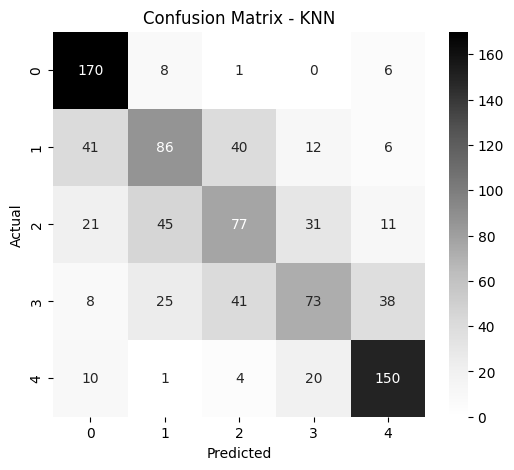

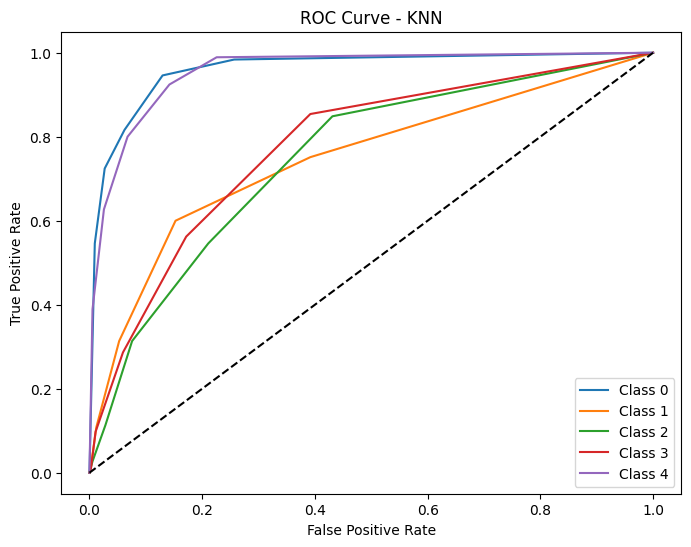

In [67]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize KNN
knn = KNeighborsClassifier(n_neighbors=5)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
knn_accuracy = cv_scores.mean()
knn_train_time = end_train - start_train
knn_test_time = end_test - start_test

print("\nKNN Performance:")
print(f"Average Accuracy: {knn_accuracy:.4f}")
print(f"Training Time: {knn_train_time:.4f} sec")
print(f"Testing Time: {knn_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

knn_accuracy_gb = cv_scores.mean()
knn_train_time_gb = end_train - start_train
knn_test_time_gb = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

# ROC Curve
y_prob = cross_val_predict(knn, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()

# 3.6 XGBoost


XGBoost Performance:
Average Accuracy: 0.6487
Training Time: 2.3380 sec
Testing Time: 2.3265 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.85      0.84       185
           1       0.52      0.46      0.49       185
           2       0.52      0.54      0.53       185
           3       0.57      0.51      0.54       185
           4       0.78      0.88      0.82       185

    accuracy                           0.65       925
   macro avg       0.64      0.65      0.64       925
weighted avg       0.64      0.65      0.64       925



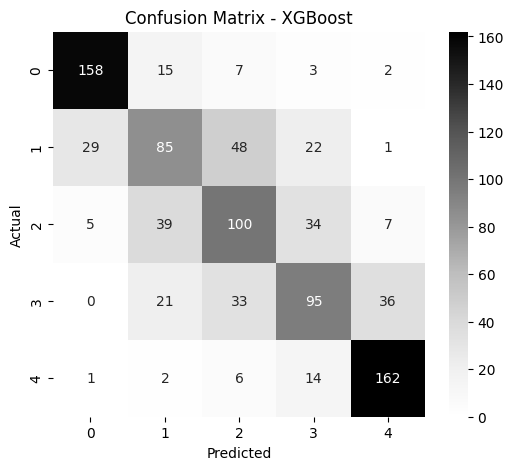

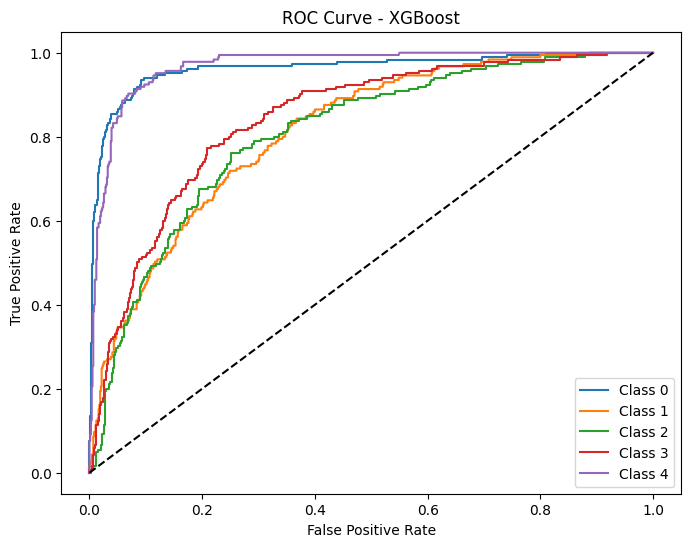

In [68]:
from xgboost import XGBClassifier

# Initialize XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric="mlogloss", random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(xgb, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(xgb, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
xgb_accuracy = cv_scores.mean()
xgb_train_time = end_train - start_train
xgb_test_time = end_test - start_test

print("\nXGBoost Performance:")
print(f"Average Accuracy: {xgb_accuracy:.4f}")
print(f"Training Time: {xgb_train_time:.4f} sec")
print(f"Testing Time: {xgb_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

xgb_accuracy_gb = cv_scores.mean()
xgb_train_time_gb = end_train - start_train
xgb_test_time_gb = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# ROC Curve
y_prob = cross_val_predict(xgb, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.show()

# 3.7 MLP


MLP Performance:
Average Accuracy: 0.6012
Training Time: 20.8943 sec
Testing Time: 21.6203 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.82      0.78       185
           1       0.52      0.43      0.47       185
           2       0.46      0.52      0.49       185
           3       0.53      0.43      0.47       185
           4       0.72      0.81      0.76       185

    accuracy                           0.60       925
   macro avg       0.59      0.60      0.59       925
weighted avg       0.59      0.60      0.59       925



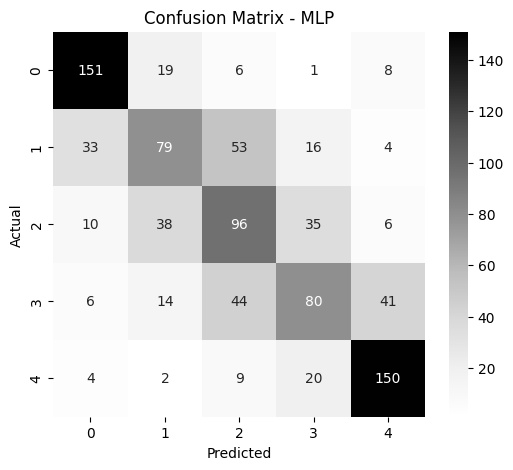

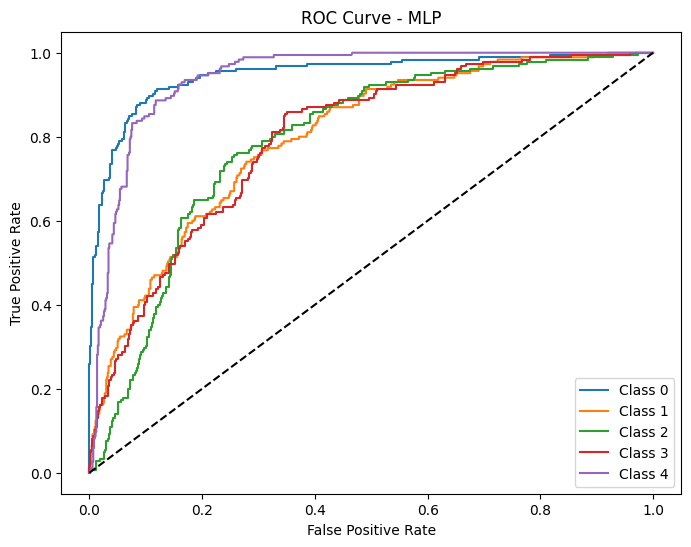

In [69]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(mlp, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(mlp, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
mlp_accuracy = cv_scores.mean()
mlp_train_time = end_train - start_train
mlp_test_time = end_test - start_test

print("\nMLP Performance:")
print(f"Average Accuracy: {mlp_accuracy:.4f}")
print(f"Training Time: {mlp_train_time:.4f} sec")
print(f"Testing Time: {mlp_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

mlp_accuracy_gb = cv_scores.mean()
mlp_train_time_gb = end_train - start_train
mlp_test_time_gb = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP")
plt.show()

# ROC Curve
y_prob = cross_val_predict(mlp, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP")
plt.legend()
plt.show()


# 3.8 CatBoost


CatBoost Performance:
Average Accuracy: 0.6660
Training Time: 11.8363 sec
Testing Time: 11.7507 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       185
           1       0.55      0.49      0.51       185
           2       0.51      0.52      0.52       185
           3       0.60      0.55      0.58       185
           4       0.79      0.89      0.84       185

    accuracy                           0.67       925
   macro avg       0.66      0.67      0.66       925
weighted avg       0.66      0.67      0.66       925



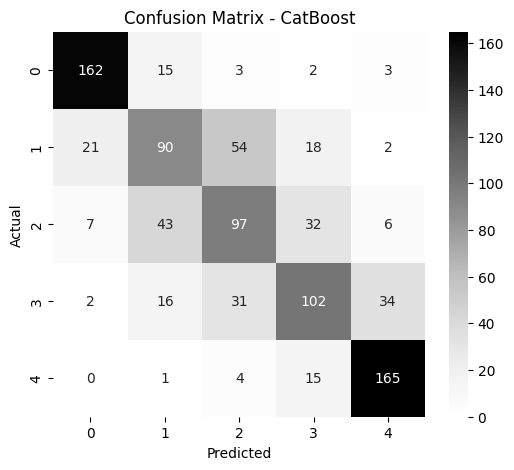

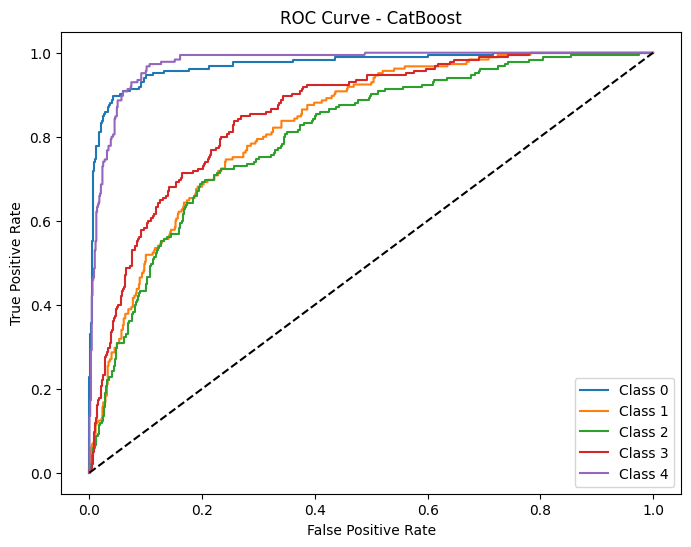

In [70]:
from catboost import CatBoostClassifier

# Initialize CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(catboost, X_smote_gb, y_smote_gb, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(catboost, X_smote_gb, y_smote_gb, cv=10)
end_test = time.time()

# Compute performance metrics
catboost_accuracy = cv_scores.mean()
catboost_train_time = end_train - start_train
catboost_test_time = end_test - start_test

print("\nCatBoost Performance:")
print(f"Average Accuracy: {catboost_accuracy:.4f}")
print(f"Training Time: {catboost_train_time:.4f} sec")
print(f"Testing Time: {catboost_test_time:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_gb, y_pred))

catboost_accuracy_gb = cv_scores.mean()
catboost_train_time_gb = end_train - start_train
catboost_test_time_gb = end_test - start_test


# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_gb, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greys", xticklabels=np.unique(y_smote_gb), yticklabels=np.unique(y_smote_gb))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()

# ROC Curve
y_prob = cross_val_predict(catboost, X_smote_gb, y_smote_gb, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_gb))):
    fpr, tpr, _ = roc_curve(y_smote_gb == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost")
plt.legend()
plt.show()


# Comparison for Gradient Boosting Feature Selection

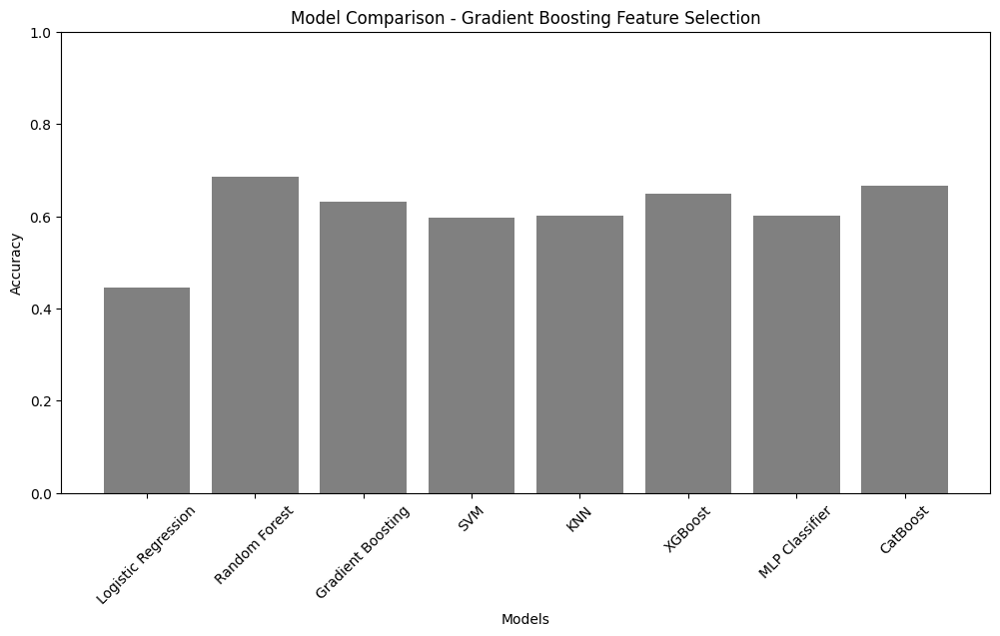

                 Model  Accuracy  Training Time (s)  Testing Time (s)
0  Logistic Regression  0.446482           0.352662          0.339896
1        Random Forest  0.686606           2.324746          2.346539
2    Gradient Boosting  0.632539           8.738457          8.807823
3                  SVM  0.597849           2.116047          2.111584
4                  KNN  0.601157           0.133897          0.123396
5              XGBoost  0.648738           2.337975          2.326481
6       MLP Classifier  0.601157          20.894259         21.620259
7             CatBoost  0.666036          11.836258         11.750712


In [71]:
# Store results for Gradient Boosting Feature Selection
gb_results = {
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM", "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy_gb, rf_accuracy_gb, gb_accuracy_gb, svm_accuracy_gb, knn_accuracy_gb, xgb_accuracy_gb, mlp_accuracy_gb, catboost_accuracy_gb],
    "Training Time (s)": [lr_train_time_gb, rf_train_time_gb, gb_train_time_gb, svm_train_time_gb, knn_train_time_gb, xgb_train_time_gb, mlp_train_time_gb, catboost_train_time_gb],
    "Testing Time (s)": [lr_test_time_gb, rf_test_time_gb, gb_test_time_gb, svm_test_time_gb, knn_test_time_gb, xgb_test_time_gb, mlp_test_time_gb, catboost_test_time_gb]
}

df_gb = pd.DataFrame(gb_results)

plt.figure(figsize=(12, 6))
plt.bar(df_gb["Model"], df_gb["Accuracy"], color="gray")
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Model Comparison - Gradient Boosting Feature Selection")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

# Display table
print(df_gb)


# 4. Mutual Information

Top 10 Features (Mutual Information):
GPA of last semester
Primary academic goal
Class attendance
Financial aid
Stress
Sleeping hours
Financial difficulties
Technology comfort
Caffeine consumtion
Self-study per week


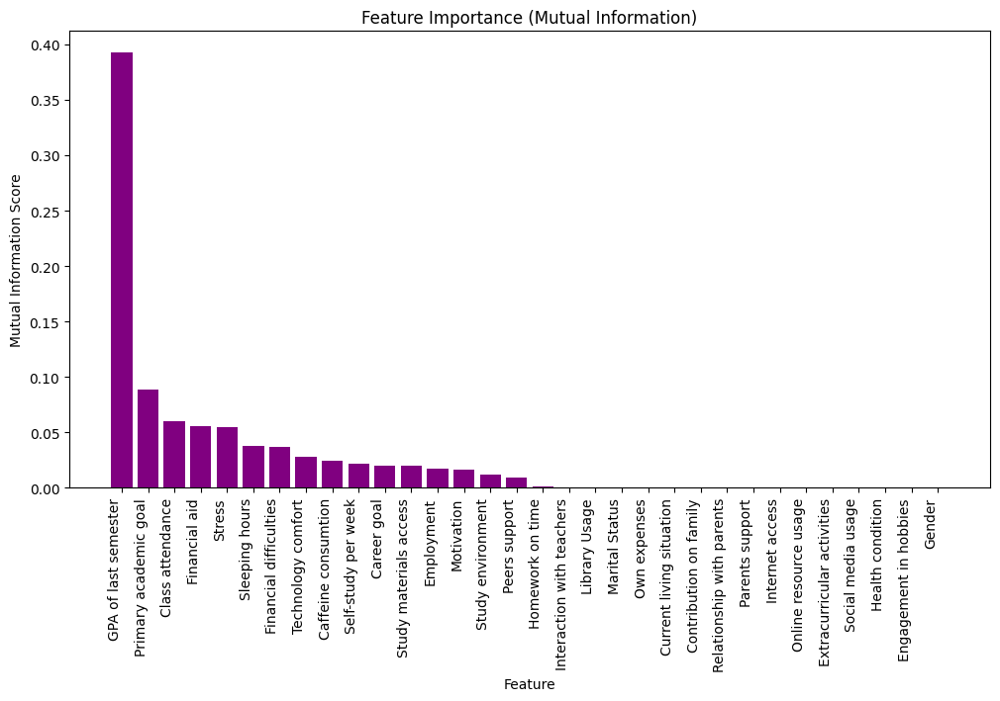

In [72]:
from sklearn.feature_selection import mutual_info_classif

# Compute mutual information scores
mi_scores = mutual_info_classif(X, y)

# Sort features by score
sorted_indices = np.argsort(mi_scores)[::-1]
sorted_features = X.columns[sorted_indices]
sorted_scores = mi_scores[sorted_indices]

# Print only top 10 features
print("Top 10 Features (Mutual Information):")
for feature in sorted_features[:10]:
    print(feature)

# Plot all features
plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_scores, color='purple')
plt.ylabel("Mutual Information Score")
plt.xlabel("Feature")
plt.title("Feature Importance (Mutual Information)")
plt.xticks(rotation=90, ha="right")
plt.show()


# Apply SMOTE

In [73]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Select top 10 features from Mutual Information selection
top_features_mi = sorted_features[:10]

# Create a new dataset with only selected features
X_mi_selected = X[top_features_mi]
y_mi_selected = y

# Apply SMOTE to balance the dataset
smote = SMOTE(sampling_strategy="auto", random_state=42)
X_smote_mi, y_smote_mi = smote.fit_resample(X_mi_selected, y_mi_selected)

# Confirm shape and class distribution
print(f"Shape of X_smote_mi: {X_smote_mi.shape}")
print(f"Shape of y_smote_mi: {y_smote_mi.shape}")
print("After Balancing:", Counter(y_smote_mi))

Shape of X_smote_mi: (925, 10)
Shape of y_smote_mi: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 4.1 Logistic Regression


Logistic Regression Performance:
Average Accuracy: 0.4508
Training Time: 0.5825 sec
Testing Time: 0.5532 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.51      0.49       185
           1       0.41      0.45      0.43       185
           2       0.39      0.29      0.33       185
           3       0.42      0.31      0.35       185
           4       0.52      0.69      0.60       185

    accuracy                           0.45       925
   macro avg       0.44      0.45      0.44       925
weighted avg       0.44      0.45      0.44       925



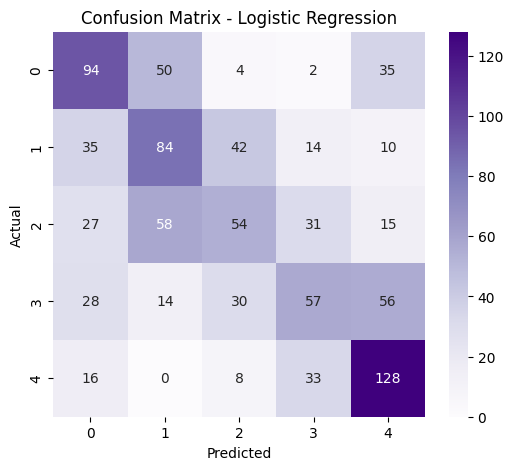

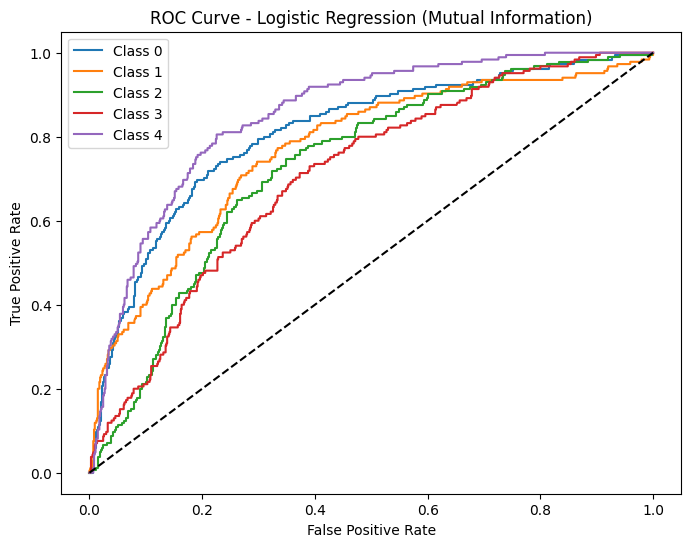

In [74]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_mi, y_smote_mi, cv=10)  # Predictions from 10-Fold CV
end_test = time.time()

# Compute performance metrics
print("\nLogistic Regression Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
lr_accuracy_mi = cv_scores.mean()
lr_train_time_mi = end_train - start_train
lr_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal reference line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression (Mutual Information)")
plt.legend()
plt.show()


# 4.2 Random Forest Classifier


Random Forest Performance:
Average Accuracy: 0.6844
Training Time: 2.2999 sec
Testing Time: 2.2946 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.91      0.87       185
           1       0.58      0.48      0.52       185
           2       0.53      0.52      0.52       185
           3       0.60      0.63      0.62       185
           4       0.83      0.89      0.86       185

    accuracy                           0.68       925
   macro avg       0.68      0.68      0.68       925
weighted avg       0.68      0.68      0.68       925



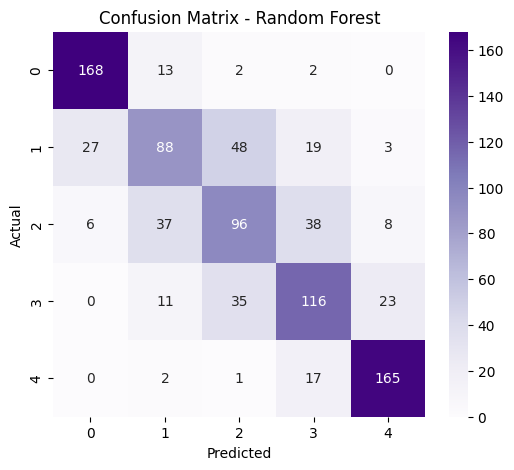

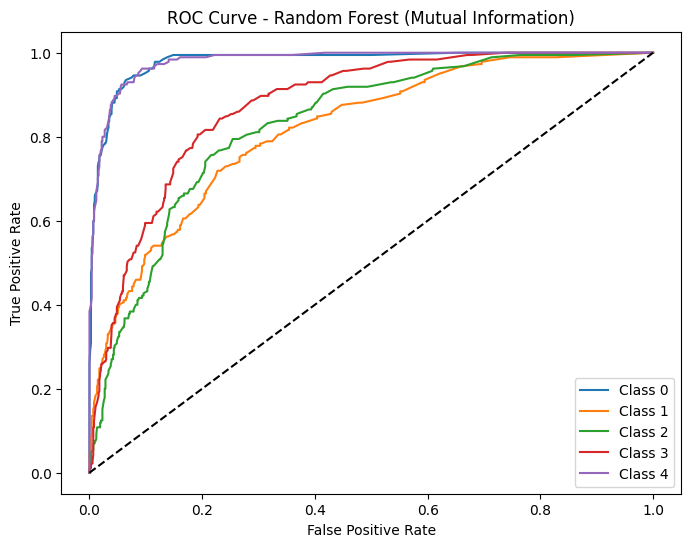

In [75]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nRandom Forest Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
rf_accuracy_mi = cv_scores.mean()
rf_train_time_mi = end_train - start_train
rf_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(rf, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest (Mutual Information)")
plt.legend()
plt.show()


# 4.3 Gradient Boosting Classifier


Gradient Boosting Performance:
Average Accuracy: 0.6346
Training Time: 8.4085 sec
Testing Time: 8.4751 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.81      0.80       185
           1       0.57      0.43      0.49       185
           2       0.46      0.49      0.48       185
           3       0.54      0.58      0.56       185
           4       0.78      0.86      0.82       185

    accuracy                           0.63       925
   macro avg       0.63      0.63      0.63       925
weighted avg       0.63      0.63      0.63       925



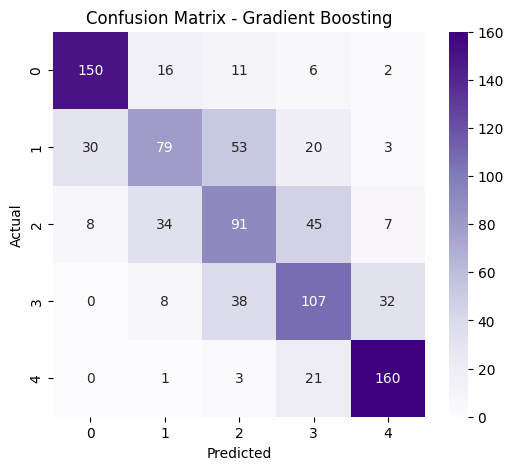

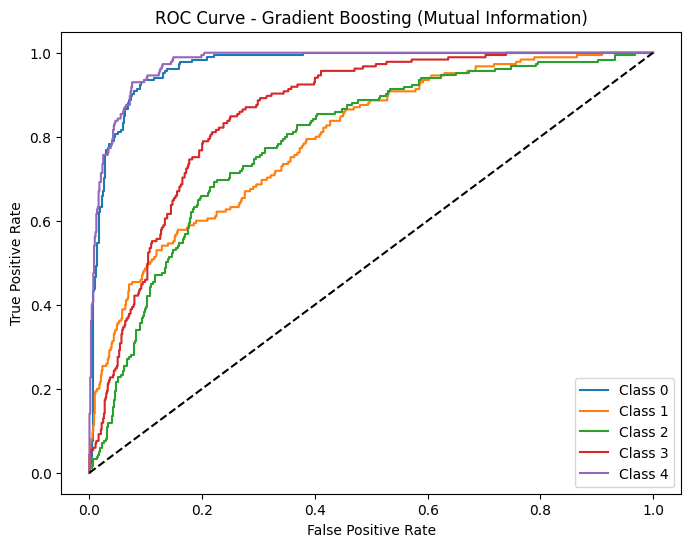

In [76]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nGradient Boosting Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
gb_accuracy_mi = cv_scores.mean()
gb_train_time_mi = end_train - start_train
gb_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(gb, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting (Mutual Information)")
plt.legend()
plt.show()


# 4.4 SVM


SVM Performance:
Average Accuracy: 0.6141
Training Time: 2.0559 sec
Testing Time: 2.0199 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.81      0.77       185
           1       0.58      0.42      0.49       185
           2       0.47      0.50      0.48       185
           3       0.52      0.49      0.50       185
           4       0.73      0.86      0.79       185

    accuracy                           0.61       925
   macro avg       0.61      0.61      0.61       925
weighted avg       0.61      0.61      0.61       925



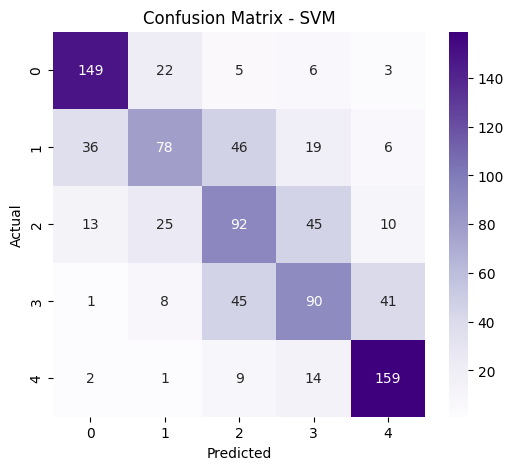

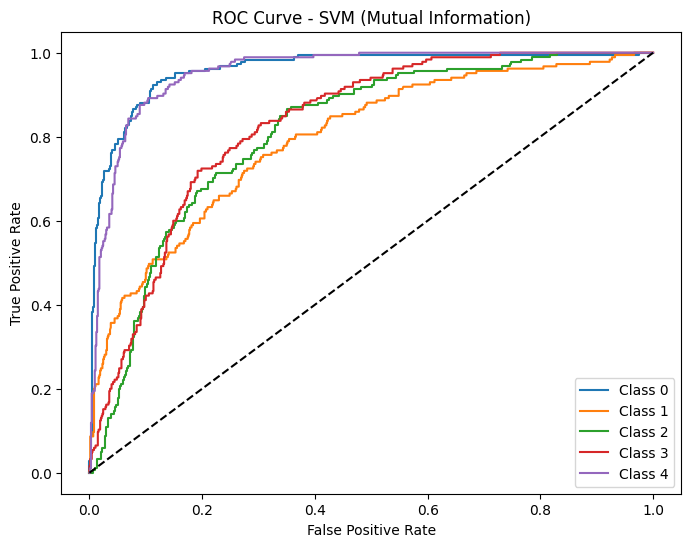

In [77]:
from sklearn.svm import SVC

# Initialize SVM
svm_model = SVC(probability=True, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(svm_model, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(svm_model, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nSVM Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
svm_accuracy_mi = cv_scores.mean()
svm_train_time_mi = end_train - start_train
svm_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(svm_model, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM (Mutual Information)")
plt.legend()
plt.show()


# 4.5 KNN


KNN Performance:
Average Accuracy: 0.6076
Training Time: 0.1327 sec
Testing Time: 0.1219 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.89      0.80       185
           1       0.51      0.41      0.46       185
           2       0.45      0.45      0.45       185
           3       0.54      0.47      0.50       185
           4       0.74      0.82      0.78       185

    accuracy                           0.61       925
   macro avg       0.59      0.61      0.60       925
weighted avg       0.59      0.61      0.60       925



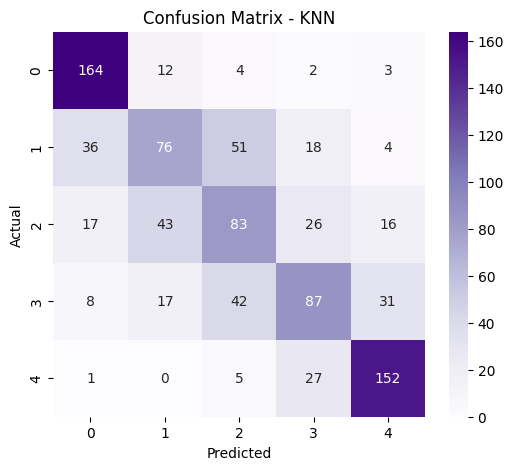

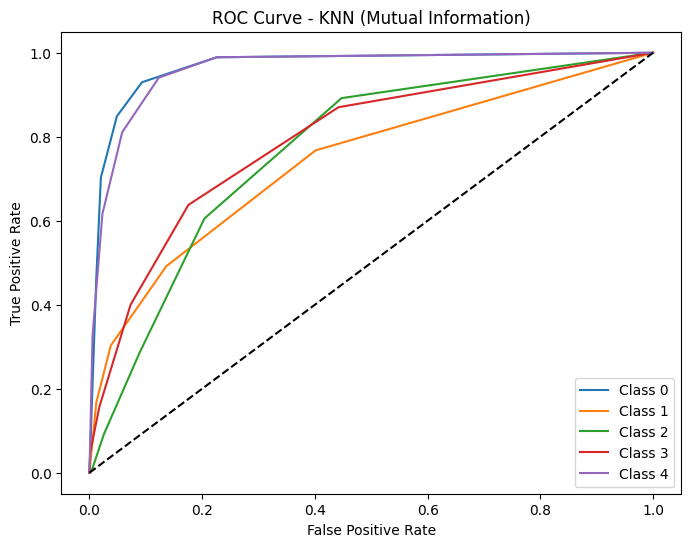

In [78]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize KNN
knn = KNeighborsClassifier(n_neighbors=5)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nKNN Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
knn_accuracy_mi = cv_scores.mean()
knn_train_time_mi = end_train - start_train
knn_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(knn, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN (Mutual Information)")
plt.legend()
plt.show()


# 4.6 XGBoost


XGBoost Performance:
Average Accuracy: 0.6682
Training Time: 2.3954 sec
Testing Time: 4.4686 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.85      0.84       185
           1       0.53      0.50      0.52       185
           2       0.53      0.52      0.53       185
           3       0.60      0.60      0.60       185
           4       0.83      0.86      0.85       185

    accuracy                           0.67       925
   macro avg       0.66      0.67      0.67       925
weighted avg       0.66      0.67      0.67       925



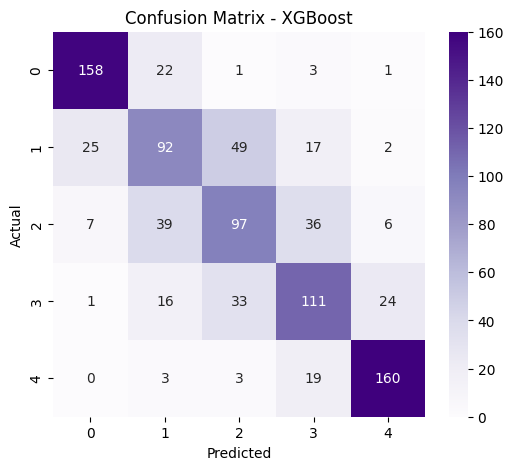

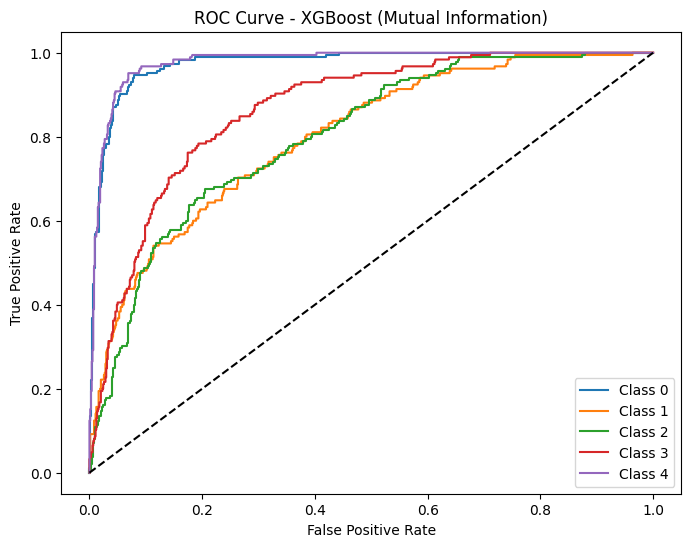

In [79]:
from xgboost import XGBClassifier

# Initialize XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(xgb, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(xgb, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nXGBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
xgb_accuracy_mi = cv_scores.mean()
xgb_train_time_mi = end_train - start_train
xgb_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(xgb, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost (Mutual Information)")
plt.legend()
plt.show()


# 4.7 MLP


MLP Performance:
Average Accuracy: 0.6174
Training Time: 20.2582 sec
Testing Time: 20.6703 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.84      0.83       185
           1       0.55      0.50      0.53       185
           2       0.47      0.49      0.48       185
           3       0.49      0.45      0.47       185
           4       0.73      0.80      0.76       185

    accuracy                           0.62       925
   macro avg       0.61      0.62      0.61       925
weighted avg       0.61      0.62      0.61       925



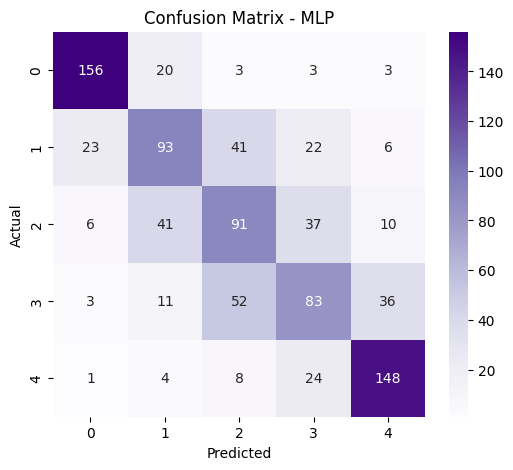

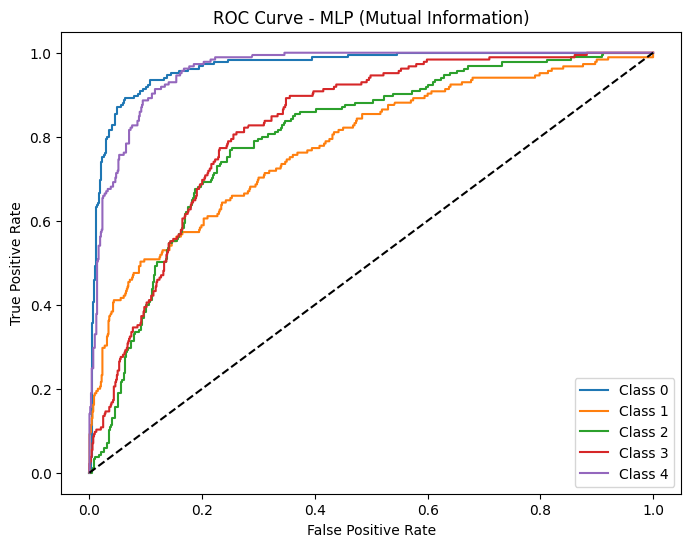

In [80]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(mlp, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(mlp, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nMLP Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
mlp_accuracy_mi = cv_scores.mean()
mlp_train_time_mi = end_train - start_train
mlp_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(mlp, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP (Mutual Information)")
plt.legend()
plt.show()


# 4.8 CatBoost


CatBoost Performance:
Average Accuracy: 0.6737
Training Time: 11.7898 sec
Testing Time: 11.7475 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       185
           1       0.56      0.49      0.52       185
           2       0.52      0.53      0.52       185
           3       0.58      0.58      0.58       185
           4       0.82      0.89      0.85       185

    accuracy                           0.67       925
   macro avg       0.67      0.67      0.67       925
weighted avg       0.67      0.67      0.67       925



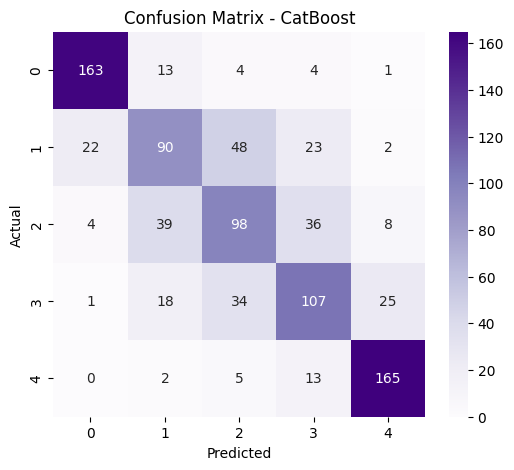

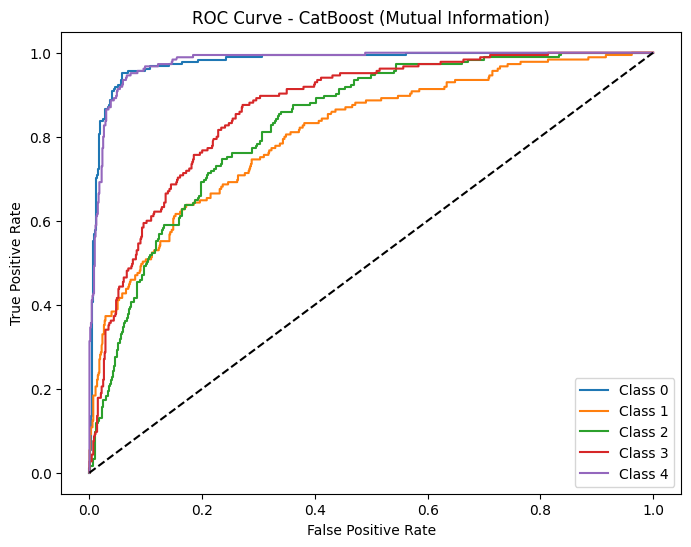

In [81]:
from catboost import CatBoostClassifier

# Initialize CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(catboost, X_smote_mi, y_smote_mi, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(catboost, X_smote_mi, y_smote_mi, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nCatBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_mi, y_pred))

# Store results
catboost_accuracy_mi = cv_scores.mean()
catboost_train_time_mi = end_train - start_train
catboost_test_time_mi = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_mi, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Purples", xticklabels=np.unique(y_smote_mi), yticklabels=np.unique(y_smote_mi))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(catboost, X_smote_mi, y_smote_mi, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_mi))):
    fpr, tpr, _ = roc_curve(y_smote_mi == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost (Mutual Information)")
plt.legend()
plt.show()


# Comparison for Mutual Information Feature Selection

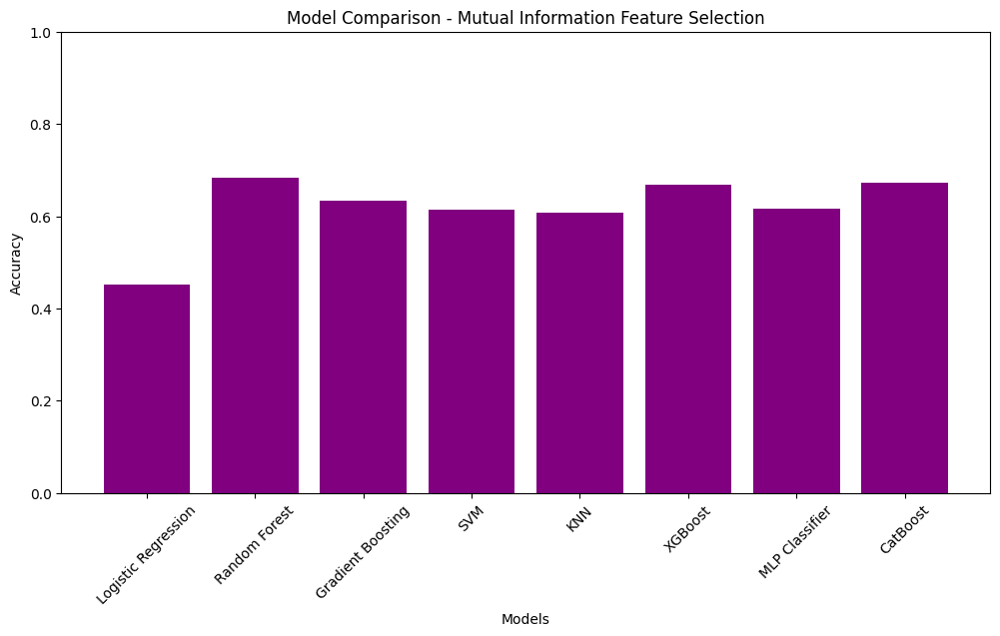

                 Model  Accuracy  Training Time (s)  Testing Time (s)
0  Logistic Regression  0.450830           0.582481          0.553232
1        Random Forest  0.684350           2.299886          2.294619
2    Gradient Boosting  0.634596           8.408501          8.475071
3                  SVM  0.614119           2.055857          2.019938
4                  KNN  0.607574           0.132673          0.121853
5              XGBoost  0.668198           2.395374          4.468604
6       MLP Classifier  0.617415          20.258215         20.670286
7             CatBoost  0.673668          11.789798         11.747527


In [82]:
# Store results for Mutual Information Feature Selection
mi_results = {
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM", "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy_mi, rf_accuracy_mi, gb_accuracy_mi, svm_accuracy_mi, knn_accuracy_mi, xgb_accuracy_mi, mlp_accuracy_mi, catboost_accuracy_mi],
    "Training Time (s)": [lr_train_time_mi, rf_train_time_mi, gb_train_time_mi, svm_train_time_mi, knn_train_time_mi, xgb_train_time_mi, mlp_train_time_mi, catboost_train_time_mi],
    "Testing Time (s)": [lr_test_time_mi, rf_test_time_mi, gb_test_time_mi, svm_test_time_mi, knn_test_time_mi, xgb_test_time_mi, mlp_test_time_mi, catboost_test_time_mi]
}

df_mi = pd.DataFrame(mi_results)

# Plot Accuracy Comparison
plt.figure(figsize=(12, 6))
plt.bar(df_mi["Model"], df_mi["Accuracy"], color="purple")
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Model Comparison - Mutual Information Feature Selection")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

# Display table
print(df_mi)

# 5. ANOVA-F Test

Top 10 Features (ANOVA F-Test):
GPA of last semester
Class attendance
Motivation
Primary academic goal
Peers support
Financial aid
Homework on time
Self-study per week
Relationship with parents
Parents support


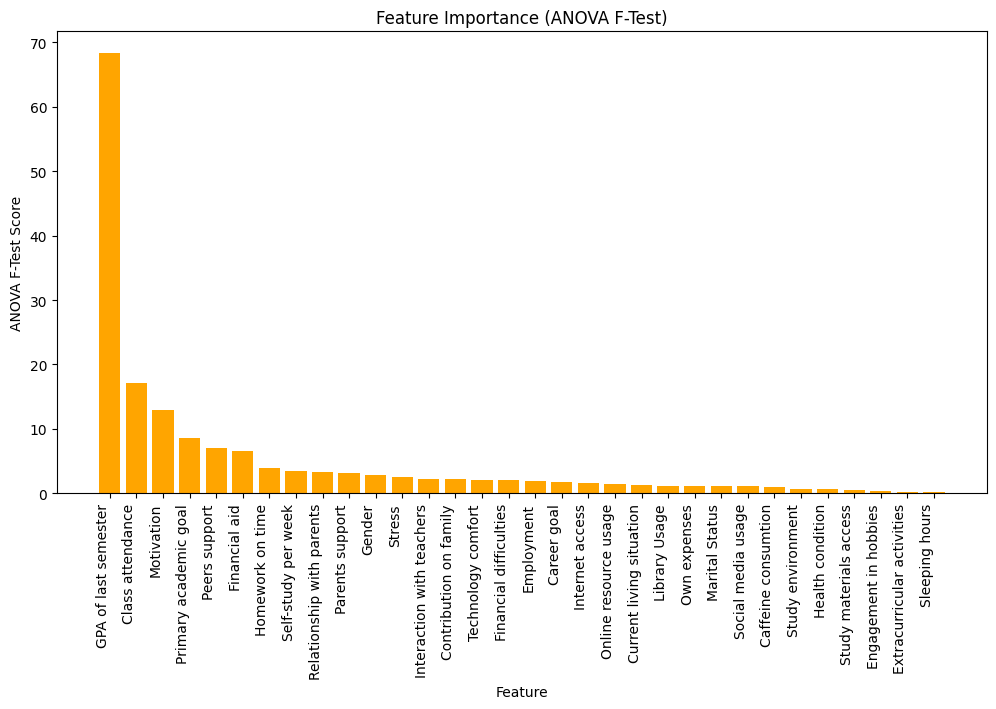

In [83]:
from sklearn.feature_selection import f_classif

# Compute ANOVA F-scores
anova_scores, _ = f_classif(X, y)

# Sort features by score
sorted_indices = np.argsort(anova_scores)[::-1]
sorted_features = X.columns[sorted_indices]
sorted_scores = anova_scores[sorted_indices]

# Print only top 10 features
print("Top 10 Features (ANOVA F-Test):")
for feature in sorted_features[:10]:
    print(feature)

# Plot all features
plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_scores, color='orange')
plt.ylabel("ANOVA F-Test Score")
plt.xlabel("Feature")
plt.title("Feature Importance (ANOVA F-Test)")
plt.xticks(rotation=90, ha="right")
plt.show()


# Apply SMOTE

In [84]:
from imblearn.over_sampling import SMOTE

# Select top 10 features
top_10_features_anova = sorted_features[:10]
X_selected_anova = X[top_10_features_anova]

# Apply SMOTE
smote = SMOTE(random_state=42)
X_smote_anova, y_smote_anova = smote.fit_resample(X_selected_anova, y)

# Display the shape after SMOTE
print("Shape of X_smote_anova:", X_smote_anova.shape)
print("Shape of y_smote_anova:", y_smote_anova.shape)

# Check class distribution after SMOTE
from collections import Counter
print("After Balancing:", Counter(y_smote_anova))


Shape of X_smote_anova: (925, 10)
Shape of y_smote_anova: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 5.1 Logistic Regression


Logistic Regression Performance:
Average Accuracy: 0.4789
Training Time: 0.4968 sec
Testing Time: 0.4901 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.50      0.49       185
           1       0.44      0.50      0.47       185
           2       0.45      0.32      0.37       185
           3       0.44      0.36      0.40       185
           4       0.56      0.71      0.62       185

    accuracy                           0.48       925
   macro avg       0.47      0.48      0.47       925
weighted avg       0.47      0.48      0.47       925



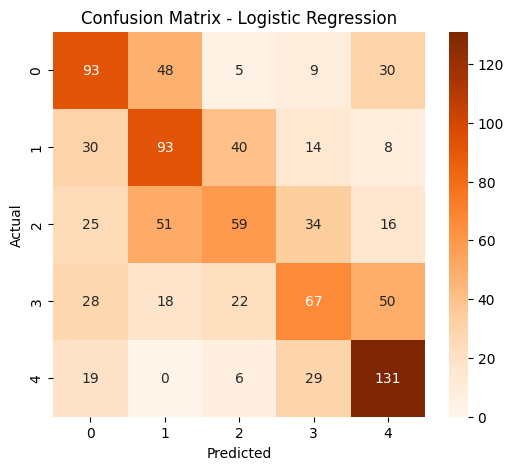

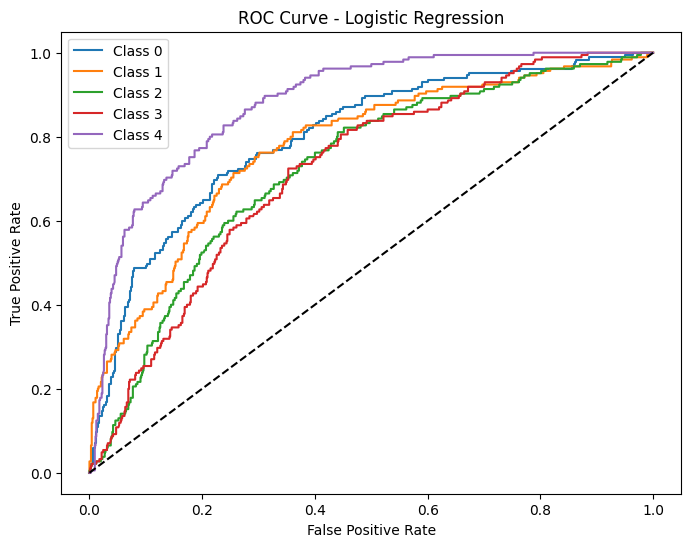

In [85]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_anova, y_smote_anova, cv=10)  # Predictions from 10-Fold CV
end_test = time.time()

# Compute performance metrics
print("\nLogistic Regression Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
lr_accuracy_anova = cv_scores.mean()
lr_train_time_anova = end_train - start_train
lr_test_time_anova = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression")
plt.legend()
plt.show()


# 5.2 Random Forest


Random Forest Performance:
Average Accuracy: 0.6402
Training Time: 2.3028 sec
Testing Time: 2.3192 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.89      0.84       185
           1       0.56      0.48      0.52       185
           2       0.49      0.47      0.48       185
           3       0.54      0.50      0.52       185
           4       0.76      0.86      0.81       185

    accuracy                           0.64       925
   macro avg       0.63      0.64      0.63       925
weighted avg       0.63      0.64      0.63       925



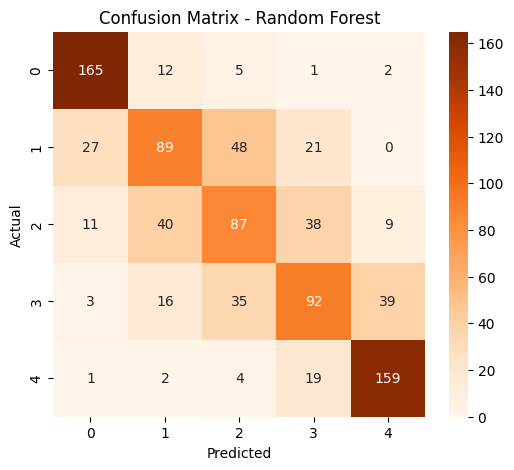

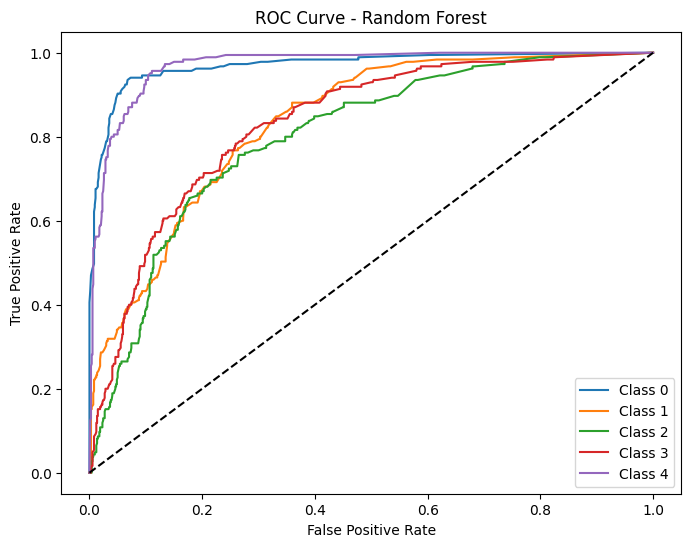

In [86]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nRandom Forest Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
rf_accuracy_anova = cv_scores.mean()
rf_train_time_anova = end_train - start_train
rf_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf_clf, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 5.3 Gradient Boosting


Gradient Boosting Performance:
Average Accuracy: 0.6487
Training Time: 8.2882 sec
Testing Time: 8.3440 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       185
           1       0.57      0.45      0.50       185
           2       0.52      0.54      0.53       185
           3       0.55      0.55      0.55       185
           4       0.74      0.84      0.79       185

    accuracy                           0.65       925
   macro avg       0.64      0.65      0.64       925
weighted avg       0.64      0.65      0.64       925



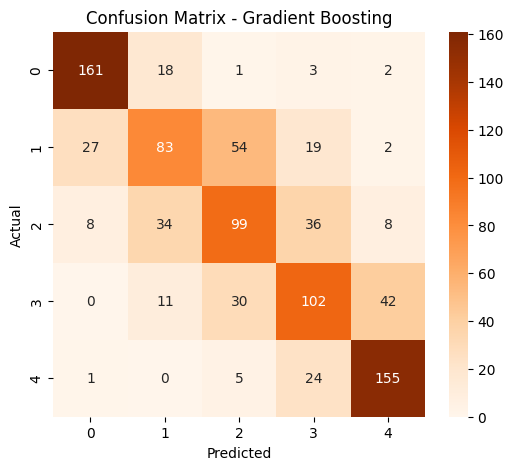

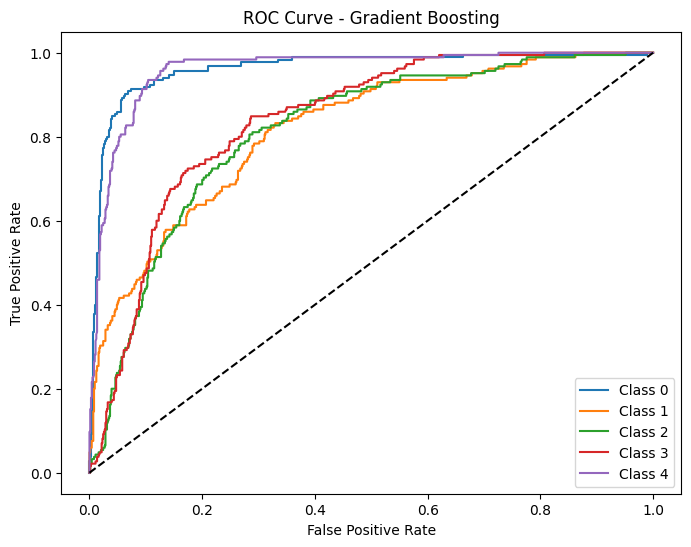

In [87]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting Classifier
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(gb_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(gb_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nGradient Boosting Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
gb_accuracy_anova = cv_scores.mean()
gb_train_time_anova = end_train - start_train
gb_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

# ROC Curve
y_prob = cross_val_predict(gb_clf, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()


# 5.4 SVM


SVM Performance:
Average Accuracy: 0.6185
Training Time: 1.9489 sec
Testing Time: 1.9389 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.77      0.78       185
           1       0.53      0.48      0.50       185
           2       0.51      0.51      0.51       185
           3       0.53      0.52      0.53       185
           4       0.71      0.81      0.76       185

    accuracy                           0.62       925
   macro avg       0.61      0.62      0.62       925
weighted avg       0.61      0.62      0.62       925



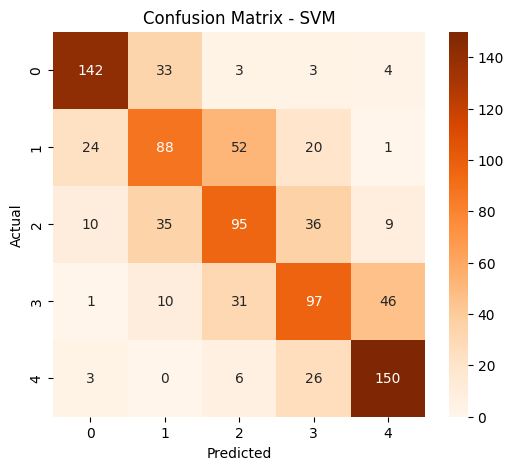

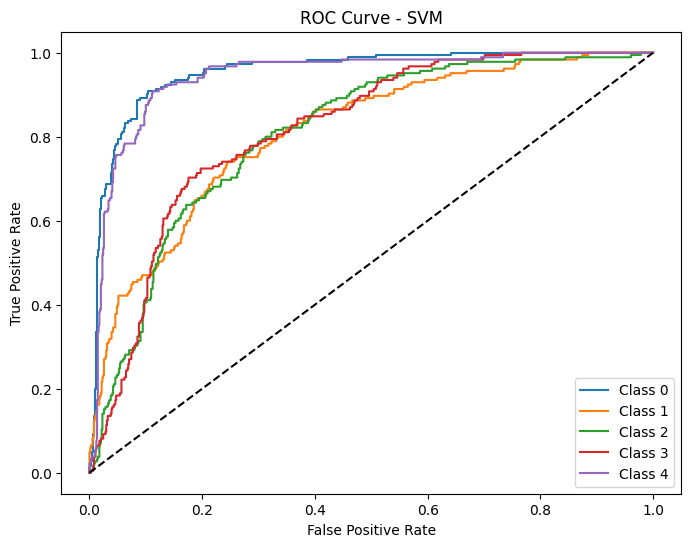

In [88]:
from sklearn.svm import SVC

# Initialize SVM
svm_clf = SVC(probability=True, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(svm_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(svm_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nSVM Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
svm_accuracy_anova = cv_scores.mean()
svm_train_time_anova = end_train - start_train
svm_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

# ROC Curve
y_prob = cross_val_predict(svm_clf, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()


# 5.5 KNN


KNN Performance:
Average Accuracy: 0.5915
Training Time: 0.1344 sec
Testing Time: 0.1236 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.91      0.81       185
           1       0.52      0.51      0.52       185
           2       0.41      0.41      0.41       185
           3       0.48      0.37      0.42       185
           4       0.75      0.76      0.75       185

    accuracy                           0.59       925
   macro avg       0.58      0.59      0.58       925
weighted avg       0.58      0.59      0.58       925



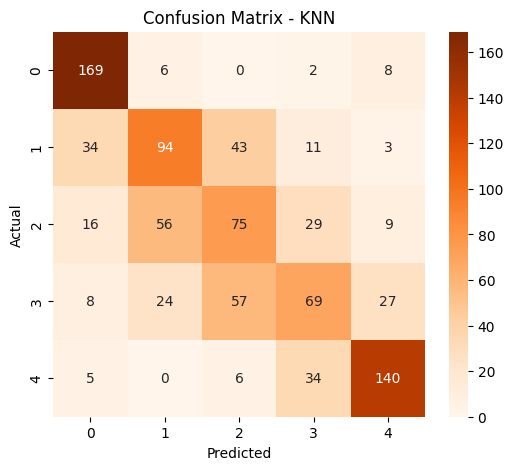

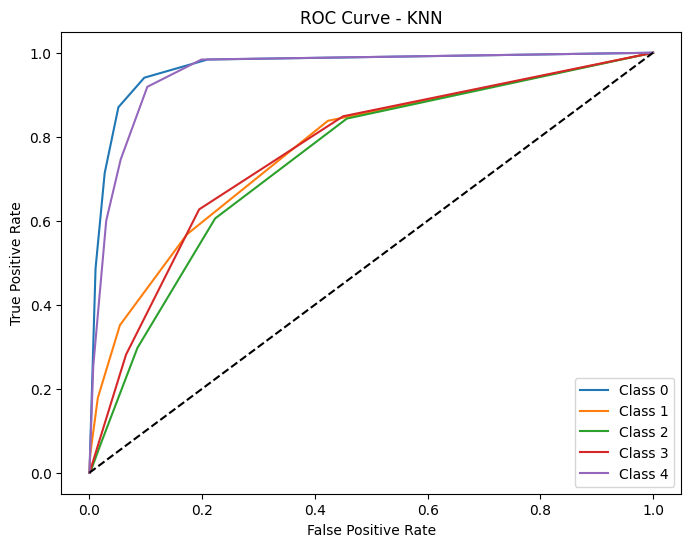

In [89]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize KNN
knn_clf = KNeighborsClassifier(n_neighbors=5)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(knn_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(knn_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nKNN Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
knn_accuracy_anova = cv_scores.mean()
knn_train_time_anova = end_train - start_train
knn_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

# ROC Curve
y_prob = cross_val_predict(knn_clf, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()


# 5.6 XGBoost


XGBoost Performance:
Average Accuracy: 0.6326
Training Time: 2.3149 sec
Testing Time: 2.3315 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.87      0.83       185
           1       0.52      0.47      0.49       185
           2       0.48      0.46      0.47       185
           3       0.55      0.52      0.54       185
           4       0.78      0.84      0.81       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.63       925
weighted avg       0.62      0.63      0.63       925



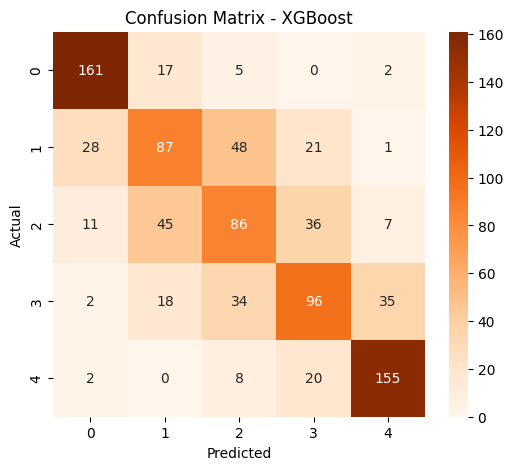

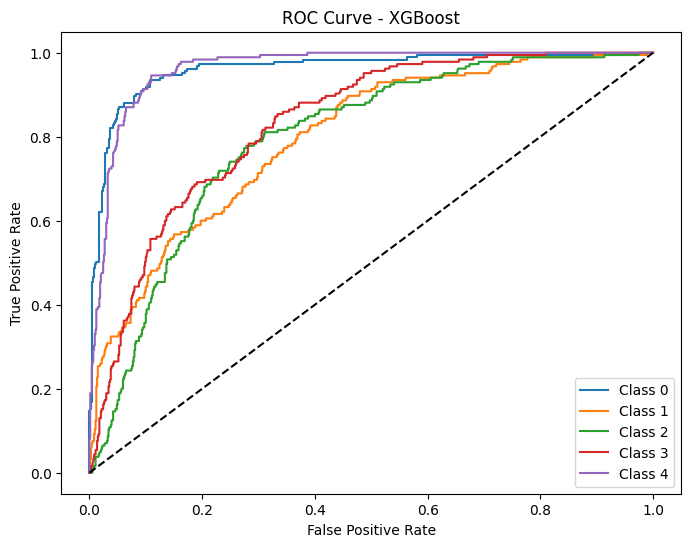

In [90]:
from xgboost import XGBClassifier

# Initialize XGBoost Classifier
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(xgb_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(xgb_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nXGBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
xgb_accuracy_anova = cv_scores.mean()
xgb_train_time_anova = end_train - start_train
xgb_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# ROC Curve
y_prob = cross_val_predict(xgb_clf, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.show()


# 5.7 MLP


MLP Classifier Performance:
Average Accuracy: 0.6303
Training Time: 20.6324 sec
Testing Time: 21.1971 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.83      0.80       185
           1       0.56      0.44      0.50       185
           2       0.51      0.52      0.51       185
           3       0.56      0.52      0.54       185
           4       0.72      0.83      0.77       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.62       925
weighted avg       0.62      0.63      0.62       925



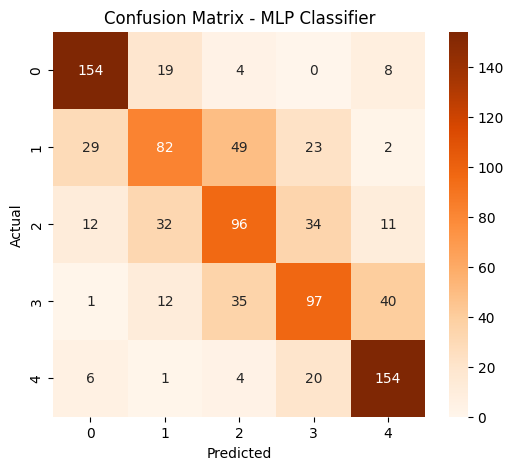

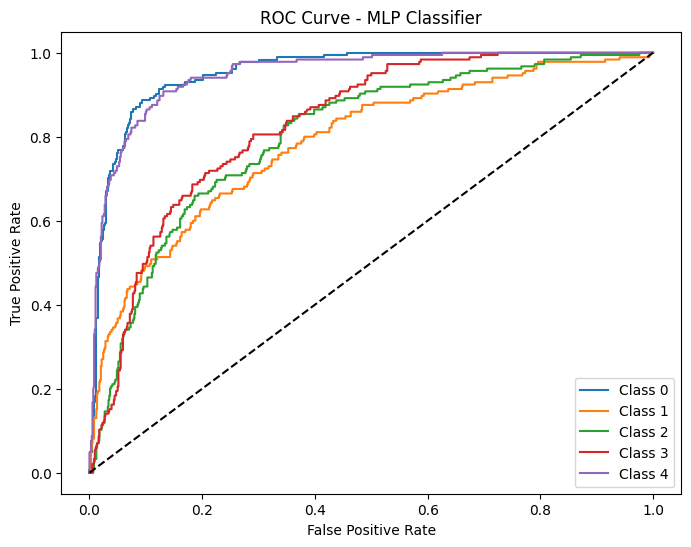

In [91]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP Classifier
mlp_clf = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(mlp_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(mlp_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nMLP Classifier Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
mlp_accuracy_anova = cv_scores.mean()
mlp_train_time_anova = end_train - start_train
mlp_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier")
plt.show()

# ROC Curve
y_prob = cross_val_predict(mlp_clf, X_smote_anova, y_smote_anova, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_anova))):
    fpr, tpr, _ = roc_curve(y_smote_anova == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier")
plt.legend()
plt.show()


# 5.8 CatBoost


CatBoost Performance:
Average Accuracy: 0.6456
Training Time: 6.0844 sec
Testing Time: 6.0129 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       185
           1       0.54      0.49      0.52       185
           2       0.49      0.49      0.49       185
           3       0.55      0.52      0.54       185
           4       0.78      0.84      0.81       185

    accuracy                           0.65       925
   macro avg       0.64      0.65      0.64       925
weighted avg       0.64      0.65      0.64       925



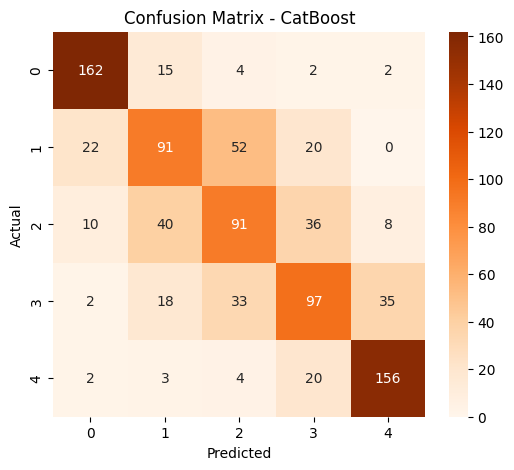

In [92]:
from catboost import CatBoostClassifier

# Initialize CatBoost Classifier
catboost_clf = CatBoostClassifier(iterations=500, depth=6, learning_rate=0.1, verbose=0, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(catboost_clf, X_smote_anova, y_smote_anova, cv=10, scoring='accuracy')  
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(catboost_clf, X_smote_anova, y_smote_anova, cv=10)  
end_test = time.time()

# Compute performance metrics
print("\nCatBoost Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Classification report
print("\nClassification Report:")
print(classification_report(y_smote_anova, y_pred))

# Store results
catboost_accuracy_anova = cv_scores.mean()
catboost_train_time_anova = end_train - start_train
catboost_test_time_anova = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_anova, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_anova), yticklabels=np.unique(y_smote_anova))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()


# Comparison for ANOVA F-Test Feature Selection

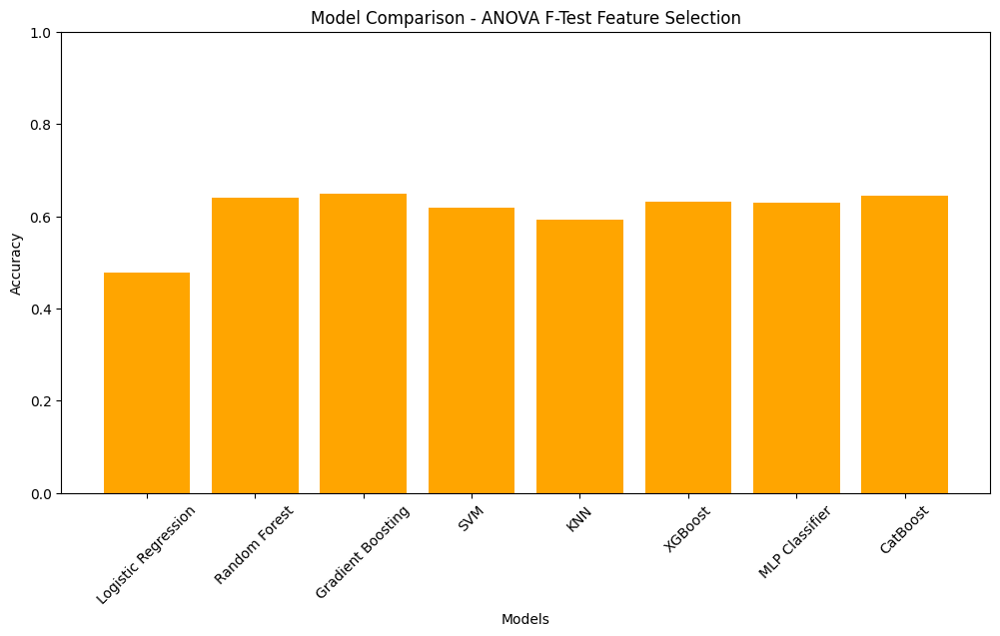

                 Model  Accuracy  Training Time (s)  Testing Time (s)
0  Logistic Regression  0.478915           0.496801          0.490087
1        Random Forest  0.640159           2.302781          2.319201
2    Gradient Boosting  0.648726           8.288197          8.343975
3                  SVM  0.618478           1.948853          1.938914
4                  KNN  0.591515           0.134434          0.123580
5              XGBoost  0.632632           2.314907          2.331550
6       MLP Classifier  0.630306          20.632411         21.197102
7             CatBoost  0.645570           6.084363          6.012890


In [93]:
import pandas as pd
import matplotlib.pyplot as plt

# Store results for ANOVA F-Test Feature Selection
anova_results = {
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM", "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy_anova, rf_accuracy_anova, gb_accuracy_anova, svm_accuracy_anova, knn_accuracy_anova, xgb_accuracy_anova, mlp_accuracy_anova, catboost_accuracy_anova],
    "Training Time (s)": [lr_train_time_anova, rf_train_time_anova, gb_train_time_anova, svm_train_time_anova, knn_train_time_anova, xgb_train_time_anova, mlp_train_time_anova, catboost_train_time_anova],
    "Testing Time (s)": [lr_test_time_anova, rf_test_time_anova, gb_test_time_anova, svm_test_time_anova, knn_test_time_anova, xgb_test_time_anova, mlp_test_time_anova, catboost_test_time_anova]
}

df_anova = pd.DataFrame(anova_results)

# Plot Accuracy Comparison
plt.figure(figsize=(12, 6))
plt.bar(df_anova["Model"], df_anova["Accuracy"], color="orange")
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Model Comparison - ANOVA F-Test Feature Selection")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

# Display table
print(df_anova)


# 6. Lasso Regression Feature Selection 

Top 10 Features (Lasso Regression):
GPA of last semester
Class attendance
Marital Status
Financial aid
Motivation
Gender
Primary academic goal
Own expenses
Contribution on family
Homework on time


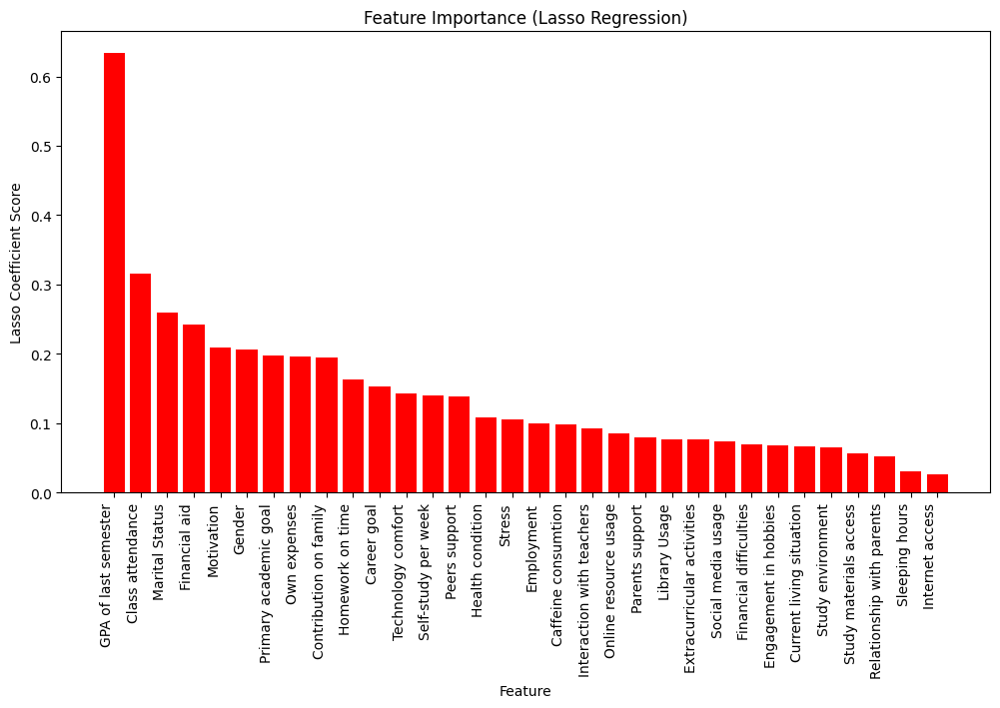

In [94]:
from sklearn.linear_model import LogisticRegression

# Apply Lasso Regularization (L1)
lasso = LogisticRegression(penalty='l1', solver='liblinear', random_state=42)
lasso.fit(X, y)

# For multi-class, take the mean of absolute coefficients across all classes
lasso_importances = np.abs(lasso.coef_).mean(axis=0)  # Average across all classes

# Ensure correct shape
if len(lasso_importances) != len(X.columns):
    raise ValueError(f"Mismatch: lasso_importances has {len(lasso_importances)} values, but X has {len(X.columns)} features.")

# Sort features by importance
sorted_indices = np.argsort(lasso_importances)[::-1]
sorted_features = X.columns[sorted_indices]
sorted_scores = lasso_importances[sorted_indices]

# Print only top 10 features
print("Top 10 Features (Lasso Regression):")
for feature in sorted_features[:10]:
    print(feature)

# Plot all features
plt.figure(figsize=(12, 6))
plt.bar(sorted_features, sorted_scores, color='red')
plt.ylabel("Lasso Coefficient Score")
plt.xlabel("Feature")
plt.title("Feature Importance (Lasso Regression)")
plt.xticks(rotation=90, ha="right")
plt.show()



# Apply SMOTE

In [95]:
from imblearn.over_sampling import SMOTE
import numpy as np

# Select top 10 features from Lasso Regression
top_10_lasso_features = sorted_features[:10]

# Extract new feature set
X_selected_lasso = X[top_10_lasso_features]

# Apply SMOTE for class balancing
smote = SMOTE(random_state=42)
X_smote_lasso, y_smote_lasso = smote.fit_resample(X_selected_lasso, y)

# Display new shape after balancing
print(f"Shape of X_smote_lasso: {X_smote_lasso.shape}")
print(f"Shape of y_smote_lasso: {y_smote_lasso.shape}")

# Verify class distribution after SMOTE
from collections import Counter
print("After Balancing:", Counter(y_smote_lasso))


Shape of X_smote_lasso: (925, 10)
Shape of y_smote_lasso: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 6.1 Logistic Regression


Logistic Regression Performance:
Average Accuracy: 0.4455
Training Time: 0.5156 sec
Testing Time: 0.5122 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.43      0.42       185
           1       0.41      0.49      0.45       185
           2       0.42      0.32      0.36       185
           3       0.37      0.26      0.31       185
           4       0.55      0.72      0.62       185

    accuracy                           0.45       925
   macro avg       0.43      0.45      0.43       925
weighted avg       0.43      0.45      0.43       925



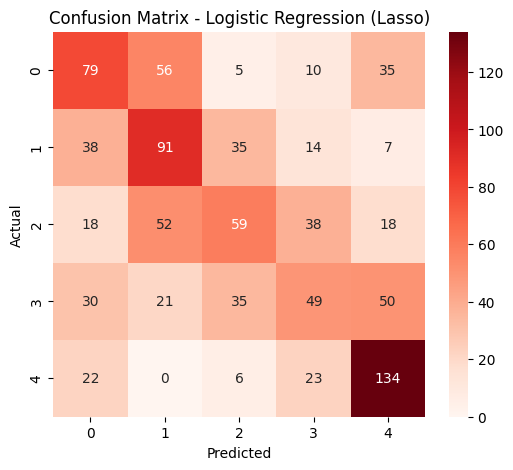

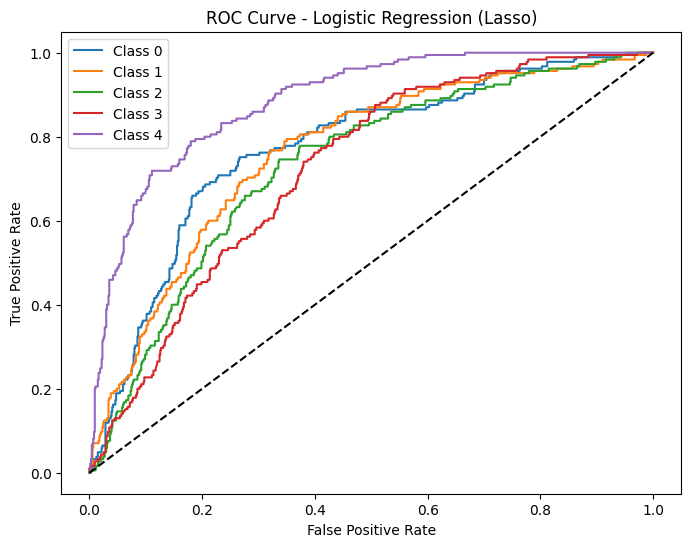

In [96]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')  # 10-Fold CV Accuracy
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_lasso, y_smote_lasso, cv=10)  # Predictions from 10-Fold CV
end_test = time.time()

# Compute performance metrics
print("\nLogistic Regression Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

# Store results
lr_accuracy_lasso = cv_scores.mean()
lr_train_time_lasso = end_train - start_train
lr_test_time_lasso = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (Lasso)")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression (Lasso)")
plt.legend()
plt.show()


# 6.2 Random Forest Classifier


Random Forest Performance:
Average Accuracy: 0.6779
Training Time: 2.2650 sec
Testing Time: 2.2269 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       185
           1       0.58      0.50      0.54       185
           2       0.52      0.53      0.53       185
           3       0.62      0.62      0.62       185
           4       0.81      0.85      0.83       185

    accuracy                           0.68       925
   macro avg       0.67      0.68      0.67       925
weighted avg       0.67      0.68      0.67       925



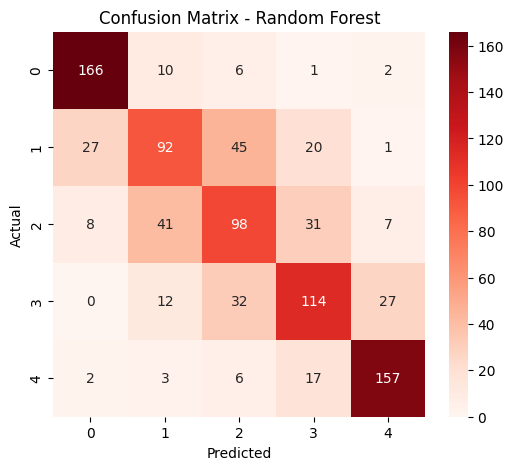

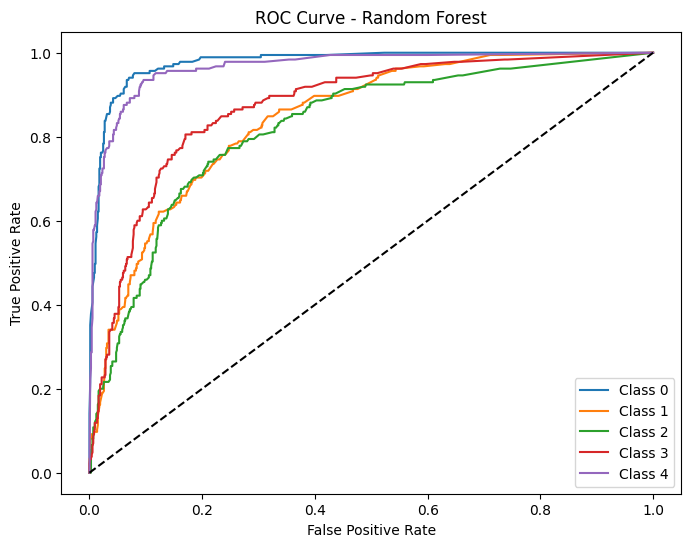

In [97]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()

# Performance metrics
print("\nRandom Forest Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

rf_accuracy_lasso = cv_scores.mean()
rf_train_time_lasso = end_train - start_train
rf_test_time_lasso = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 6.3 Gradient Boosting


Gradient Boosting Performance:
Average Accuracy: 0.6356
Training Time: 8.0827 sec
Testing Time: 8.0789 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.81      0.80       185
           1       0.55      0.42      0.48       185
           2       0.50      0.56      0.53       185
           3       0.56      0.58      0.57       185
           4       0.76      0.82      0.78       185

    accuracy                           0.64       925
   macro avg       0.63      0.64      0.63       925
weighted avg       0.63      0.64      0.63       925



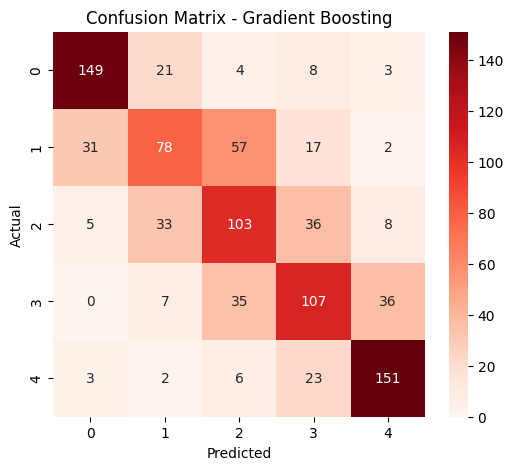

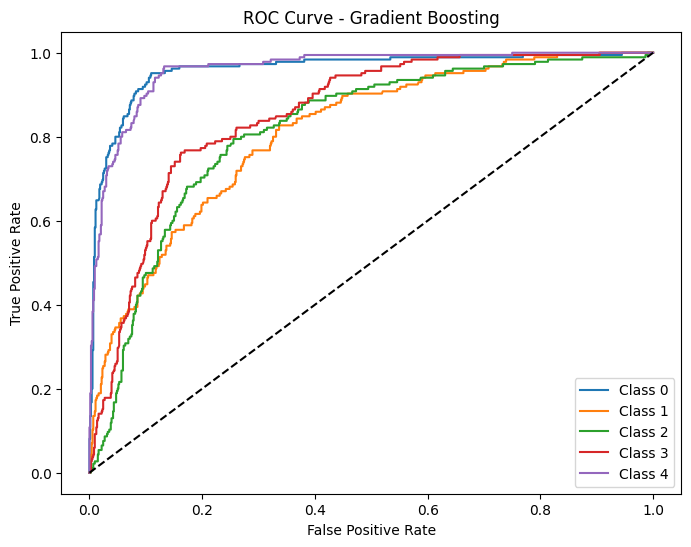

In [98]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=42)

start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()

print("\nGradient Boosting Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

gb_accuracy_lasso = cv_scores.mean()
gb_train_time_lasso = end_train - start_train
gb_test_time_lasso = end_test - start_test

conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

y_prob = cross_val_predict(gb, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()


# 6.4 SVM


SVM Performance:
Average Accuracy: 0.6108
Training Time: 1.8611 sec
Testing Time: 1.8475 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       185
           1       0.53      0.46      0.49       185
           2       0.50      0.55      0.52       185
           3       0.52      0.49      0.50       185
           4       0.73      0.81      0.77       185

    accuracy                           0.61       925
   macro avg       0.61      0.61      0.61       925
weighted avg       0.61      0.61      0.61       925



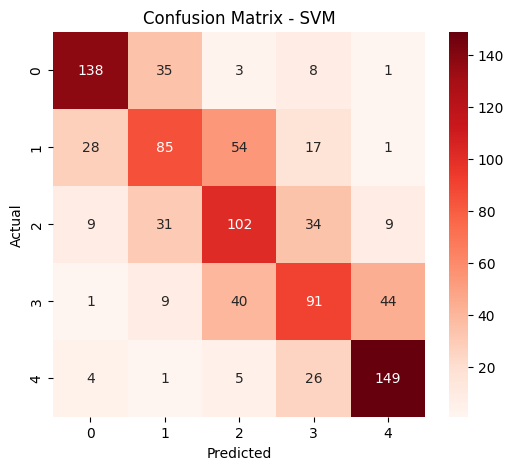

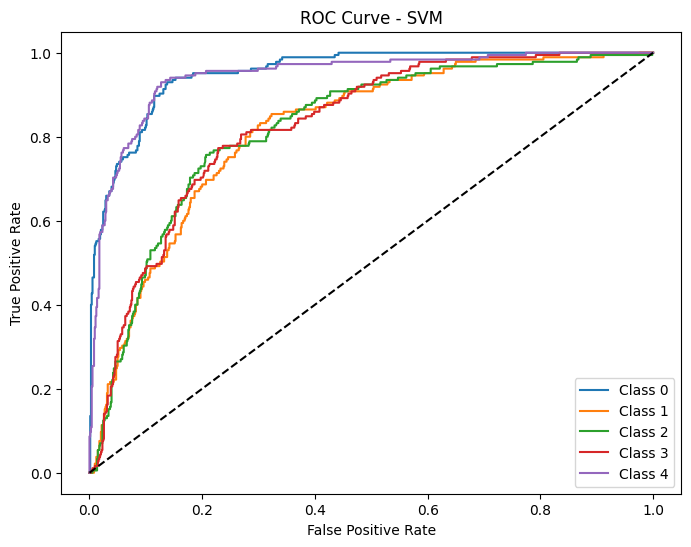

In [99]:
from sklearn.svm import SVC

svm = SVC(probability=True, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(svm, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(svm, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()

print("\nSVM Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

svm_accuracy_lasso = cv_scores.mean()
svm_train_time_lasso = end_train - start_train
svm_test_time_lasso = end_test - start_test

conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

y_prob = cross_val_predict(svm, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()


# 6.5 KNN


KNN Performance:
Average Accuracy: 0.6195
Training Time: 0.1354 sec
Testing Time: 0.1465 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.88      0.77       185
           1       0.49      0.45      0.47       185
           2       0.49      0.43      0.46       185
           3       0.59      0.54      0.56       185
           4       0.78      0.79      0.79       185

    accuracy                           0.62       925
   macro avg       0.61      0.62      0.61       925
weighted avg       0.61      0.62      0.61       925



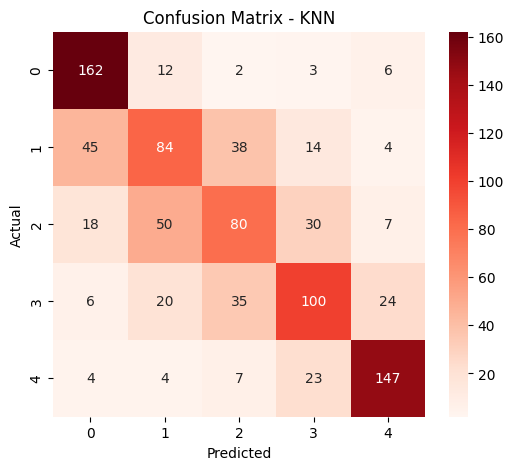

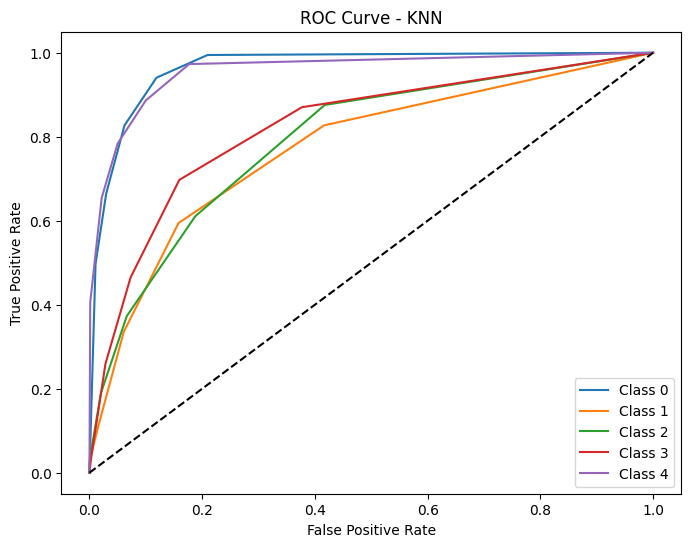

In [100]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()

start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()
start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()


print("\nKNN Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

knn_accuracy_lasso = cv_scores.mean()
knn_train_time_lasso = end_train - start_train
knn_test_time_lasso = end_test - start_test

conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

y_prob = cross_val_predict(knn, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()


# 6.6 XGBoost Classifier


XGBoost Classifier Performance:
Average Accuracy: 0.6596
Training Time: 2.3171 sec
Testing Time: 2.2966 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.86      0.83       185
           1       0.56      0.50      0.53       185
           2       0.51      0.52      0.52       185
           3       0.60      0.58      0.59       185
           4       0.80      0.83      0.81       185

    accuracy                           0.66       925
   macro avg       0.65      0.66      0.66       925
weighted avg       0.65      0.66      0.66       925



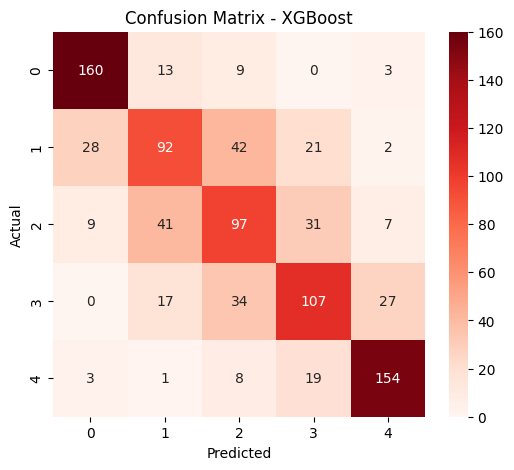

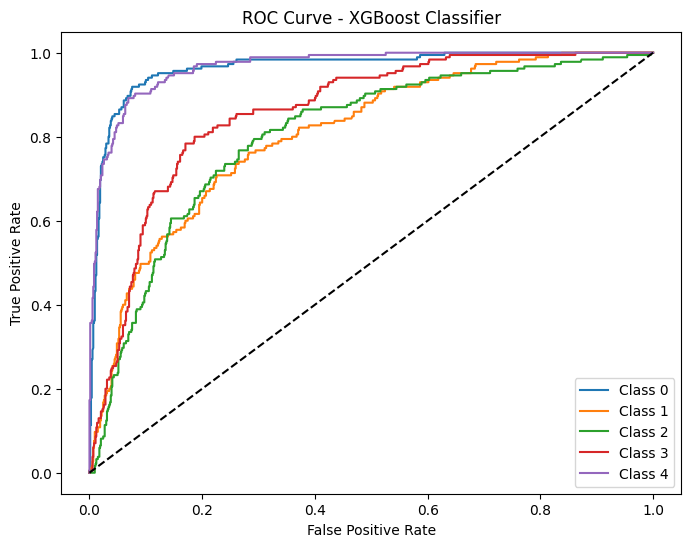

In [101]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize XGBoost
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(xgb_model, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(xgb_model, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()

# Performance metrics
print("\nXGBoost Classifier Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

xgb_accuracy_lasso = cv_scores.mean()
xgb_train_time_lasso = end_train - start_train
xgb_test_time_lasso = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# ROC Curve
y_prob = cross_val_predict(xgb_model, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost Classifier")
plt.legend()
plt.show()


# 6.7 MLP


MLP Classifier Performance:
Average Accuracy: 0.6098
Training Time: 20.9805 sec
Testing Time: 20.2953 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.81      0.77       185
           1       0.57      0.44      0.50       185
           2       0.50      0.56      0.53       185
           3       0.51      0.45      0.48       185
           4       0.71      0.79      0.74       185

    accuracy                           0.61       925
   macro avg       0.60      0.61      0.60       925
weighted avg       0.60      0.61      0.60       925



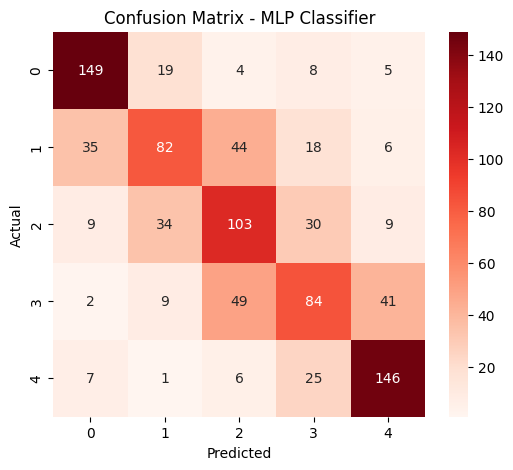

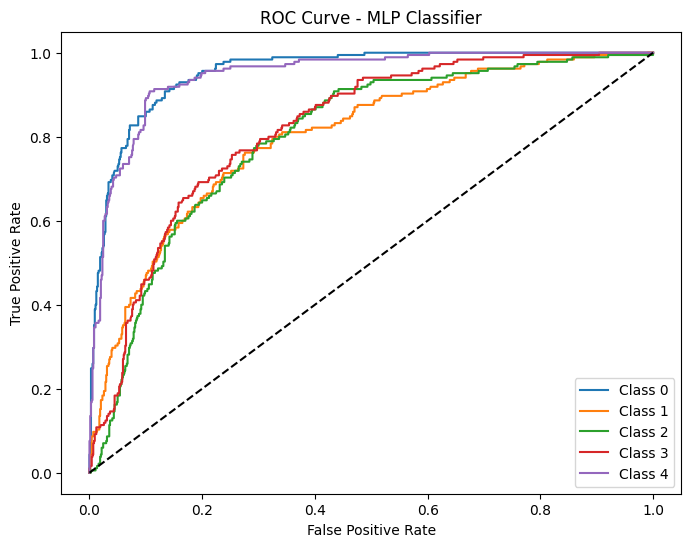

In [102]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP Classifier
mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(mlp_model, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(mlp_model, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()

# Performance metrics
print("\nMLP Classifier Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

mlp_accuracy_lasso = cv_scores.mean()
mlp_train_time_lasso = end_train - start_train
mlp_test_time_lasso = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier")
plt.show()

# ROC Curve
y_prob = cross_val_predict(mlp_model, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier")
plt.legend()
plt.show()


# 6.8 CatBoost Classifier


CatBoost Classifier Performance:
Average Accuracy: 0.6671
Training Time: 11.7463 sec
Testing Time: 11.9639 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.86      0.84       185
           1       0.55      0.51      0.53       185
           2       0.53      0.52      0.53       185
           3       0.59      0.59      0.59       185
           4       0.83      0.85      0.84       185

    accuracy                           0.67       925
   macro avg       0.66      0.67      0.67       925
weighted avg       0.66      0.67      0.67       925



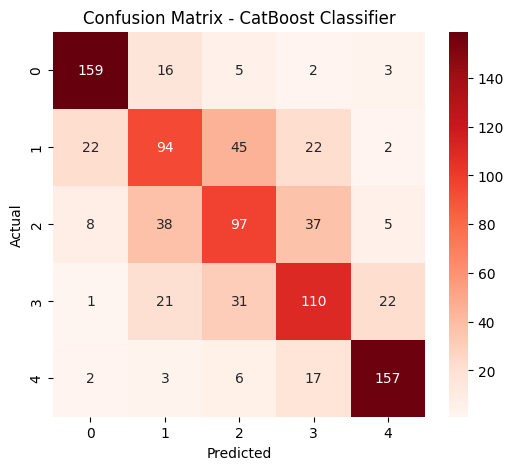

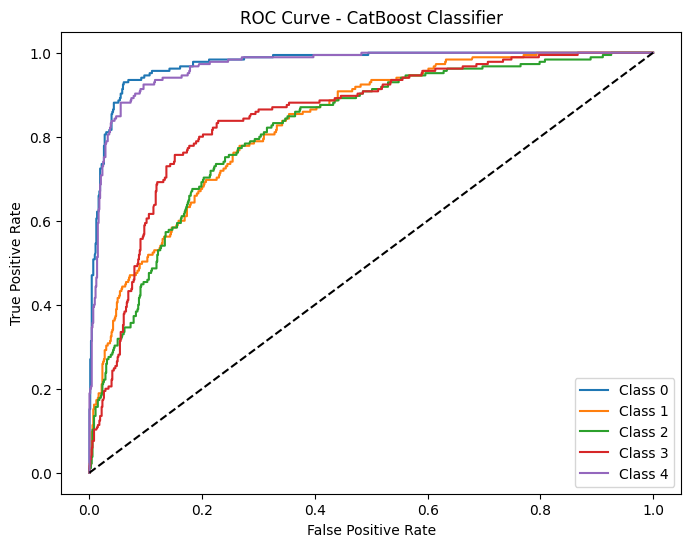

In [103]:
from catboost import CatBoostClassifier

# Initialize CatBoost
catboost_model = CatBoostClassifier(verbose=0, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(catboost_model, X_smote_lasso, y_smote_lasso, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(catboost_model, X_smote_lasso, y_smote_lasso, cv=10)
end_test = time.time()

# Performance metrics
print("\nCatBoost Classifier Performance:")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_lasso, y_pred))

catboost_accuracy_lasso = cv_scores.mean()
catboost_train_time_lasso = end_train - start_train
catboost_test_time_lasso = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_lasso, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=np.unique(y_smote_lasso), yticklabels=np.unique(y_smote_lasso))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost Classifier")
plt.show()

# ROC Curve
y_prob = cross_val_predict(catboost_model, X_smote_lasso, y_smote_lasso, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_lasso))):
    fpr, tpr, _ = roc_curve(y_smote_lasso == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost Classifier")
plt.legend()
plt.show()


# comparison for Lasso Regression Feature Selection

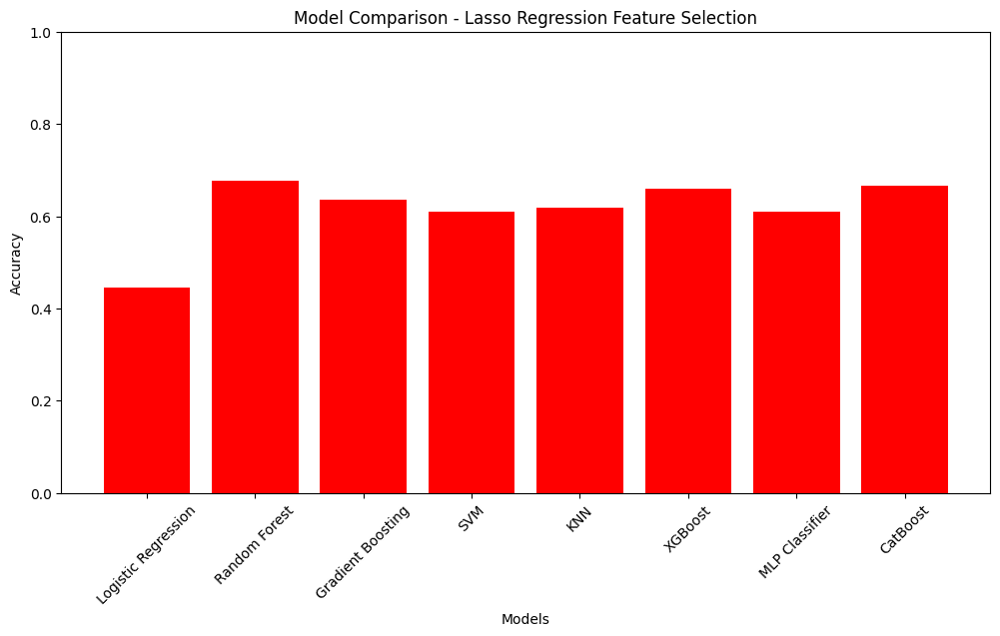

                 Model  Accuracy  Training Time (s)  Testing Time (s)
0  Logistic Regression  0.445489           0.515562          0.512175
1        Random Forest  0.677910           2.265016          2.226910
2    Gradient Boosting  0.635647           8.082693          8.078936
3                  SVM  0.610764           1.861066          1.847489
4                  KNN  0.619518           0.135381          0.146539
5              XGBoost  0.659572           2.317140          2.296551
6       MLP Classifier  0.609841          20.980496         20.295310
7             CatBoost  0.667111          11.746254         11.963899


In [104]:
# Store results for Lasso Regression Feature Selection
lasso_results = {
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM", "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy_lasso, rf_accuracy_lasso, gb_accuracy_lasso, svm_accuracy_lasso, knn_accuracy_lasso, xgb_accuracy_lasso, mlp_accuracy_lasso, catboost_accuracy_lasso],
    "Training Time (s)": [lr_train_time_lasso, rf_train_time_lasso, gb_train_time_lasso, svm_train_time_lasso, knn_train_time_lasso, xgb_train_time_lasso, mlp_train_time_lasso, catboost_train_time_lasso],
    "Testing Time (s)": [lr_test_time_lasso, rf_test_time_lasso, gb_test_time_lasso, svm_test_time_lasso, knn_test_time_lasso, xgb_test_time_lasso, mlp_test_time_lasso, catboost_test_time_lasso]
}

import pandas as pd
import matplotlib.pyplot as plt

df_lasso = pd.DataFrame(lasso_results)

# Plot Accuracy Comparison
plt.figure(figsize=(12, 6))
plt.bar(df_lasso["Model"], df_lasso["Accuracy"], color="red")
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Model Comparison - Lasso Regression Feature Selection")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

# Display comparison table
print(df_lasso)


# Union, Intersection, Most Frequent features set

In [105]:
# Top 10 features from each method
rf_features = [
    "GPA of last semester", "Primary academic goal", "Self-study per week", "Current living situation",
    "Motivation", "Extracurricular activities", "Caffeine consumtion", "Interaction with teachers",
    "Social media usage", "Library Usage"
]

chi2_features = [
    "GPA of last semester", "Financial aid", "Motivation", "Parents support", "Primary academic goal",
    "Homework on time", "Gender", "Contribution on family", "Class attendance", "Relationship with parents"
]

gb_features = [
    "GPA of last semester", "Library Usage", "Interaction with teachers", "Motivation", "Social media usage",
    "Self-study per week", "Current living situation", "Employment", "Financial aid", "Primary academic goal"
]

mi_features = [
    "GPA of last semester", "Motivation", "Class attendance", "Self-study per week", "Internet access",
    "Financial difficulties", "Primary academic goal", "Contribution on family", "Health condition",
    "Caffeine consumtion"
]

anova_features = [
    "GPA of last semester", "Class attendance", "Motivation", "Primary academic goal", "Peers support",
    "Financial aid", "Homework on time", "Self-study per week", "Relationship with parents", "Parents support"
]

lasso_features = [
    "GPA of last semester", "Class attendance", "Marital Status", "Financial aid", "Motivation",
    "Gender", "Primary academic goal", "Own expenses", "Contribution on family", "Homework on time"
]

# --- Union ---
union_features = list(set(rf_features + chi2_features + gb_features + mi_features + anova_features + lasso_features))
print(f"Total Unique Features in Union: {len(union_features)}")
print("Union Features:")
print(union_features)

# --- Intersection ---
intersection_features = list(
    set(rf_features) & set(chi2_features) & set(gb_features) & set(mi_features) & set(anova_features) & set(lasso_features)
)
print(f"\nTotal Features in Intersection: {len(intersection_features)}")
print("Intersection Features:")
print(intersection_features)

# --- Most Frequent Features (Appeared in ≥4 methods) ---
from collections import Counter

all_features = rf_features + chi2_features + gb_features + mi_features + anova_features + lasso_features
feature_counts = Counter(all_features)

frequent_features = [feature for feature, count in feature_counts.items() if count >= 4]

print(f"\nMost Frequent Features (Appeared in ≥4 methods): {len(frequent_features)}")
print("Frequent Features:")
print(frequent_features)


Total Unique Features in Union: 24
Union Features:
['Class attendance', 'Self-study per week', 'Parents support', 'Interaction with teachers', 'Current living situation', 'Relationship with parents', 'Caffeine consumtion', 'Extracurricular activities', 'Financial aid', 'Financial difficulties', 'Employment', 'Social media usage', 'Gender', 'Contribution on family', 'Peers support', 'Primary academic goal', 'Health condition', 'Internet access', 'Homework on time', 'Own expenses', 'Marital Status', 'GPA of last semester', 'Motivation', 'Library Usage']

Total Features in Intersection: 3
Intersection Features:
['Motivation', 'Primary academic goal', 'GPA of last semester']

Most Frequent Features (Appeared in ≥4 methods): 6
Frequent Features:
['GPA of last semester', 'Primary academic goal', 'Self-study per week', 'Motivation', 'Financial aid', 'Class attendance']


# 7. Union

# Apply SMOTE to Union Feature Set

In [106]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Subset the data using Union Features
X_union = X[union_features]

# Apply SMOTE
smote = SMOTE(random_state=42)
X_smote_union, y_smote_union = smote.fit_resample(X_union, y)

print("Shape of X_smote_union:", X_smote_union.shape)
print("Shape of y_smote_union:", y_smote_union.shape)
print("After Balancing:", Counter(y_smote_union))


Shape of X_smote_union: (925, 24)
Shape of y_smote_union: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 7.1 Logistic Regression


Logistic Regression Performance (Union Feature Set):
Average Accuracy: 0.4996
Training Time: 0.9473 sec
Testing Time: 0.9381 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.65      0.63       185
           1       0.47      0.48      0.47       185
           2       0.36      0.32      0.34       185
           3       0.38      0.30      0.33       185
           4       0.61      0.75      0.67       185

    accuracy                           0.50       925
   macro avg       0.48      0.50      0.49       925
weighted avg       0.48      0.50      0.49       925



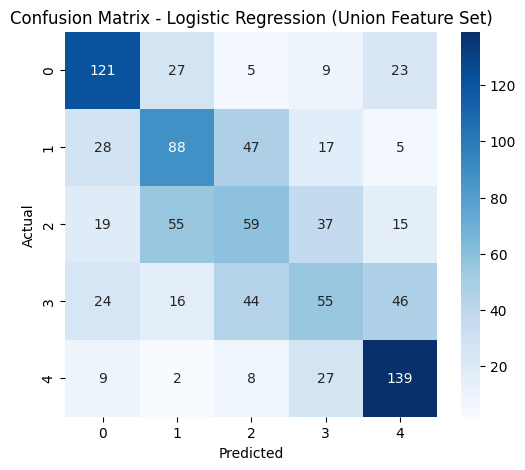

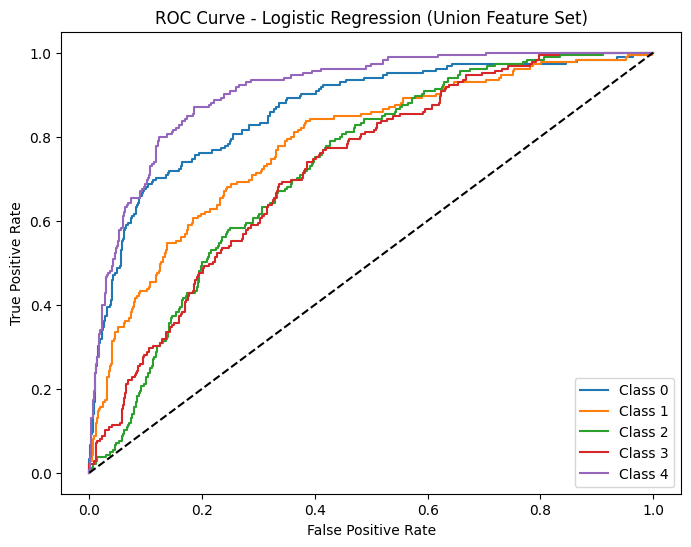

In [107]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

# Compute performance metrics
print("\nLogistic Regression Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

lr_accuracy_union = cv_scores.mean()
lr_train_time_union = end_train - start_train
lr_test_time_union = end_test - start_test

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (Union Feature Set)")
plt.show()

# Plot ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_union, y_smote_union, cv=10, method="predict_proba")

plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression (Union Feature Set)")
plt.legend()
plt.show()


# 7.2 Random Forest Classifier


Random Forest Performance (Union Feature Set):
Average Accuracy: 0.6953
Training Time: 2.4553 sec
Testing Time: 2.4484 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.90      0.88       185
           1       0.60      0.54      0.57       185
           2       0.54      0.52      0.53       185
           3       0.66      0.63      0.65       185
           4       0.79      0.88      0.83       185

    accuracy                           0.70       925
   macro avg       0.69      0.70      0.69       925
weighted avg       0.69      0.70      0.69       925



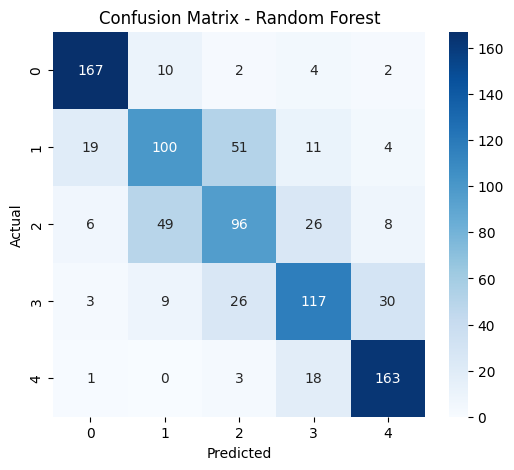

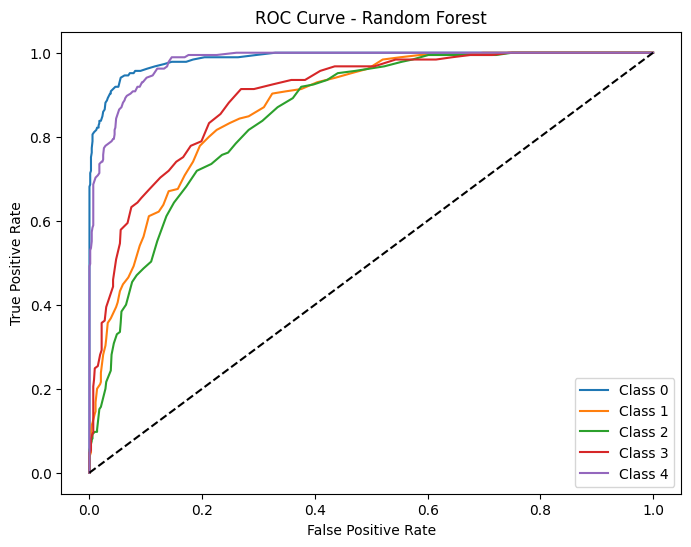

In [108]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import time
import numpy as np

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Training Time
start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

# Testing Time
start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

print("\nRandom Forest Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

rf_accuracy_union = cv_scores.mean()
rf_train_time_union = end_train - start_train
rf_test_time_union = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend()
plt.show()


# 7.3 Gradient Boosting Classifier


Gradient Boosting Performance (Union Feature Set):
Average Accuracy: 0.6575
Training Time: 11.7553 sec
Testing Time: 11.6561 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.84      0.85       185
           1       0.61      0.51      0.56       185
           2       0.50      0.53      0.51       185
           3       0.55      0.56      0.56       185
           4       0.76      0.84      0.80       185

    accuracy                           0.66       925
   macro avg       0.66      0.66      0.66       925
weighted avg       0.66      0.66      0.66       925



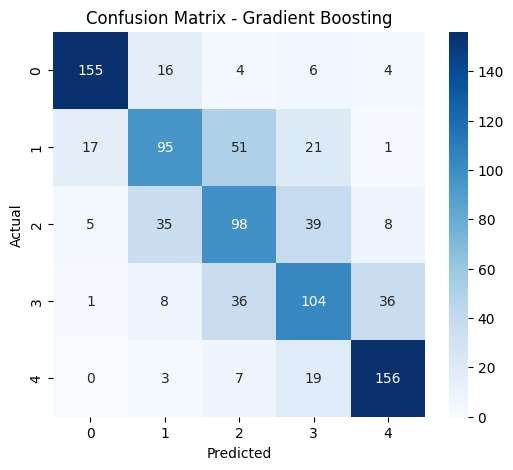

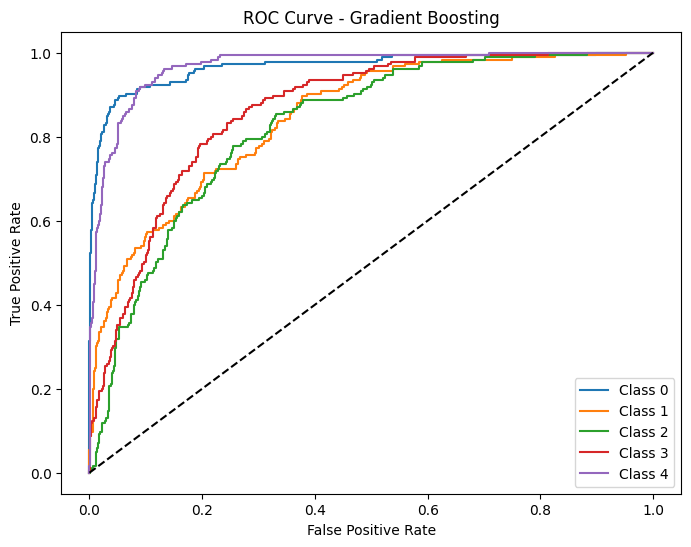

In [109]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=42)

start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

print("\nGradient Boosting Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

gb_accuracy_union = cv_scores.mean()
gb_train_time_union = end_train - start_train
gb_test_time_union = end_test - start_test

conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

y_prob = cross_val_predict(gb, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting")
plt.legend()
plt.show()


# 7.4 SVM


SVM Performance (Union Feature Set):
Average Accuracy: 0.6325
Training Time: 2.3844 sec
Testing Time: 2.4226 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.81      0.82       185
           1       0.53      0.54      0.53       185
           2       0.45      0.44      0.44       185
           3       0.59      0.54      0.56       185
           4       0.75      0.84      0.79       185

    accuracy                           0.63       925
   macro avg       0.63      0.63      0.63       925
weighted avg       0.63      0.63      0.63       925



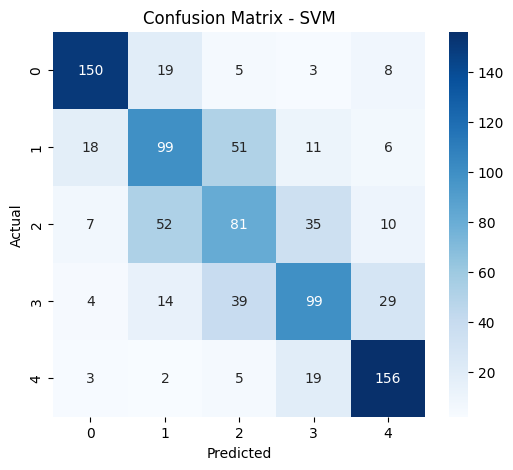

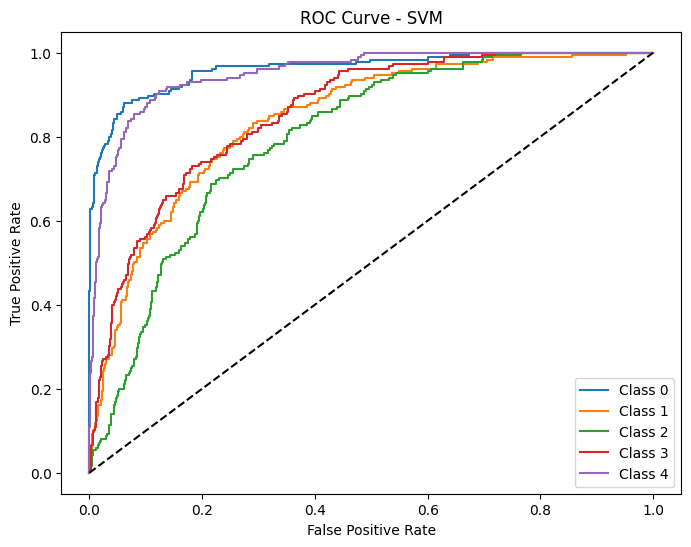

In [110]:
from sklearn.svm import SVC

svm = SVC(probability=True, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(svm, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(svm, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

print("\nSVM Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

svm_accuracy_union = cv_scores.mean()
svm_train_time_union = end_train - start_train
svm_test_time_union = end_test - start_test

conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM")
plt.show()

y_prob = cross_val_predict(svm, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM")
plt.legend()
plt.show()


# 7.5 KNN


KNN Performance (Union Feature Set):
Average Accuracy: 0.6078
Training Time: 0.1462 sec
Testing Time: 0.1362 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.94      0.77       185
           1       0.52      0.41      0.46       185
           2       0.45      0.38      0.41       185
           3       0.63      0.44      0.52       185
           4       0.69      0.88      0.77       185

    accuracy                           0.61       925
   macro avg       0.59      0.61      0.59       925
weighted avg       0.59      0.61      0.59       925



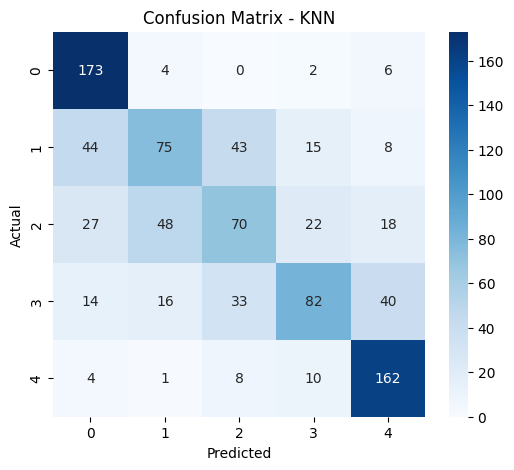

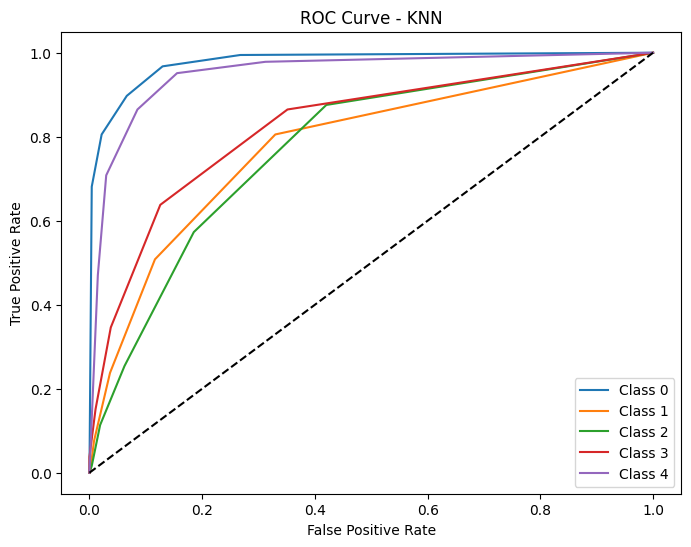

In [111]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize KNN
knn = KNeighborsClassifier(n_neighbors=5)

# Training time
start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

# Performance metrics
print("\nKNN Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

knn_accuracy_union = cv_scores.mean()
knn_train_time_union = end_train - start_train
knn_test_time_union = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN")
plt.show()

# ROC Curve
y_prob = cross_val_predict(knn, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN")
plt.legend()
plt.show()


# 7.6 XGBoost


XGBoost Performance (Union Feature Set):
Average Accuracy: 0.6867
Training Time: 2.6708 sec
Testing Time: 2.5149 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       185
           1       0.62      0.51      0.56       185
           2       0.51      0.56      0.53       185
           3       0.62      0.61      0.61       185
           4       0.79      0.89      0.84       185

    accuracy                           0.69       925
   macro avg       0.68      0.69      0.68       925
weighted avg       0.68      0.69      0.68       925



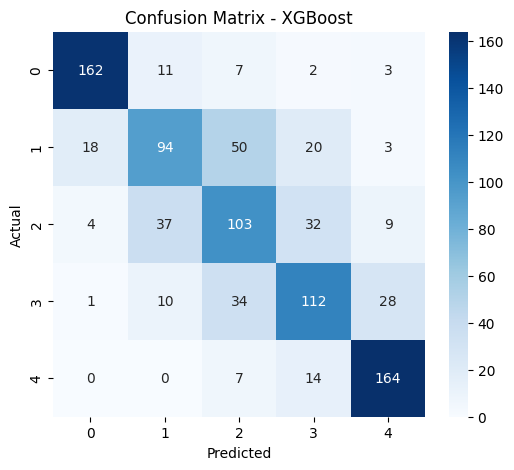

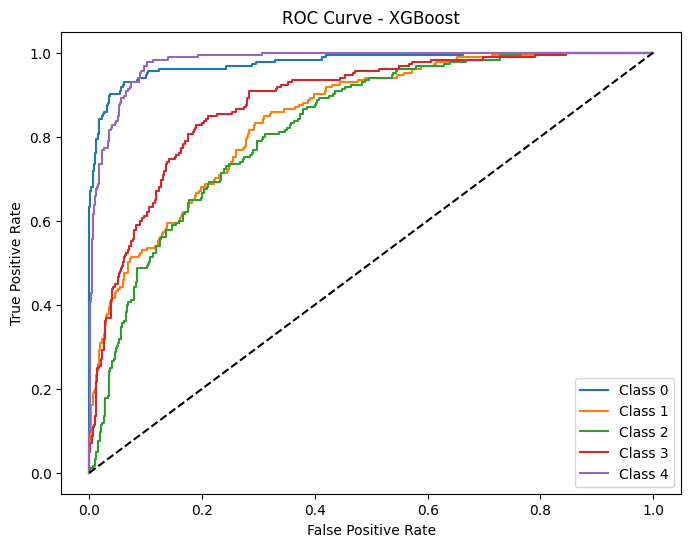

In [112]:
from xgboost import XGBClassifier

# Initialize XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(xgb, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(xgb, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

# Performance metrics
print("\nXGBoost Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

xgb_accuracy_union = cv_scores.mean()
xgb_train_time_union = end_train - start_train
xgb_test_time_union = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

# ROC Curve
y_prob = cross_val_predict(xgb, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost")
plt.legend()
plt.show()


# 7.7 MLP


MLP Classifier Performance (Union Feature Set):
Average Accuracy: 0.6359
Training Time: 14.3000 sec
Testing Time: 13.3492 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.86      0.85       185
           1       0.58      0.53      0.55       185
           2       0.44      0.45      0.45       185
           3       0.57      0.54      0.55       185
           4       0.75      0.79      0.77       185

    accuracy                           0.64       925
   macro avg       0.63      0.64      0.63       925
weighted avg       0.63      0.64      0.63       925



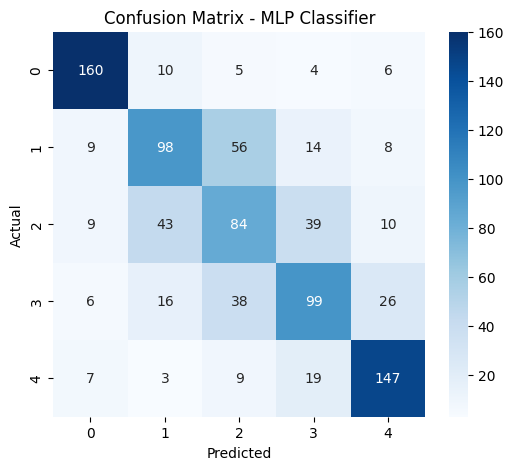

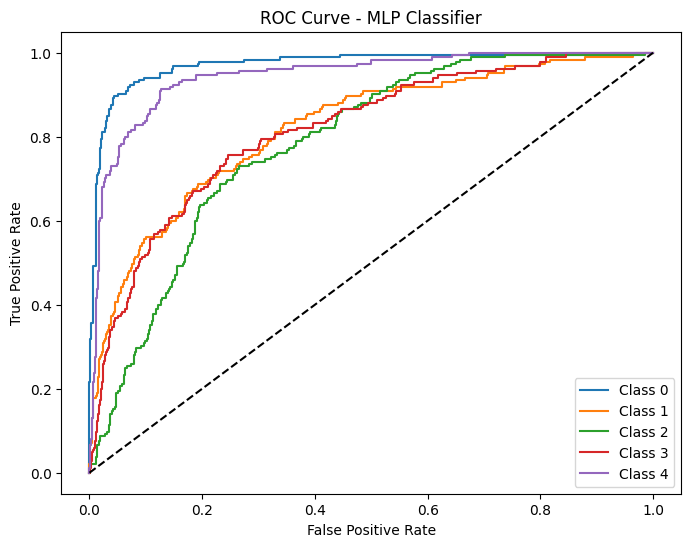

In [113]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(mlp, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(mlp, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

# Performance metrics
print("\nMLP Classifier Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

mlp_accuracy_union = cv_scores.mean()
mlp_train_time_union = end_train - start_train
mlp_test_time_union = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier")
plt.show()

# ROC Curve
y_prob = cross_val_predict(mlp, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier")
plt.legend()
plt.show()


# 7.8 CatBoost


CatBoost Performance (Union Feature Set):
Average Accuracy: 0.6964
Training Time: 15.1126 sec
Testing Time: 15.3996 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       185
           1       0.61      0.54      0.57       185
           2       0.53      0.54      0.53       185
           3       0.65      0.65      0.65       185
           4       0.79      0.86      0.82       185

    accuracy                           0.70       925
   macro avg       0.69      0.70      0.69       925
weighted avg       0.69      0.70      0.69       925



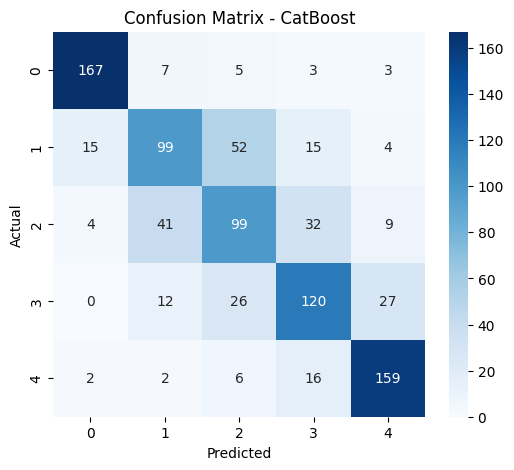

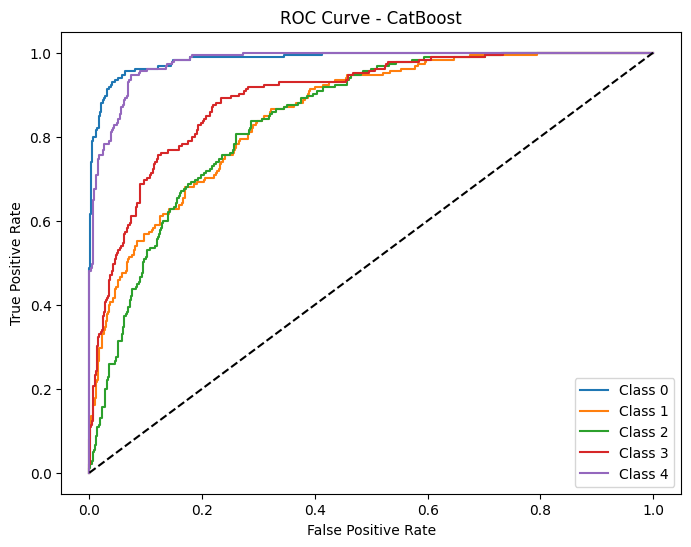

In [114]:
from catboost import CatBoostClassifier

# Initialize CatBoost
catboost = CatBoostClassifier(verbose=0, random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(catboost, X_smote_union, y_smote_union, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(catboost, X_smote_union, y_smote_union, cv=10)
end_test = time.time()

# Performance metrics
print("\nCatBoost Performance (Union Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_union, y_pred))

catboost_accuracy_union = cv_scores.mean()
catboost_train_time_union = end_train - start_train
catboost_test_time_union = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_union, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_smote_union), yticklabels=np.unique(y_smote_union))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost")
plt.show()

# ROC Curve
y_prob = cross_val_predict(catboost, X_smote_union, y_smote_union, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_union))):
    fpr, tpr, _ = roc_curve(y_smote_union == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost")
plt.legend()
plt.show()


# Model Accuracy Comparison Union Feature Set

Model Comparison - Union Feature Set:

                 Model  Accuracy  Training Time (sec)  Testing Time (sec)
0  Logistic Regression  0.499568             0.947288            0.938100
1        Random Forest  0.695290             2.455307            2.448412
2    Gradient Boosting  0.657515            11.755254           11.656074
3                  SVM  0.632457             2.384390            2.422596
4                  KNN  0.607784             0.146199            0.136195
5              XGBoost  0.686734             2.670759            2.514896
6       MLP Classifier  0.635881            14.299963           13.349203
7             CatBoost  0.696377            15.112631           15.399616


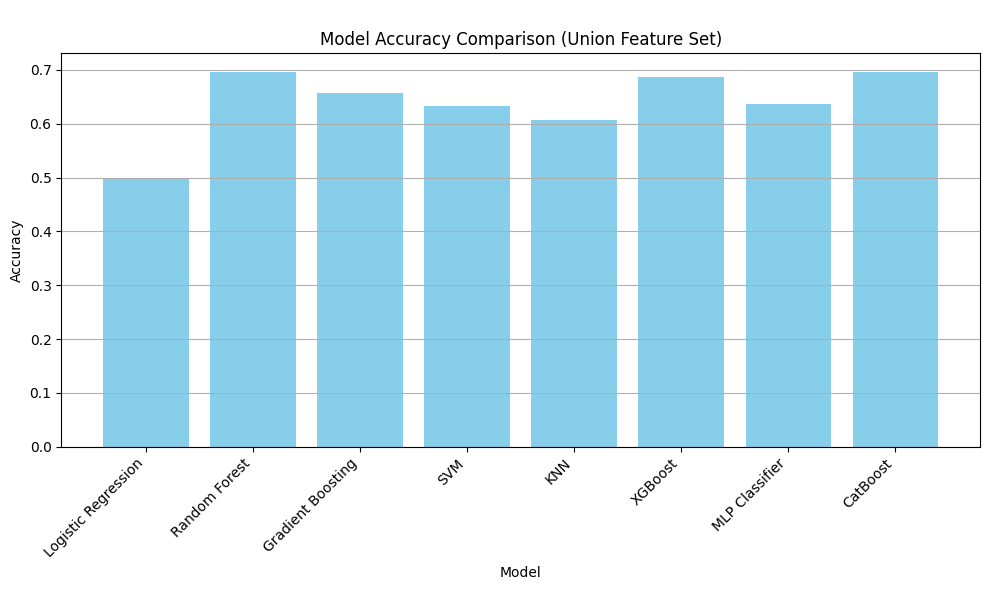

In [115]:
import pandas as pd
import matplotlib.pyplot as plt

# Create DataFrame
results_union = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'Gradient Boosting', 'SVM', 
              'KNN', 'XGBoost', 'MLP Classifier', 'CatBoost'],
    'Accuracy': [lr_accuracy_union, rf_accuracy_union, gb_accuracy_union, svm_accuracy_union, 
                 knn_accuracy_union, xgb_accuracy_union, mlp_accuracy_union, catboost_accuracy_union],
    'Training Time (sec)': [lr_train_time_union, rf_train_time_union, gb_train_time_union, svm_train_time_union, 
                            knn_train_time_union, xgb_train_time_union, mlp_train_time_union, catboost_train_time_union],
    'Testing Time (sec)': [lr_test_time_union, rf_test_time_union, gb_test_time_union, svm_test_time_union, 
                           knn_test_time_union, xgb_test_time_union, mlp_test_time_union, catboost_test_time_union]
})

# Display comparison table
print("Model Comparison - Union Feature Set:\n")
print(results_union)

# Plot Accuracy
plt.figure(figsize=(10, 6))
plt.bar(results_union['Model'], results_union['Accuracy'], color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('\nModel Accuracy Comparison (Union Feature Set)')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


# 8. Intersection

# SMOTE for Intersection Feature Set

In [116]:
from imblearn.over_sampling import SMOTE

# Filter intersection features
X_intersection = X[intersection_features]

# Apply SMOTE
smote = SMOTE(random_state=42)
X_smote_intersection, y_smote_intersection = smote.fit_resample(X_intersection, y)

# Display shapes and class distribution
print("Shape of X_smote_intersection:", X_smote_intersection.shape)
print("Shape of y_smote_intersection:", y_smote_intersection.shape)
print("After Balancing:", Counter(y_smote_intersection))


Shape of X_smote_intersection: (925, 3)
Shape of y_smote_intersection: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 8.1 Logistic Regression


Logistic Regression Performance (Intersection Feature Set):
Average Accuracy: 0.4086
Training Time: 0.2009 sec
Testing Time: 0.2057 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.21      0.22      0.21       185
           1       0.41      0.62      0.49       185
           2       0.46      0.21      0.28       185
           3       0.45      0.28      0.35       185
           4       0.53      0.71      0.61       185

    accuracy                           0.41       925
   macro avg       0.41      0.41      0.39       925
weighted avg       0.41      0.41      0.39       925



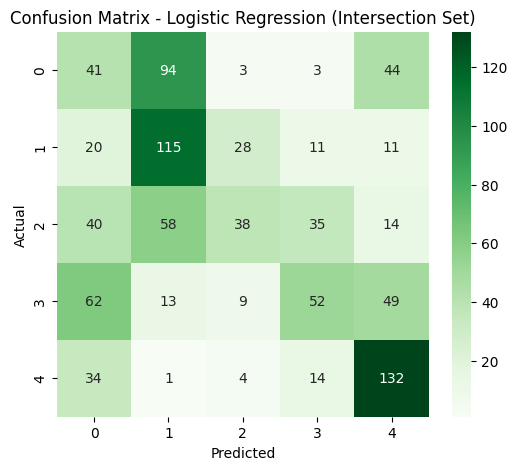

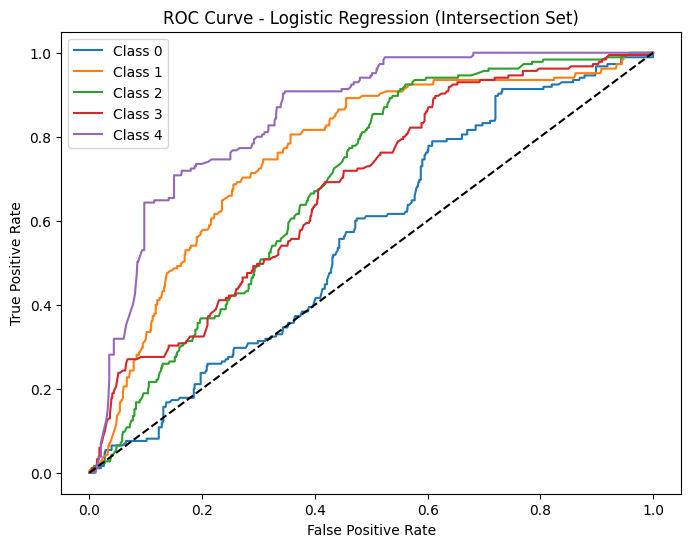

In [117]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import time

# Logistic Regression - Intersection Set
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

# Metrics
print("\nLogistic Regression Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

lr_accuracy_intersection = cv_scores.mean()
lr_train_time_intersection = end_train - start_train
lr_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression (Intersection Set)")
plt.legend()
plt.show()


# 8.2 Random Forest Classifier


Random Forest Performance (Intersection Feature Set):
Average Accuracy: 0.5923
Training Time: 1.7848 sec
Testing Time: 1.7816 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.79      0.74       185
           1       0.53      0.34      0.41       185
           2       0.46      0.50      0.48       185
           3       0.52      0.48      0.50       185
           4       0.70      0.85      0.77       185

    accuracy                           0.59       925
   macro avg       0.58      0.59      0.58       925
weighted avg       0.58      0.59      0.58       925



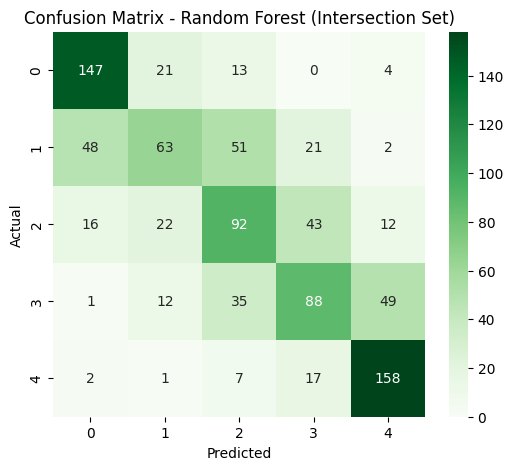

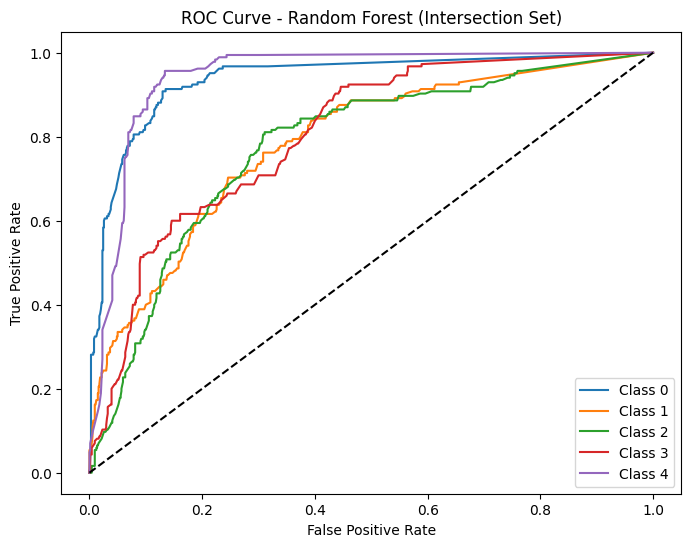

In [118]:
from sklearn.ensemble import RandomForestClassifier

# Random Forest - Intersection Set
rf = RandomForestClassifier(n_estimators=100, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nRandom Forest Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

rf_accuracy_intersection = cv_scores.mean()
rf_train_time_intersection = end_train - start_train
rf_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest (Intersection Set)")
plt.legend()
plt.show()


# 8.3 Gradient Boosting Classifier


Gradient Boosting Performance (Intersection Feature Set):
Average Accuracy: 0.6042
Training Time: 6.6386 sec
Testing Time: 6.6281 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.81      0.75       185
           1       0.60      0.35      0.44       185
           2       0.48      0.54      0.51       185
           3       0.50      0.46      0.48       185
           4       0.70      0.86      0.77       185

    accuracy                           0.60       925
   macro avg       0.60      0.60      0.59       925
weighted avg       0.60      0.60      0.59       925



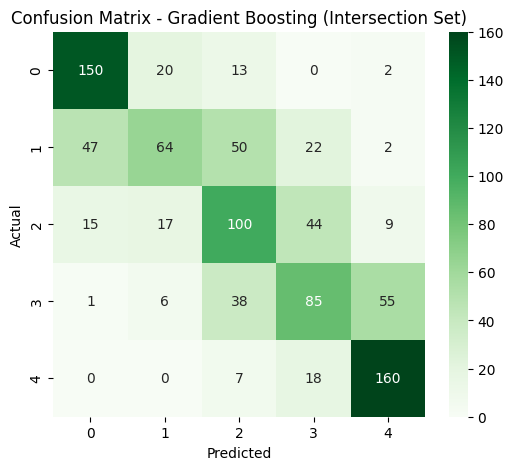

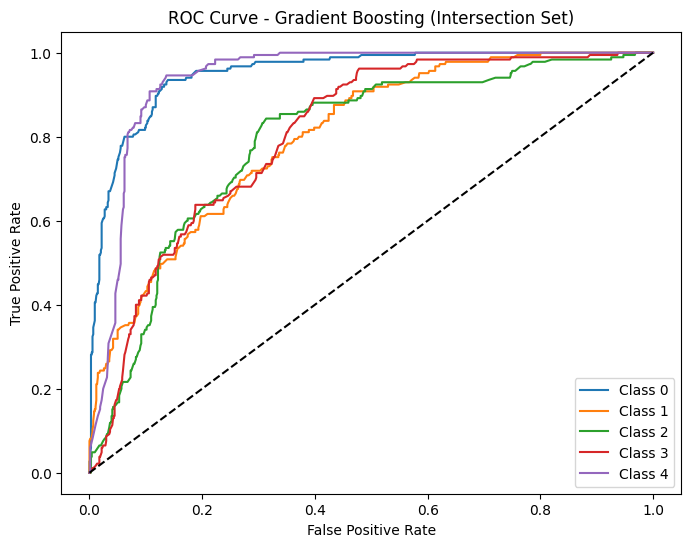

In [119]:
from sklearn.ensemble import GradientBoostingClassifier

# Gradient Boosting - Intersection Set
gb = GradientBoostingClassifier(random_state=42)

start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nGradient Boosting Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

gb_accuracy_intersection = cv_scores.mean()
gb_train_time_intersection = end_train - start_train
gb_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(gb, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting (Intersection Set)")
plt.legend()
plt.show()


# 8.4 SVM


SVM Performance (Intersection Feature Set):
Average Accuracy: 0.5999
Training Time: 1.5084 sec
Testing Time: 1.4886 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.82      0.75       185
           1       0.72      0.24      0.36       185
           2       0.47      0.49      0.48       185
           3       0.48      0.57      0.52       185
           4       0.70      0.88      0.78       185

    accuracy                           0.60       925
   macro avg       0.61      0.60      0.58       925
weighted avg       0.61      0.60      0.58       925



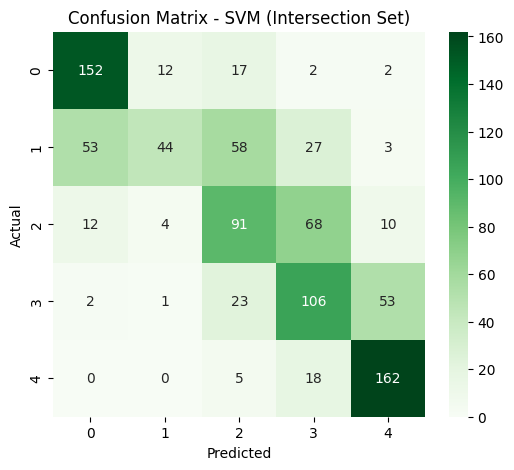

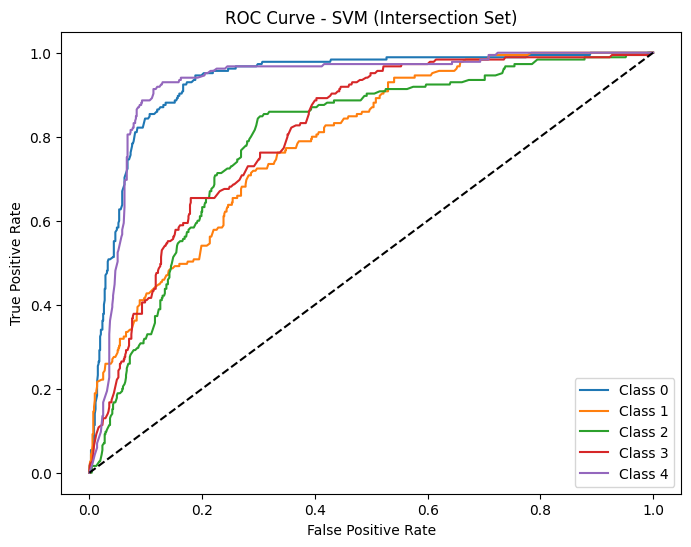

In [120]:
from sklearn.svm import SVC

# SVM - Intersection Set
svm = SVC(probability=True, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(svm, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(svm, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nSVM Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

svm_accuracy_intersection = cv_scores.mean()
svm_train_time_intersection = end_train - start_train
svm_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(svm, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM (Intersection Set)")
plt.legend()
plt.show()


# 8.5 KNN


KNN Performance (Intersection Feature Set):
Average Accuracy: 0.4692
Training Time: 0.1096 sec
Testing Time: 0.0995 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.53      0.62       185
           1       0.45      0.53      0.48       185
           2       0.41      0.48      0.44       185
           3       0.35      0.49      0.41       185
           4       0.63      0.32      0.42       185

    accuracy                           0.47       925
   macro avg       0.51      0.47      0.47       925
weighted avg       0.51      0.47      0.47       925



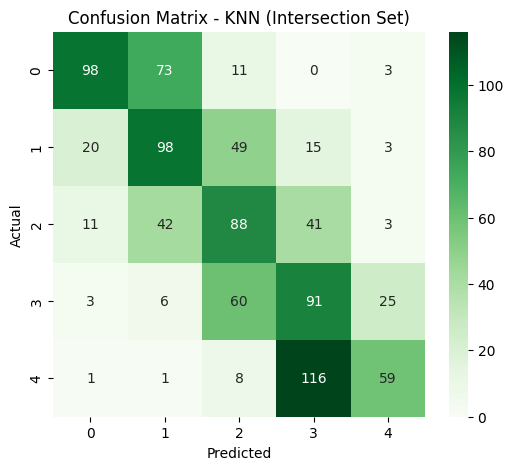

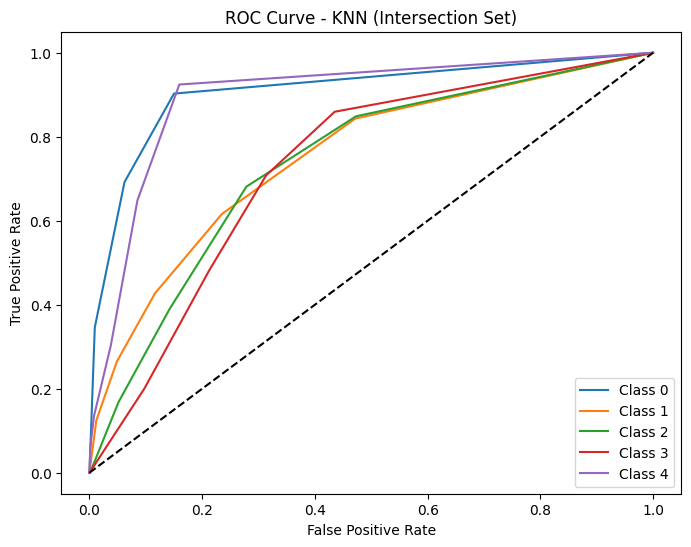

In [121]:
from sklearn.neighbors import KNeighborsClassifier

# KNN - Intersection Set
knn = KNeighborsClassifier(n_neighbors=5)

start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nKNN Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

knn_accuracy_intersection = cv_scores.mean()
knn_train_time_intersection = end_train - start_train
knn_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(knn, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN (Intersection Set)")
plt.legend()
plt.show()


# 8.6 XGBoost Classifier


XGBoost Performance (Intersection Feature Set):
Average Accuracy: 0.5988
Training Time: 4.2188 sec
Testing Time: 2.0416 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.80      0.75       185
           1       0.52      0.36      0.43       185
           2       0.46      0.48      0.47       185
           3       0.52      0.49      0.50       185
           4       0.72      0.87      0.79       185

    accuracy                           0.60       925
   macro avg       0.59      0.60      0.59       925
weighted avg       0.59      0.60      0.59       925



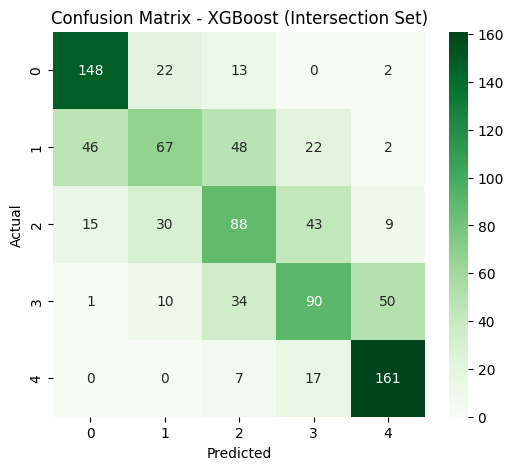

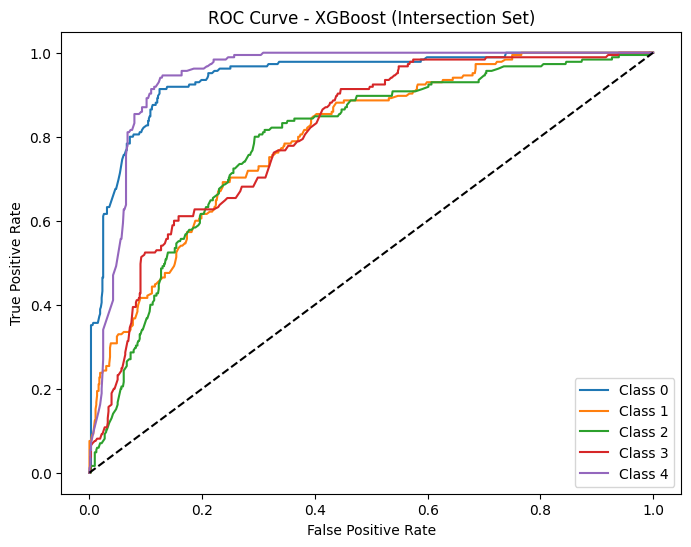

In [122]:
from xgboost import XGBClassifier

# XGBoost - Intersection Set
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

start_train = time.time()
cv_scores = cross_val_score(xgb, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(xgb, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nXGBoost Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

xgb_accuracy_intersection = cv_scores.mean()
xgb_train_time_intersection = end_train - start_train
xgb_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(xgb, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost (Intersection Set)")
plt.legend()
plt.show()


# 8.7 MLP


MLP Classifier Performance (Intersection Feature Set):
Average Accuracy: 0.5869
Training Time: 10.4879 sec
Testing Time: 10.4881 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.79      0.73       185
           1       0.60      0.32      0.42       185
           2       0.47      0.51      0.49       185
           3       0.47      0.49      0.48       185
           4       0.71      0.82      0.76       185

    accuracy                           0.59       925
   macro avg       0.58      0.59      0.58       925
weighted avg       0.58      0.59      0.58       925



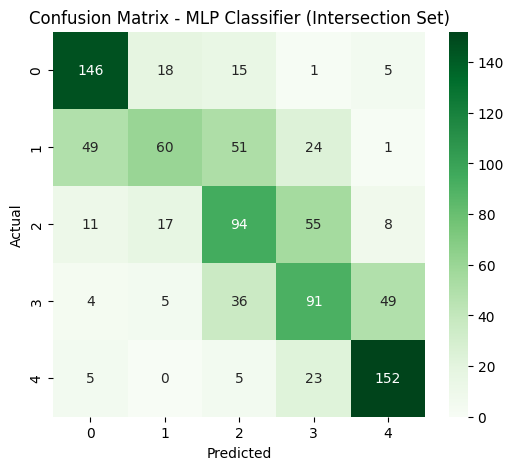

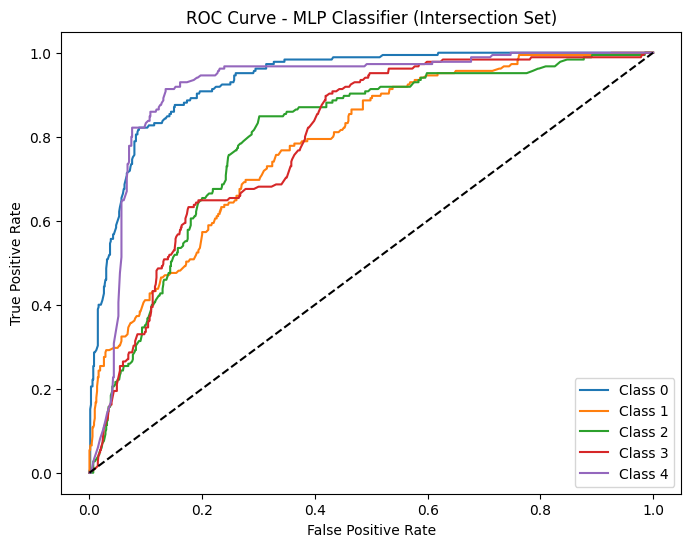

In [123]:
from sklearn.neural_network import MLPClassifier

# MLP Classifier - Intersection Set
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(mlp, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(mlp, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nMLP Classifier Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

mlp_accuracy_intersection = cv_scores.mean()
mlp_train_time_intersection = end_train - start_train
mlp_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(mlp, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier (Intersection Set)")
plt.legend()
plt.show()


# 8.8 CatBoost Classifier


CatBoost Performance (Intersection Feature Set):
Average Accuracy: 0.5988
Training Time: 9.9358 sec
Testing Time: 9.7833 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.79      0.75       185
           1       0.54      0.36      0.43       185
           2       0.46      0.48      0.47       185
           3       0.52      0.51      0.52       185
           4       0.71      0.85      0.78       185

    accuracy                           0.60       925
   macro avg       0.59      0.60      0.59       925
weighted avg       0.59      0.60      0.59       925



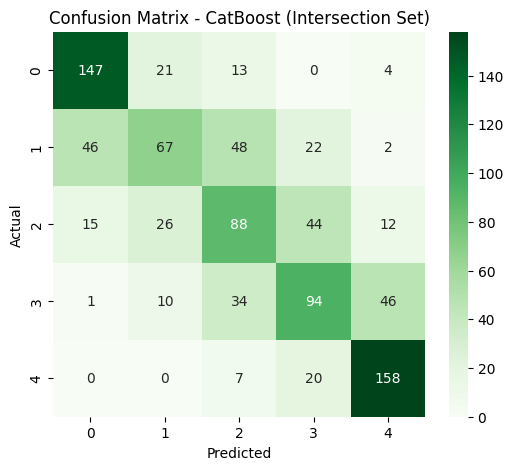

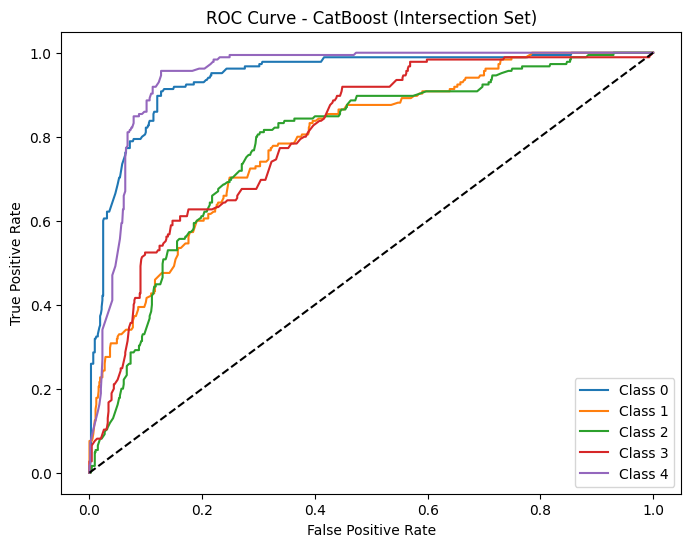

In [124]:
from catboost import CatBoostClassifier

# CatBoost - Intersection Set
cat = CatBoostClassifier(verbose=0, random_state=42)

start_train = time.time()
cv_scores = cross_val_score(cat, X_smote_intersection, y_smote_intersection, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred = cross_val_predict(cat, X_smote_intersection, y_smote_intersection, cv=10)
end_test = time.time()

print("\nCatBoost Performance (Intersection Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_intersection, y_pred))

cat_accuracy_intersection = cv_scores.mean()
cat_train_time_intersection = end_train - start_train
cat_test_time_intersection = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_intersection, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Greens", xticklabels=np.unique(y_smote_intersection), yticklabels=np.unique(y_smote_intersection))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost (Intersection Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(cat, X_smote_intersection, y_smote_intersection, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_intersection))):
    fpr, tpr, _ = roc_curve(y_smote_intersection == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost (Intersection Set)")
plt.legend()
plt.show()


# Model Accuracy Comparison Intersection Feature Set

Model Comparison (Intersection Feature Set):

                 Model  Accuracy  Training Time (sec)  Testing Time (sec)
0  Logistic Regression  0.408614             0.200933            0.205702
1        Random Forest  0.592345             1.784768            1.781579
2    Gradient Boosting  0.604243             6.638625            6.628064
3                  SVM  0.599883             1.508446            1.488641
4                  KNN  0.469215             0.109587            0.099550
5              XGBoost  0.598831             4.218780            2.041565
6       MLP Classifier  0.586921            10.487911           10.488121
7             CatBoost  0.598784             9.935764            9.783274


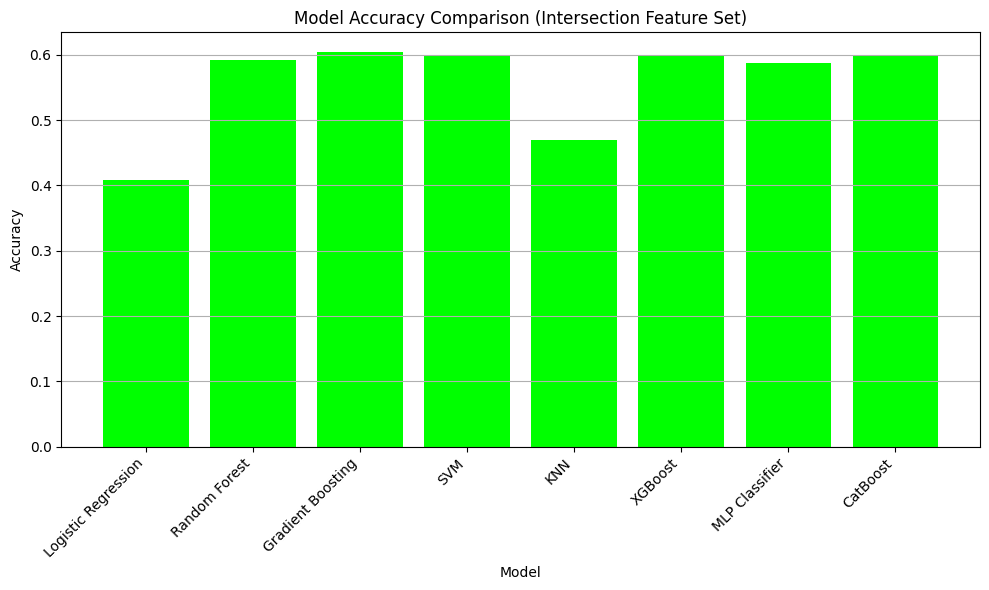

In [125]:
# Prepare Comparison Table - Intersection Set
intersection_results = pd.DataFrame({
    "Model": ["Logistic Regression", "Random Forest", "Gradient Boosting", "SVM",
              "KNN", "XGBoost", "MLP Classifier", "CatBoost"],
    "Accuracy": [lr_accuracy_intersection, rf_accuracy_intersection, gb_accuracy_intersection, svm_accuracy_intersection,
                 knn_accuracy_intersection, xgb_accuracy_intersection, mlp_accuracy_intersection, cat_accuracy_intersection],
    "Training Time (sec)": [lr_train_time_intersection, rf_train_time_intersection, gb_train_time_intersection, svm_train_time_intersection,
                            knn_train_time_intersection, xgb_train_time_intersection, mlp_train_time_intersection, cat_train_time_intersection],
    "Testing Time (sec)": [lr_test_time_intersection, rf_test_time_intersection, gb_test_time_intersection, svm_test_time_intersection,
                           knn_test_time_intersection, xgb_test_time_intersection, mlp_test_time_intersection, cat_test_time_intersection]
})

print("Model Comparison (Intersection Feature Set):\n")
print(intersection_results)

# Plot Accuracy
plt.figure(figsize=(10, 6))
plt.bar(intersection_results['Model'], intersection_results['Accuracy'], color='lime')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison (Intersection Feature Set)')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


# 9. Most Frequent Feature Set

# Apply SMOTE

In [126]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Extract Frequent Feature Set
X_frequent = X[frequent_features]
y_frequent = y

# Apply SMOTE
smote = SMOTE(random_state=42)
X_smote_frequent, y_smote_frequent = smote.fit_resample(X_frequent, y_frequent)

print(f"Shape of X_smote_frequent: {X_smote_frequent.shape}")
print(f"Shape of y_smote_frequent: {y_smote_frequent.shape}")
print(f"After Balancing: {Counter(y_smote_frequent)}")


Shape of X_smote_frequent: (925, 6)
Shape of y_smote_frequent: (925,)
After Balancing: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})


# 9.1 Logistic Regression 


Logistic Regression Performance (Frequent Feature Set):
Average Accuracy: 0.4714
Training Time: 0.3979 sec
Testing Time: 0.3888 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.40      0.41      0.41       185
           1       0.44      0.51      0.47       185
           2       0.51      0.34      0.40       185
           3       0.46      0.37      0.41       185
           4       0.54      0.72      0.62       185

    accuracy                           0.47       925
   macro avg       0.47      0.47      0.46       925
weighted avg       0.47      0.47      0.46       925



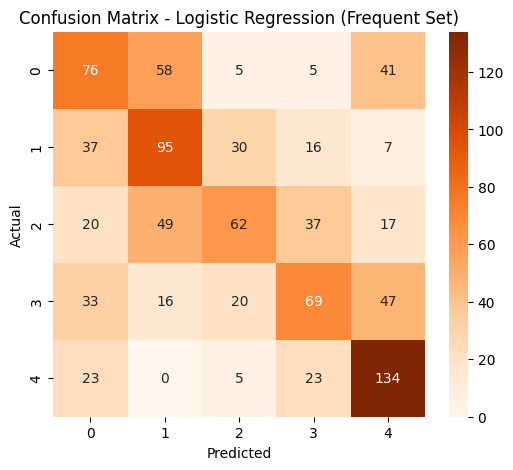

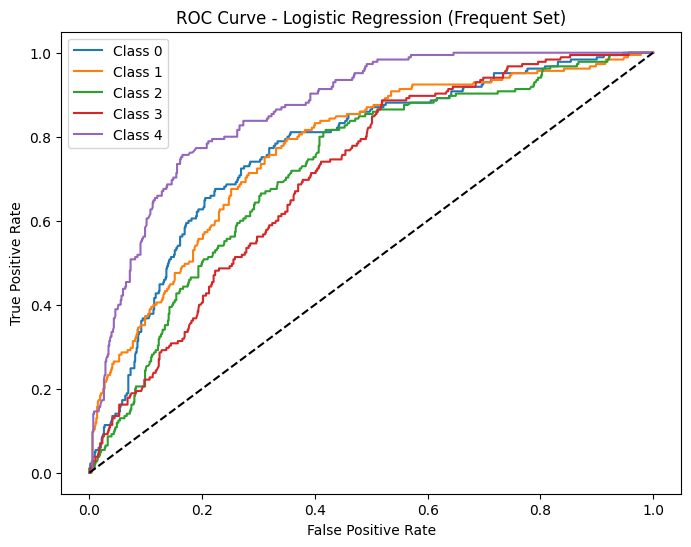

In [127]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Initialize Logistic Regression
log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(log_reg, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(log_reg, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

# Print results
print("\nLogistic Regression Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

# Store results
lr_accuracy_frequent = cv_scores.mean()
lr_train_time_frequent = end_train - start_train
lr_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (Frequent Set)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(log_reg, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression (Frequent Set)")
plt.legend()
plt.show()


# 9.2 Random Forest Classifier


Random Forest Performance (Frequent Feature Set):
Average Accuracy: 0.6260
Training Time: 2.0964 sec
Testing Time: 2.1099 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.82      0.79       185
           1       0.53      0.46      0.49       185
           2       0.53      0.49      0.51       185
           3       0.53      0.51      0.52       185
           4       0.74      0.85      0.79       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.62       925
weighted avg       0.62      0.63      0.62       925



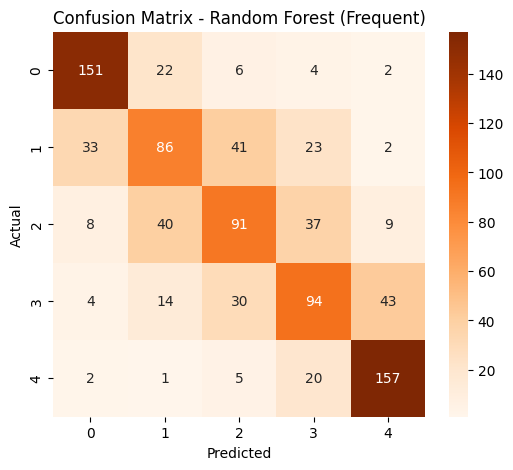

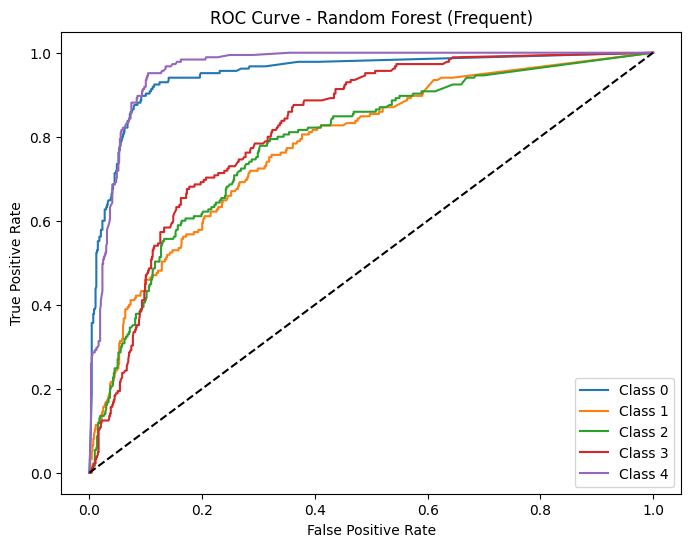

In [128]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(rf, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(rf, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

# Performance metrics
print("\nRandom Forest Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

rf_accuracy_frequent = cv_scores.mean()
rf_train_time_frequent = end_train - start_train
rf_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(rf, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest (Frequent)")
plt.legend()
plt.show()


# 9.3 Gradient Boosting Classifier


Gradient Boosting Performance (Frequent Feature Set):
Average Accuracy: 0.6206
Training Time: 7.3558 sec
Testing Time: 7.3468 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.81      0.80       185
           1       0.58      0.41      0.48       185
           2       0.51      0.56      0.54       185
           3       0.50      0.50      0.50       185
           4       0.70      0.82      0.76       185

    accuracy                           0.62       925
   macro avg       0.62      0.62      0.61       925
weighted avg       0.62      0.62      0.61       925



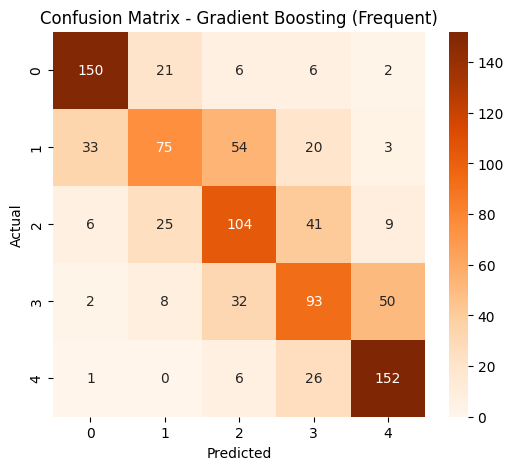

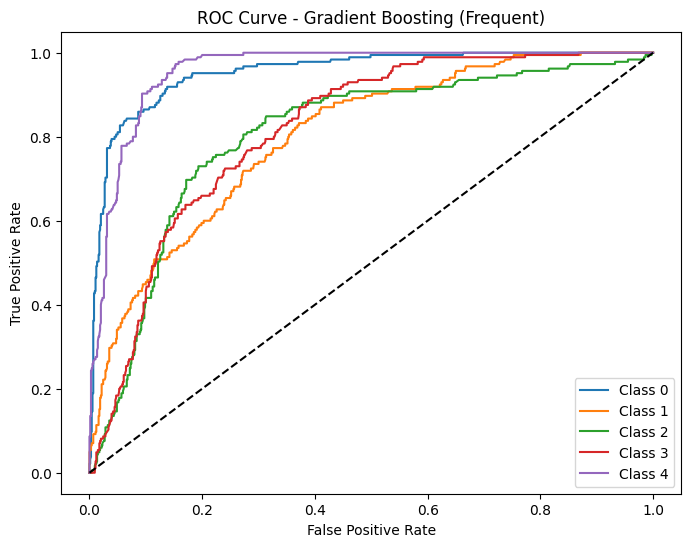

In [129]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting
gb = GradientBoostingClassifier(random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(gb, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(gb, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

print("\nGradient Boosting Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

gb_accuracy_frequent = cv_scores.mean()
gb_train_time_frequent = end_train - start_train
gb_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Gradient Boosting (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(gb, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Gradient Boosting (Frequent)")
plt.legend()
plt.show()


# 9.4 SVM


SVM Performance (Frequent Feature Set):
Average Accuracy: 0.4973
Training Time: 1.6021 sec
Testing Time: 1.5745 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.66      0.55       185
           1       0.50      0.46      0.48       185
           2       0.44      0.32      0.38       185
           3       0.45      0.35      0.40       185
           4       0.60      0.69      0.64       185

    accuracy                           0.50       925
   macro avg       0.49      0.50      0.49       925
weighted avg       0.49      0.50      0.49       925



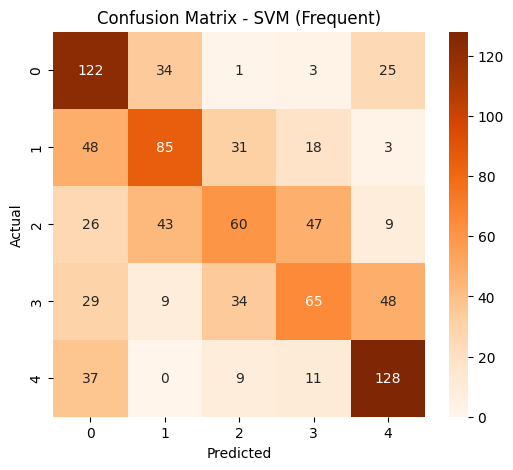

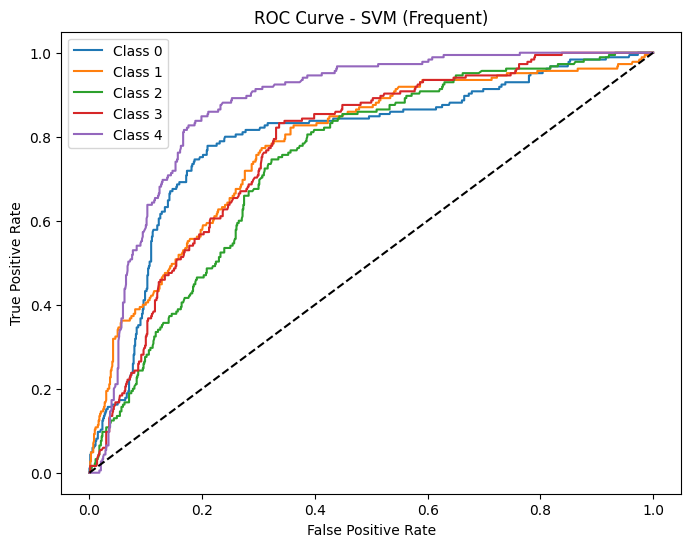

In [130]:
from sklearn.svm import SVC

# Initialize SVM
svm = SVC(kernel='linear', probability=True, random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(svm, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(svm, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

print("\nSVM Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

svm_accuracy_frequent = cv_scores.mean()
svm_train_time_frequent = end_train - start_train
svm_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - SVM (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(svm, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - SVM (Frequent)")
plt.legend()
plt.show()


# 9.5 KNN


KNN Performance (Frequent Feature Set):
Average Accuracy: 0.5796
Training Time: 0.2331 sec
Testing Time: 0.1071 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.81      0.76       185
           1       0.47      0.44      0.46       185
           2       0.47      0.51      0.49       185
           3       0.47      0.45      0.46       185
           4       0.76      0.68      0.72       185

    accuracy                           0.58       925
   macro avg       0.58      0.58      0.58       925
weighted avg       0.58      0.58      0.58       925



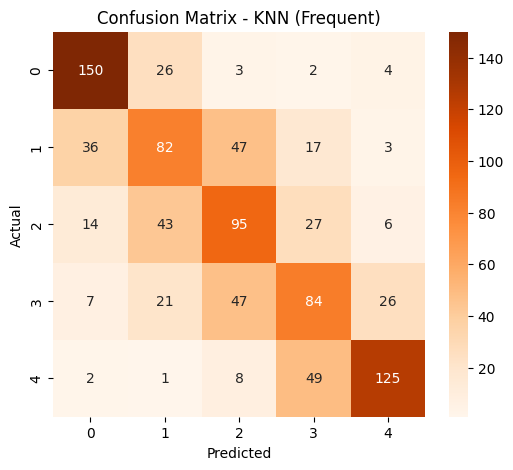

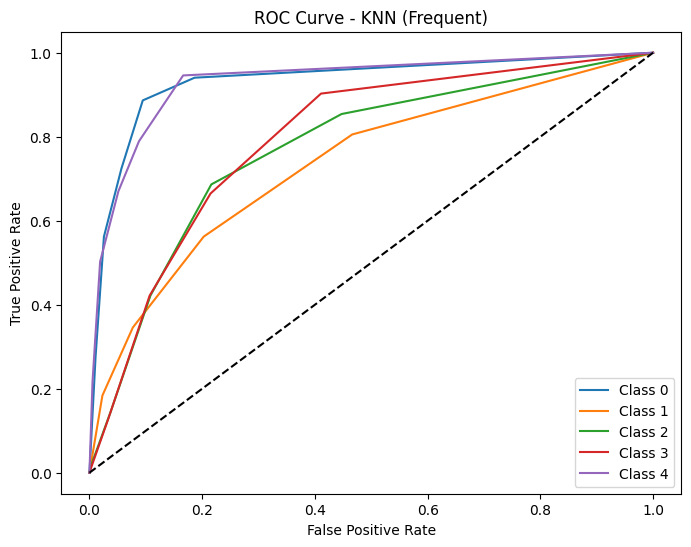

In [131]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize KNN
knn = KNeighborsClassifier(n_neighbors=5)

# Training time
start_train = time.time()
cv_scores = cross_val_score(knn, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(knn, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

print("\nKNN Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

knn_accuracy_frequent = cv_scores.mean()
knn_train_time_frequent = end_train - start_train
knn_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KNN (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(knn, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - KNN (Frequent)")
plt.legend()
plt.show()


# 9.6 XGBoost Classifier


XGBoost Performance (Frequent Feature Set):
Average Accuracy: 0.6239
Training Time: 2.3703 sec
Testing Time: 2.2303 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.80      0.79       185
           1       0.54      0.46      0.50       185
           2       0.51      0.51      0.51       185
           3       0.52      0.49      0.50       185
           4       0.75      0.85      0.80       185

    accuracy                           0.62       925
   macro avg       0.62      0.62      0.62       925
weighted avg       0.62      0.62      0.62       925



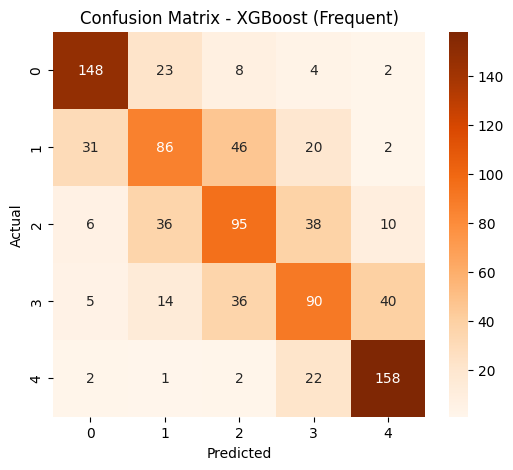

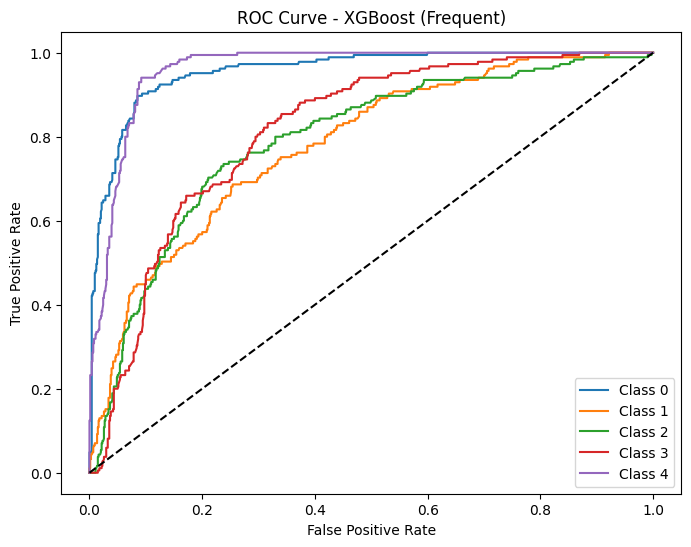

In [132]:
from xgboost import XGBClassifier

# Initialize XGBoost
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(xgb, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(xgb, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

print("\nXGBoost Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

xgb_accuracy_frequent = cv_scores.mean()
xgb_train_time_frequent = end_train - start_train
xgb_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(xgb, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - XGBoost (Frequent)")
plt.legend()
plt.show()


# 9.7 MLP


MLP Classifier Performance (Frequent Feature Set):
Average Accuracy: 0.5980
Training Time: 19.0876 sec
Testing Time: 19.9319 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.79      0.77       185
           1       0.51      0.40      0.45       185
           2       0.50      0.51      0.50       185
           3       0.51      0.49      0.50       185
           4       0.68      0.79      0.73       185

    accuracy                           0.60       925
   macro avg       0.59      0.60      0.59       925
weighted avg       0.59      0.60      0.59       925



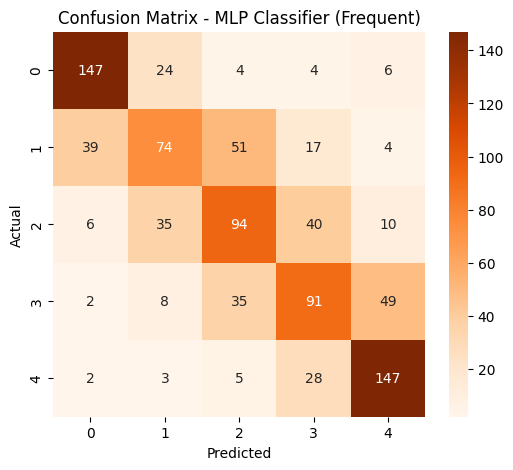

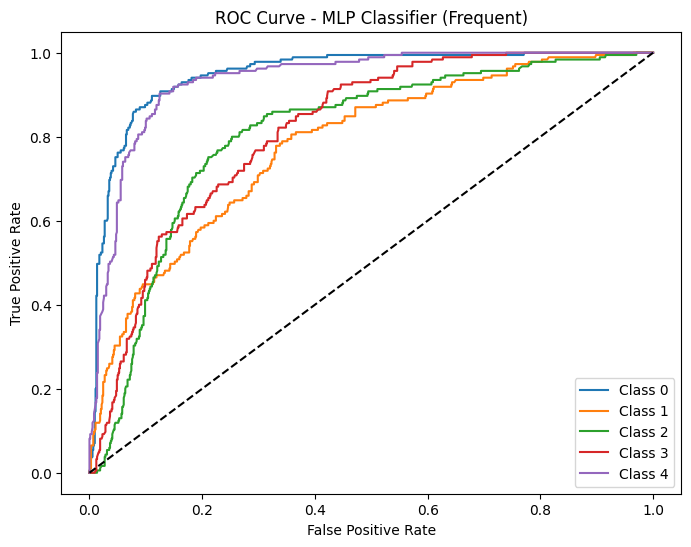

In [133]:
from sklearn.neural_network import MLPClassifier

# Initialize MLP
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(mlp, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(mlp, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

print("\nMLP Classifier Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

mlp_accuracy_frequent = cv_scores.mean()
mlp_train_time_frequent = end_train - start_train
mlp_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MLP Classifier (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(mlp, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - MLP Classifier (Frequent)")
plt.legend()
plt.show()


# 9.8 CatBoost Classifier


CatBoost Performance (Frequent Feature Set):
Average Accuracy: 0.6282
Training Time: 11.1370 sec
Testing Time: 10.6378 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.82      0.80       185
           1       0.53      0.46      0.49       185
           2       0.50      0.49      0.49       185
           3       0.53      0.52      0.53       185
           4       0.76      0.85      0.80       185

    accuracy                           0.63       925
   macro avg       0.62      0.63      0.62       925
weighted avg       0.62      0.63      0.62       925



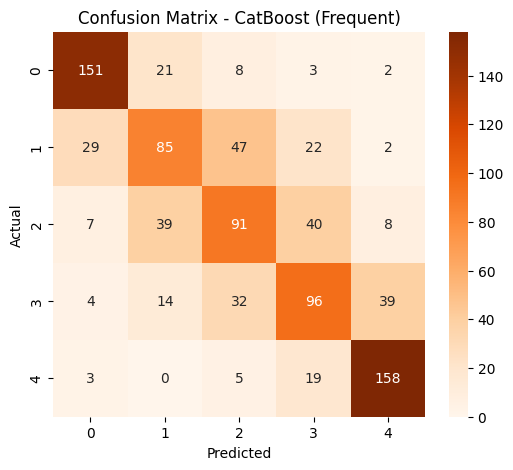

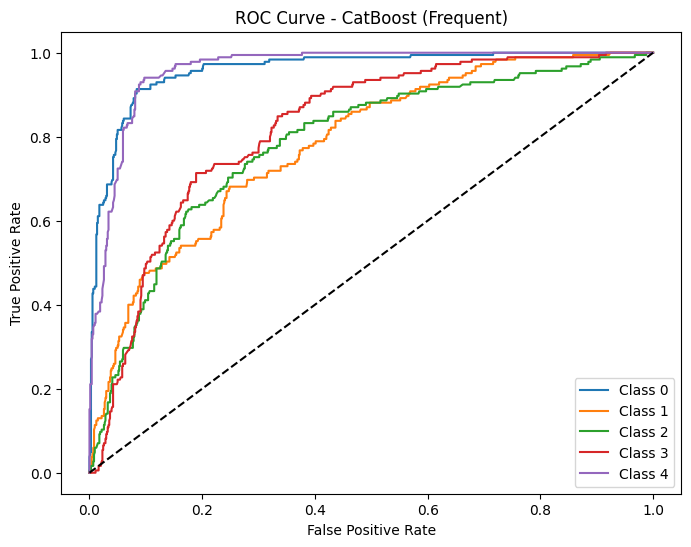

In [134]:
from catboost import CatBoostClassifier

# Initialize CatBoost
cat = CatBoostClassifier(verbose=0, random_state=42)

# Training time
start_train = time.time()
cv_scores = cross_val_score(cat, X_smote_frequent, y_smote_frequent, cv=10, scoring='accuracy')
end_train = time.time()

# Testing time
start_test = time.time()
y_pred = cross_val_predict(cat, X_smote_frequent, y_smote_frequent, cv=10)
end_test = time.time()

print("\nCatBoost Performance (Frequent Feature Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")

print("\nClassification Report:")
print(classification_report(y_smote_frequent, y_pred))

cat_accuracy_frequent = cv_scores.mean()
cat_train_time_frequent = end_train - start_train
cat_test_time_frequent = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_smote_frequent, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Oranges", xticklabels=np.unique(y_smote_frequent), yticklabels=np.unique(y_smote_frequent))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CatBoost (Frequent)")
plt.show()

# ROC Curve
y_prob = cross_val_predict(cat, X_smote_frequent, y_smote_frequent, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_smote_frequent))):
    fpr, tpr, _ = roc_curve(y_smote_frequent == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CatBoost (Frequent)")
plt.legend()
plt.show()


# Model Performance Comparison – Frequent Feature Set


Model Performance Comparison (Frequent Feature Set):


,Model,Accuracy,Training Time (s),Testing Time (s)
0,Logistic Regression,0.471424,0.397853,0.388779
1,Random Forest,0.626029,2.096392,2.109855
2,Gradient Boosting,0.620605,7.355803,7.346835
3,SVM,0.497253,1.602095,1.574468
4,KNN,0.579617,0.233113,0.107058
5,XGBoost,0.623925,2.370347,2.230255
6,MLP Classifier,0.597966,19.087556,19.931875
7,CatBoost,0.628226,11.136953,10.637791


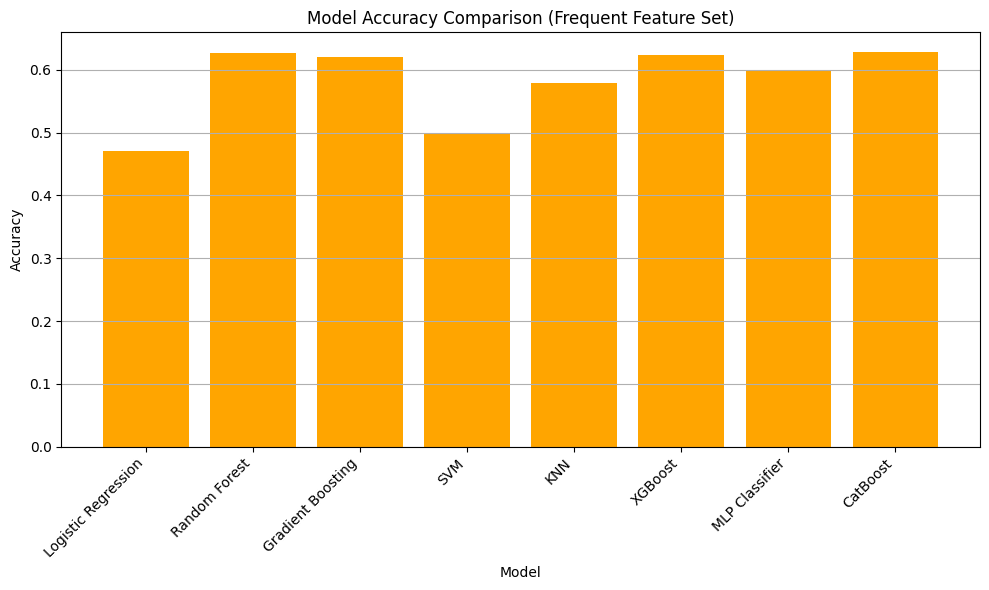

In [135]:
# Create DataFrame for comparison
comparison_frequent = pd.DataFrame({
    "Model": [
        "Logistic Regression", "Random Forest", "Gradient Boosting", "SVM",
        "KNN", "XGBoost", "MLP Classifier", "CatBoost"
    ],
    "Accuracy": [
        lr_accuracy_frequent, rf_accuracy_frequent, gb_accuracy_frequent, svm_accuracy_frequent,
        knn_accuracy_frequent, xgb_accuracy_frequent, mlp_accuracy_frequent, cat_accuracy_frequent
    ],
    "Training Time (s)": [
        lr_train_time_frequent, rf_train_time_frequent, gb_train_time_frequent, svm_train_time_frequent,
        knn_train_time_frequent, xgb_train_time_frequent, mlp_train_time_frequent, cat_train_time_frequent
    ],
    "Testing Time (s)": [
        lr_test_time_frequent, rf_test_time_frequent, gb_test_time_frequent, svm_test_time_frequent,
        knn_test_time_frequent, xgb_test_time_frequent, mlp_test_time_frequent, cat_test_time_frequent
    ]
})

# Display table
print("\nModel Performance Comparison (Frequent Feature Set):")
display(comparison_frequent)

# Plot Accuracy
plt.figure(figsize=(10, 6))
plt.bar(comparison_frequent['Model'], comparison_frequent['Accuracy'], color='orange')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison (Frequent Feature Set)')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


# Overall Comparison

# Define Conversion Functions

In [136]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# For list-based result dictionaries
def convert_list_results_to_df(result_dict, feature_set_name):
    return pd.DataFrame({
        "Feature Set": [feature_set_name] * len(result_dict["Model"]),
        "Model": result_dict["Model"],
        "Accuracy": result_dict["Accuracy"],
        "Training Time (s)": result_dict["Training Time (s)"],
        "Testing Time (s)": result_dict["Testing Time (s)"]
    })

# For DataFrame-based results (your union, intersection, all, frequent sets)
def standardize_comparison_df(comparison_df, feature_set_name):
    df = comparison_df.copy()
    df["Feature Set"] = feature_set_name
    df = df.rename(columns={
        "Training Time (sec)": "Training Time (s)",
        "Testing Time (sec)": "Testing Time (s)"
    })
    return df[["Feature Set", "Model", "Accuracy", "Training Time (s)", "Testing Time (s)"]]


# Convert All Results to DataFrames

In [137]:
# Convert list-based results
rf_df = convert_list_results_to_df(rf_results, "Random Forest FS")
chi2_df = convert_list_results_to_df(chi2_results, "Chi-Square FS")
gb_df = convert_list_results_to_df(gb_results, "Gradient Boosting FS")
mi_df = convert_list_results_to_df(mi_results, "Mutual Information FS")
anova_df = convert_list_results_to_df(anova_results, "ANOVA F-Test FS")
lasso_df = convert_list_results_to_df(lasso_results, "Lasso FS")

# Convert DataFrame-based results
union_df = standardize_comparison_df(results_union, "Union FS")
intersection_df = standardize_comparison_df(intersection_results, "Intersection FS")
all_df = standardize_comparison_df(comparison_all, "All Features")
frequent_df = standardize_comparison_df(comparison_frequent, "Frequent FS")


# Combine All DataFrames

In [138]:
final_comparison_df = pd.concat([
   all_df, rf_df, chi2_df, gb_df, mi_df, anova_df, lasso_df,
    union_df, intersection_df, frequent_df
], ignore_index=True)

print("Overall Model Performance Comparison:\n")
print(final_comparison_df)


Overall Model Performance Comparison:

     Feature Set                Model  Accuracy  Training Time (s)  \
0   All Features  Logistic Regression  0.530972           1.199244   
1   All Features        Random Forest  0.714656           2.584114   
2   All Features    Gradient Boosting  0.664914          13.500162   
3   All Features                  SVM  0.650853           2.549876   
4   All Features                  KNN  0.613090           0.154558   
..           ...                  ...       ...                ...   
75   Frequent FS                  SVM  0.497253           1.602095   
76   Frequent FS                  KNN  0.579617           0.233113   
77   Frequent FS              XGBoost  0.623925           2.370347   
78   Frequent FS       MLP Classifier  0.597966          19.087556   
79   Frequent FS             CatBoost  0.628226          11.136953   

    Testing Time (s)  
0           1.186443  
1           2.586887  
2          13.536303  
3           2.568204  
4    

# Sort and Display Top 10 Results

In [139]:
# Sort and display top 10
top_10_results = final_comparison_df.sort_values(by="Accuracy", ascending=False).head(10)
print("\nTop 10 Best Performing Models:\n")
print(top_10_results[["Feature Set", "Model", "Accuracy"]])



Top 10 Best Performing Models:

              Feature Set          Model  Accuracy
1            All Features  Random Forest  0.714656
7            All Features       CatBoost  0.708216
63               Union FS       CatBoost  0.696377
57               Union FS  Random Forest  0.695290
5            All Features        XGBoost  0.687681
61               Union FS        XGBoost  0.686734
25   Gradient Boosting FS  Random Forest  0.686606
33  Mutual Information FS  Random Forest  0.684350
49               Lasso FS  Random Forest  0.677910
39  Mutual Information FS       CatBoost  0.673668


# Hyperparameter Tuning

# Data Preparation
# Check Class Imbalance

In [140]:
from collections import Counter

# Check Class Distribution
class_counts = Counter(df['CGPA'])
print("Class Distribution:", class_counts)

# Check for imbalance
imbalance_threshold = 0.10
class_percentages = {k: v / sum(class_counts.values()) for k, v in class_counts.items()}
if any(v < imbalance_threshold for v in class_percentages.values()):
    print("⚠️ Class imbalance detected! Consider applying SMOTE.")
else:
    print("✅ Class distribution looks balanced.")


Class Distribution: Counter({1: 185, 2: 162, 3: 141, 4: 71, 0: 51})
⚠️ Class imbalance detected! Consider applying SMOTE.


# Apply SMOTE (All Features)

In [141]:
from imblearn.over_sampling import SMOTE
import pandas as pd

# Separate Features & Target
X = df.drop(columns=['CGPA'])   
y = df['CGPA']                  # Target

# Apply SMOTE
smote = SMOTE(sampling_strategy="auto", random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

print("After SMOTE:", Counter(y_resampled))
print("Resampled Data Shape:", X_resampled.shape)

After SMOTE: Counter({2: 185, 1: 185, 4: 185, 3: 185, 0: 185})
Resampled Data Shape: (925, 32)


# Random Forest Hyperparameter Tuning

Fitting 10 folds for each of 48 candidates, totalling 480 fits

✅ Best Hyperparameters Found:
{'bootstrap': True, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}

⏰ Hyperparameter tuning time: 159.34 seconds

🌟 Tuned Random Forest Classifier Performance (All Features Set):
Average Accuracy: 0.7222
Training Time: 12.6329 sec
Testing Time: 12.6058 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       185
           1       0.61      0.55      0.58       185
           2       0.56      0.58      0.57       185
           3       0.72      0.64      0.67       185
           4       0.83      0.91      0.87       185

    accuracy                           0.72       925
   macro avg       0.72      0.72      0.72       925
weighted avg       0.72      0.72      0.72       925



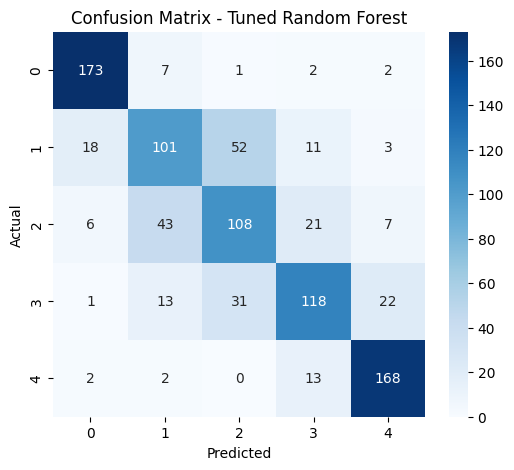

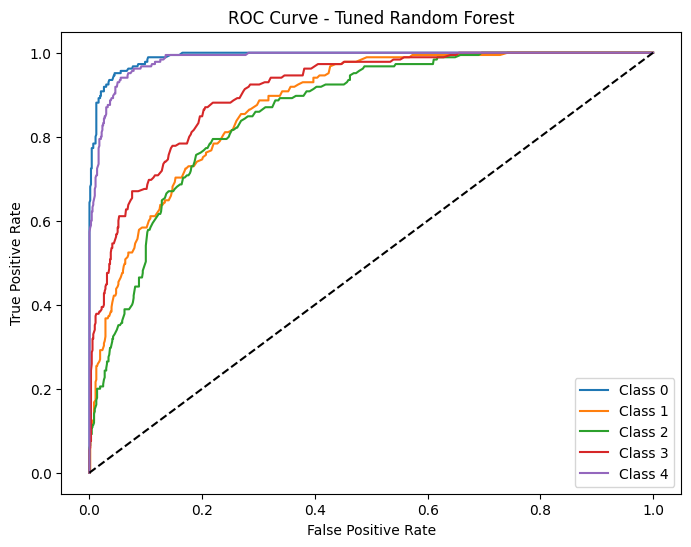

In [142]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np

# Define parameter grid
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [None, 20, 30, 50],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True]
}

# Initialize base model
base_rf = RandomForestClassifier(random_state=42)

# Hyperparameter Tuning
start_tune = time.time()
grid_search = GridSearchCV(base_rf, param_grid, cv=10, n_jobs=-1, verbose=1)
grid_search.fit(X_resampled, y_resampled)
end_tune = time.time()

print("\n✅ Best Hyperparameters Found:")
print(grid_search.best_params_)
print(f"\n⏰ Hyperparameter tuning time: {end_tune - start_tune:.2f} seconds")

# Use best model from grid search
best_rf = grid_search.best_estimator_

# Measure training time
start_train = time.time()
cv_scores = cross_val_score(best_rf, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

# Measure testing time
start_test = time.time()
y_pred = cross_val_predict(best_rf, X_resampled, y_resampled, cv=10)
end_test = time.time()

# Performance metrics
print("\n🌟 Tuned Random Forest Classifier Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred))

# Save for later comparison if needed
rf_accuracy_tuned = cv_scores.mean()
rf_train_time_tuned = end_train - start_train
rf_test_time_tuned = end_test - start_test

# Confusion Matrix
conf_matrix = confusion_matrix(y_resampled, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Tuned Random Forest")
plt.show()

# ROC Curve
y_prob = cross_val_predict(best_rf, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Tuned Random Forest")
plt.legend()
plt.show()


# CatBoost Hyperparameter Tuning

Fitting 10 folds for each of 20 candidates, totalling 200 fits

✅ Best Hyperparameters for CatBoost:
{'learning_rate': 0.2, 'l2_leaf_reg': 3, 'iterations': 500, 'depth': 10, 'border_count': 32}

⏰ Hyperparameter tuning time: 366.59 seconds

🌟 Tuned CatBoost Classifier Performance (All Features Set):
Average Accuracy: 0.7266
Training Time: 32.7751 sec
Testing Time: 32.4067 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.94      0.92       185
           1       0.65      0.54      0.59       185
           2       0.54      0.57      0.55       185
           3       0.70      0.66      0.68       185
           4       0.83      0.92      0.87       185

    accuracy                           0.73       925
   macro avg       0.72      0.73      0.72       925
weighted avg       0.72      0.73      0.72       925



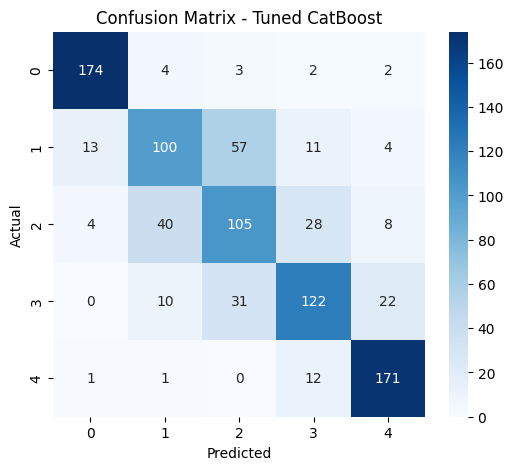

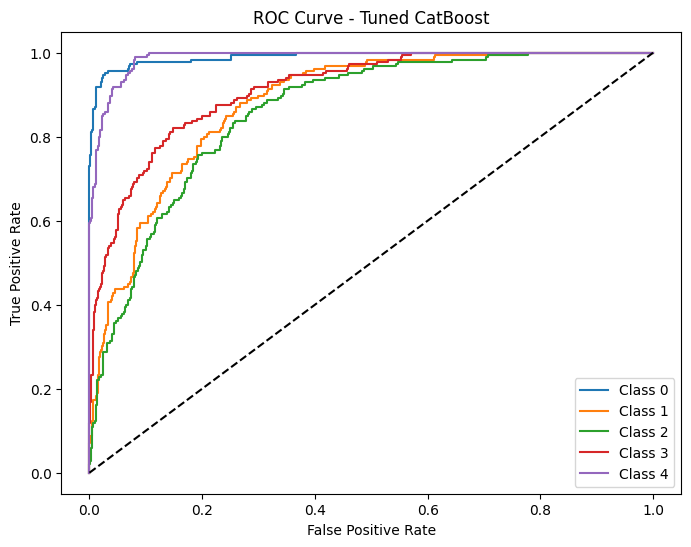

In [143]:
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import time
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the hyperparameter grid for CatBoost
cat_param_grid = {
    'iterations': [200, 500, 1000],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'l2_leaf_reg': [1, 3, 5, 7],
    'border_count': [32, 64, 128]
}

# Initialize CatBoost model
cat_model = CatBoostClassifier(verbose=0, random_state=42)

# Set up RandomizedSearchCV with 10-fold cross-validation
cat_random_search = RandomizedSearchCV(
    estimator=cat_model,
    param_distributions=cat_param_grid,
    n_iter=20,               # Testing 20 random parameter combinations
    cv=10,                   # 10-Fold CV
    verbose=2,
    random_state=42,
    n_jobs=-1,
    scoring='accuracy'
)

# Tuning: Fit the model using the entire resampled dataset (X_resampled, y_resampled)
start_tune = time.time()
cat_random_search.fit(X_resampled, y_resampled)
end_tune = time.time()

print("\n✅ Best Hyperparameters for CatBoost:")
print(cat_random_search.best_params_)
print(f"\n⏰ Hyperparameter tuning time: {end_tune - start_tune:.2f} seconds")

# Use the best estimator for evaluation
best_cat = cat_random_search.best_estimator_

# Evaluate the tuned model using 10-fold cross-validation
start_train = time.time()
cv_scores_cat = cross_val_score(best_cat, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

start_test = time.time()
y_pred_cat = cross_val_predict(best_cat, X_resampled, y_resampled, cv=10)
end_test = time.time()

print("\n🌟 Tuned CatBoost Classifier Performance (All Features Set):")
print(f"Average Accuracy: {cv_scores_cat.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred_cat))

# Save metrics for future comparisons (if needed)
cat_accuracy_tuned = cv_scores_cat.mean()
cat_train_time_tuned = end_train - start_train
cat_test_time_tuned = end_test - start_test

# Confusion Matrix
conf_matrix_cat = confusion_matrix(y_resampled, y_pred_cat)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_cat, annot=True, fmt="d", cmap="Blues", 
            xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Tuned CatBoost")
plt.show()

# ROC Curve for multiclass evaluation using cross_val_predict
y_prob_cat = cross_val_predict(best_cat, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob_cat[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Tuned CatBoost")
plt.legend()
plt.show()


# SVM Hyperparameter Tuning

Fitting 10 folds for each of 18 candidates, totalling 180 fits

✅ Best Hyperparameters for SVM:
{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}

⏰ Hyperparameter tuning time: 66.98 seconds

🌟 Tuned SVM Classifier Performance (All Features Set):
Average Accuracy: 0.7082
Training Time: 3.3807 sec
Testing Time: 3.3632 sec

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.96      0.92       185
           1       0.54      0.53      0.53       185
           2       0.49      0.46      0.48       185
           3       0.73      0.66      0.70       185
           4       0.86      0.92      0.89       185

    accuracy                           0.71       925
   macro avg       0.70      0.71      0.70       925
weighted avg       0.70      0.71      0.70       925



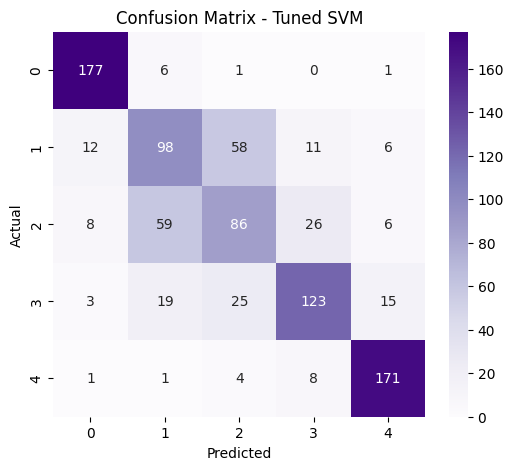

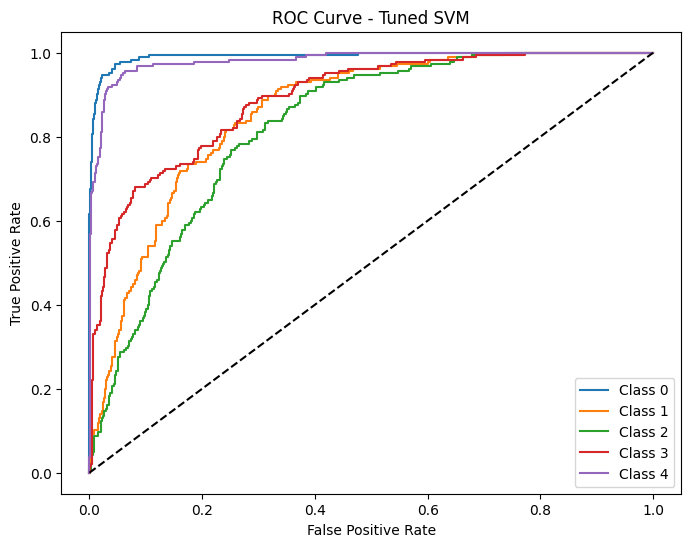

In [144]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import time
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define parameter grid
svm_param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto']
}

# Initialize base model
base_svm = SVC(probability=True, random_state=42)

# Hyperparameter Tuning
start_tune = time.time()
grid_search_svm = GridSearchCV(base_svm, svm_param_grid, cv=10, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_svm.fit(X_resampled, y_resampled)
end_tune = time.time()

print("\n✅ Best Hyperparameters for SVM:")
print(grid_search_svm.best_params_)
print(f"\n⏰ Hyperparameter tuning time: {end_tune - start_tune:.2f} seconds")

# Best model
best_svm = grid_search_svm.best_estimator_

# Training
start_train = time.time()
svm_cv_scores = cross_val_score(best_svm, X_resampled, y_resampled, cv=10, scoring='accuracy')
end_train = time.time()

# Testing
start_test = time.time()
y_pred_svm = cross_val_predict(best_svm, X_resampled, y_resampled, cv=10)
end_test = time.time()

# Performance
print("\n🌟 Tuned SVM Classifier Performance (All Features Set):")
print(f"Average Accuracy: {svm_cv_scores.mean():.4f}")
print(f"Training Time: {end_train - start_train:.4f} sec")
print(f"Testing Time: {end_test - start_test:.4f} sec")
print("\nClassification Report:")
print(classification_report(y_resampled, y_pred_svm))

# Save metrics for future comparisons (if needed)
svm_accuracy_tuned = svm_cv_scores.mean()
svm_train_time_tuned = end_train - start_train
svm_test_time_tuned = end_test - start_test

# Confusion Matrix
conf_matrix_svm = confusion_matrix(y_resampled, y_pred_svm)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_svm, annot=True, fmt="d", cmap="Purples",
            xticklabels=np.unique(y_resampled), yticklabels=np.unique(y_resampled))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Tuned SVM")
plt.show()

# ROC Curve
y_prob_svm = cross_val_predict(best_svm, X_resampled, y_resampled, cv=10, method="predict_proba")
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_resampled))):
    fpr, tpr, _ = roc_curve(y_resampled == i, y_prob_svm[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Tuned SVM")
plt.legend()
plt.show()


# Comparing result without tuned and with tuned

🔍 Tuned vs Untuned Model Performance Comparison:
           Model  Version  Accuracy  Training Time (s)  Testing Time (s)
0  Random Forest  Untuned  0.714656           2.584114          2.586887
1  Random Forest    Tuned  0.722242          12.632856         12.605773
2       CatBoost  Untuned  0.708216          17.011332         17.140143
3       CatBoost    Tuned  0.726566          32.775089         32.406716
4            SVM  Untuned  0.650853           2.549876          2.568204
5            SVM    Tuned  0.708205           3.380748          3.363168


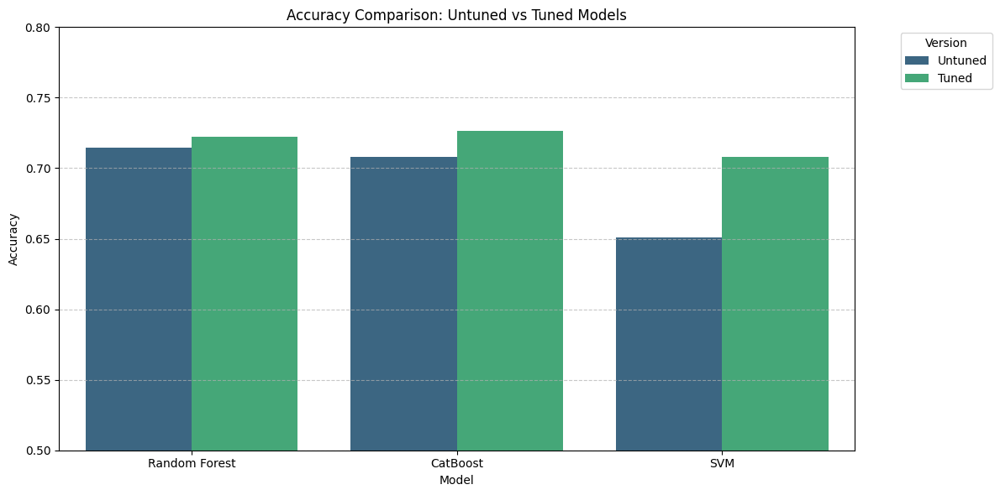

In [145]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a dictionary for untuned and tuned results for all models including SVM
data = {
    'Model': ['Random Forest', 'Random Forest', 
              'CatBoost', 'CatBoost', 
              'SVM', 'SVM'],
    'Version': ['Untuned', 'Tuned', 
                'Untuned', 'Tuned', 
                'Untuned', 'Tuned'],
    'Accuracy': [rf_accuracy_all, rf_accuracy_tuned, 
                 cat_accuracy_all, cat_accuracy_tuned, 
                 svm_accuracy_all, svm_accuracy_tuned],
    'Training Time (s)': [rf_train_time_all, rf_train_time_tuned, 
                          cat_train_time_all, cat_train_time_tuned,
                          svm_train_time_all, svm_train_time_tuned],
    'Testing Time (s)': [rf_test_time_all, rf_test_time_tuned, 
                         cat_test_time_all, cat_test_time_tuned,
                         svm_test_time_all, svm_test_time_tuned]
}

# Create DataFrame
comparison_df = pd.DataFrame(data)

# Display the comparison table
print("🔍 Tuned vs Untuned Model Performance Comparison:")
print(comparison_df)

# Plot a horizontal bar chart for Accuracy comparison
plt.figure(figsize=(12, 6))
sns.barplot(data=comparison_df, y='Accuracy', x='Model', hue='Version', palette='viridis', orient='v')
plt.title("Accuracy Comparison: Untuned vs Tuned Models")
plt.ylabel("Accuracy")
plt.xlabel("Model")
plt.ylim(0.5, 0.8)  # Adjust this based on your SVM results
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title="Version", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
